# Lab1

## Task 2.2:
Biases and assumptions
Prepare a list of possible biases or assumptions you have as you begin this task. Discuss this
issue within your team (all team members should contribute to this task). Store this list for
further use and interpretation of results in the latter part of the project.



1.   No information about building age or condition
---
There are many missing values in the dataset. Mainly the build year and condition. Because of this we decided to not take the building's age into account, especially that it doesn't seem to have that much effect on the price of an apartment.

2.  Bias towards Warsaw
---
Most apartments in the dataset are located in Warsaw, which in itself not surprising just that it changes the way to look at the data. For example the correlation matrix suggests that latitude does not have an effect on the pricing, but we need to remember that the correlation is just an average value.
Warsaw is rougly in the middle of Poland which results in an average close to zero. Simmilarly it's somewhat east from the center which results in a slight positive correlation of longitude

3. Data source bias
---
Data was collected from websites that may not be representative

## Task 2.3: Related work
Look for information about your project dataset. Enumerate all the work done previously on this dataset by others, describe its contents (what was done, what libraries or programming languages were used, the goals of the analyses, and the general conclusions obtained by the authors).

### The work found on our Dataset

[The Article found on this dataset](https://bibliotekanauki.pl/chapters/59496139.pdf)


This PDF is a scientific article in Polish titled **"Predykcja cen mieszkań w dużych miastach w Polsce z wykorzystaniem uczenia maszynowego"** (Predicting Housing Prices in Major Cities in Poland Using Machine Learning) by **Wiktoria Galarowicz**. This article uses the dataset we are interested in.

### Analysis of Work Done on the Dataset

The article's primary objective is to **create machine learning models to predict apartment prices** in major Polish cities and determine which property and surrounding area features most influence pricing.

### 1. Dataset and Contents
The data used in the analysis comes from **Kaggle.com** and is the **"Apartment Prices in Poland"** dataset by **Krzysztof Jamroz**.

* **Scope:** The data covers apartment prices and features in **fifteen largest cities in Poland** (e.g., Warsaw, Kraków, Wrocław, Gdańsk).
* **Time Period:** The dataset spans the period from **August 2023 to January 2024**.
* **Key Variables (Features):** The dataset includes variables such as the city, **`squareMeters`** (area), **`rooms`** (number of rooms), **`floor`**, **`floorCount`** (building height), **`centreDistance`** (distance from the city center), **`poiCount`** (number of points of interest nearby), distances to specific points of interest (e.g., schools, clinics, pharmacies), **`ownership`**, binary features (e.g., `hasParkingSpace`, `hasBalcony`), and the target variable, **`price`** in PLN.

### 2. Data Preparation and Cleaning
The author performed several crucial steps before modeling:

* **Deduplication:** Over 40,000 duplicates were removed, leaving a set of approximately **60,000 records**.
* **Missing Value Imputation:** The **k-Nearest Neighbors (KNN)** method was used to impute missing values for ten variables, most notably **`buildYear`** (about 17,000 missing values) and **`floor`** (about 18,000 missing values).
* **Outlier Identification:** The **DBSCAN** method, combined with the **KNEED** algorithm, was used to identify and remove outliers, resulting in the removal of approximately **14% of the data**.
* **Correlation Analysis:** A weak Pearson correlation was observed for most variables with price, justifying the choice of non-linear machine learning algorithms instead of classical regression models.

### 3. Machine Learning Models and Libraries
The analysis focused on comparing the performance of two powerful ensemble machine learning algorithms for regression:

| Model | Library/Method Used | Goal |
| :--- | :--- | :--- |
| **Random Forest (Las Losowy)** | **Hyperopt** (for hyperparameter optimization)  | Minimization of the **Root Mean Square Error (RMSE)**  |
| **XGBoost** | **Hyperopt** (for hyperparameter optimization)  | Minimization of the **Root Mean Square Error (RMSE)** |

### 4. General Conclusions and Results

**Conclusion:** The **XGBoost model** significantly outperformed the Random Forest model, providing much more precise predictions.

| Metric | Random Forest Model | XGBoost Model | Interpretation |
| :--- | :--- | :--- | :--- |
| **RMSE (Root Mean Square Error)** | $\approx 168,000\text{ PLN}$  | $\approx 104,000\text{ PLN}$ | XGBoost has a lower prediction error. |
| **MAPE (Mean Absolute Percentage Error)** |  $\approx 17\%$  | $\approx 9\%$  | XGBoost predicts prices with $\approx 91\%$ accuracy. |
| **$\text{R}^2$ (Coefficient of Determination)** | $0.774$  | $0.913$   | XGBoost accounts for a much higher variance in the data. |

**Key Variable Importance:**

* **Random Forest:** The most important factors were the **apartment size ($\text{squareMeters}$)** (20% importance), the **number of rooms**, the indicator for being **in Warsaw**, and the **$\text{buildYear}$**.
* **XGBoost:** The most important factor was **location** (the city), especially the indicator for being **in Warsaw** ($\approx 23\%$ importance). Apartment size and number of rooms had a much smaller influence ($\approx 2\%$ each) in this model.

The **XGBoost model** was deemed **highly effective**, predicting prices well across both lower and higher price segments, while the Random Forest model struggled with more expensive or luxury apartments (over 1.25 million PLN).

## Task 2.4
Prepare a report on the results of Task 2.3. This report will serve as the second
chapter of your project report. It should be prepared in a text editor or in LaTeX (a Python
notebook is not an acceptable form of a report).
You are encouraged to use generative AI for this task. However, make sure to store the
prompts used for this purpose. You should prepare an appendix to the report where you
describe how you obtained this chapter. Feel free to discuss the use of prompts with the
teacher



[Report link](https://docs.google.com/document/d/1DCqsKYYOo5C0MV8OM1Fc3piMReAZrFuQfkU9a0PliHc/edit?usp=sharing)


## Task 2.5: Dataset loading
Download your project dataset, store it in your Google Drive, and then connect it to your
Colab account. Show the description of the dataset to ensure its correct connection to your
code.

In [ ]:


# Download latest version
path = kagglehub.dataset_download("krzysztofjamroz/apartment-prices-in-poland")
print("Path to dataset files:", path)
#----------
# List files in the downloaded directory to find the CSV file
print("Files in the dataset directory:")
for root, dirs, files in os.walk(path):
    for file in files:
        print(os.path.join(root, file))

df = pd.read_csv('/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_rent_pl_2023_11.csv')


100%|██████████| 15.8M/15.8M [00:00<00:00, 168MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9
Files in the dataset directory:
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_pl_2023_09.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_pl_2024_04.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_pl_2024_01.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_rent_pl_2024_04.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_rent_pl_2024_02.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_pl_2023_11.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_rent_pl_2024_05.csv
/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-pr

In [ ]:
# TESTING
path = "/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/"
files = glob.glob(os.path.join(path, "*apartments_pl*"))
dfs = [pd.read_csv(f) for f in files]

df = pd.concat(dfs,ignore_index=True)
cities = df['city'].unique()

df_cities = [df['city'] == city for city in cities]
'''
df_warsaw = df[df['city'].str.lower() == "krakow"]
df = df_warsaw'''


'\ndf_warsaw = df[df[\'city\'].str.lower() == "krakow"]\ndf = df_warsaw'

In [ ]:
# TESTING
numerical_cols = ['squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear',
                  'latitude', 'longitude', 'centreDistance', 'poiCount', 'price']

for city in cities:
    df_city = df[df['city'] == city]

    # Drop rows where buildYear is NaN to avoid skewed correlations
    df_city = df_city.dropna(subset=['buildYear'])

    corr_matrix = df_city[numerical_cols].corr()
    corr_matrix=corr_matrix.abs()

    # Extract correlation of buildYear with all other numerical features
    print(f"\nCity: {city}")
    print(corr_matrix['buildYear'].sort_values(ascending=False))





City: szczecin
buildYear         1.000000
poiCount          0.379429
centreDistance    0.362037
price             0.268133
floorCount        0.190482
squareMeters      0.176174
rooms             0.112355
floor             0.112053
longitude         0.049395
latitude          0.043091
Name: buildYear, dtype: float64

City: gdynia
buildYear         1.000000
centreDistance    0.476748
poiCount          0.418275
longitude         0.332633
price             0.263068
latitude          0.200970
squareMeters      0.154624
rooms             0.102866
floor             0.102261
floorCount        0.047801
Name: buildYear, dtype: float64

City: krakow
buildYear         1.000000
poiCount          0.515242
centreDistance    0.328533
floorCount        0.159137
latitude          0.075951
squareMeters      0.073232
floor             0.071270
price             0.061424
rooms             0.039091
longitude         0.022902
Name: buildYear, dtype: float64

City: poznan
buildYear         1.000000
centreDis

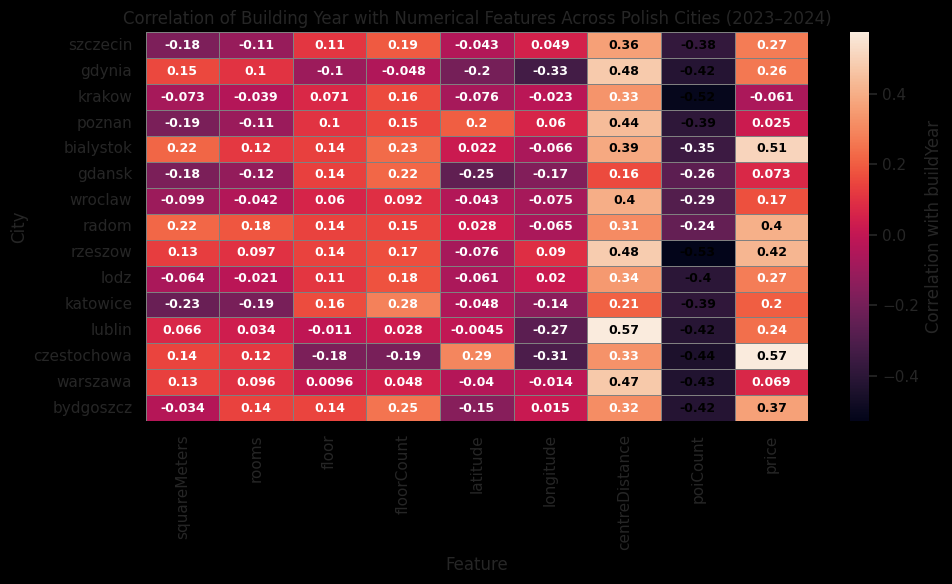

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Numerical columns (same as before)
numerical_cols = ['squareMeters', 'rooms', 'floor', 'floorCount',
                  'buildYear', 'latitude', 'longitude',
                  'centreDistance', 'poiCount', 'price']

# Compute correlation of buildYear with each numerical feature per city
city_corr = {}
for city in df['city'].unique():
    df_city = df[df['city'] == city].dropna(subset=['buildYear'])
    corr = df_city[numerical_cols].corr()['buildYear']
    city_corr[city] = corr

# Create DataFrame where rows = cities, columns = features
corr_df = pd.DataFrame(city_corr).T

# Remove 'buildYear' itself (always 1.0)
corr_df = corr_df.drop(columns=['buildYear'])
plt.style.use('dark_background')
sns.color_palette("YlOrBr", as_cmap=True)

plt.figure(figsize=(10, 6))
sns.set(font_scale=1.0)
ax = sns.heatmap(
    corr_df,
    annot=True,      # warm, vibrant color palette
    annot_kws={"color": "yellow", "fontsize": 9, "weight": "bold"},
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Correlation with buildYear'}
)
for text in ax.texts:
    val = float(text.get_text())
    # Use dark text on bright cells, white on dark ones
    text.set_color('black' if abs(val) > 0.35 else 'white')

plt.title("Correlation of Building Year with Numerical Features Across Polish Cities (2023–2024)", fontsize=12)
plt.xlabel("Feature")
plt.ylabel("City")
plt.tight_layout()
plt.show()


In [ ]:
print("Dataset shape:")
df.head()

Dataset shape:


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
1185,4097bb112dde4966a7567a6f4ba6fc2c,krakow,apartmentBuilding,64.0,2.0,2.0,5.0,2014.0,50.071396,19.954938,2.14,14.0,0.444,0.328,0.414,0.400,0.252,0.899,0.174,condominium,brick,NaN,no,yes,yes,no,no,1350000
1186,6854fa028f5530841a93054213527173,krakow,NaN,59.0,2.0,2.0,4.0,NaN,50.065730,19.959140,1.88,21.0,0.435,0.341,0.194,0.643,0.128,0.229,0.343,condominium,NaN,NaN,no,no,no,no,yes,958900
1187,97467df649e47db3e04d9ad9a3d67a03,krakow,apartmentBuilding,63.0,3.0,3.0,5.0,2016.0,50.056225,19.966516,2.01,6.0,0.635,0.349,0.547,0.527,0.237,0.860,0.443,condominium,brick,premium,yes,yes,yes,no,no,1150000
1188,e23c13742a462f567bcedf049d7a04e5,krakow,blockOfFlats,60.0,3.0,9.0,10.0,2023.0,50.097901,19.964861,5.10,9.0,0.131,0.841,0.401,0.135,0.121,2.761,0.171,condominium,NaN,premium,yes,yes,yes,no,no,839000
1189,d040e3d6dc9548d3a4a2d85a3fb10db9,krakow,tenement,59.5,3.0,1.0,3.0,1905.0,50.059900,19.927900,0.91,47.0,0.140,0.143,0.233,0.526,0.012,0.640,0.225,condominium,brick,NaN,no,yes,yes,yes,no,1345000


In [ ]:

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29026 entries, 1185 to 182880
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    29026 non-null  object 
 1   city                  29026 non-null  object 
 2   type                  24086 non-null  object 
 3   squareMeters          29026 non-null  float64
 4   rooms                 29026 non-null  float64
 5   floor                 22880 non-null  float64
 6   floorCount            28490 non-null  float64
 7   buildYear             24957 non-null  float64
 8   latitude              29026 non-null  float64
 9   longitude             29026 non-null  float64
 10  centreDistance        29026 non-null  float64
 11  poiCount              29026 non-null  float64
 12  schoolDistance        29026 non-null  float64
 13  clinicDistance        28979 non-null  float64
 14  postOfficeDistance    29021 non-null  float64
 15  kindergartenDistance

In [ ]:
print("\nBasic statistics:");
df.describe()


Basic statistics:


,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,29026.000000,29026.000000,22880.000000,28490.000000,24957.000000,29026.000000,29026.000000,29026.000000,29026.000000,29026.000000,28979.000000,29021.000000,29026.000000,28972.000000,28840.000000,29019.000000,2.902600e+04
mean,57.167030,2.634845,3.118182,4.896069,1989.910927,50.059323,19.953397,4.013492,23.940226,0.379272,0.810260,0.427293,0.364927,0.264530,1.381830,0.331865,8.978888e+05
std,22.119462,0.945085,2.255079,2.632386,36.866377,0.027473,0.045048,2.214923,33.799663,0.277948,0.654382,0.324039,0.324769,0.247471,1.027869,0.321083,3.941857e+05
min,25.000000,1.000000,1.000000,1.000000,1850.000000,49.978999,19.803458,0.150000,0.000000,0.002000,0.001000,0.006000,0.004000,0.001000,0.006000,0.003000,2.550000e+05
25%,42.000000,2.000000,1.000000,3.000000,1970.000000,50.042300,19.923529,2.012500,7.000000,0.176000,0.381000,0.228000,0.167000,0.099000,0.587000,0.143000,6.490000e+05
50%,52.000000,3.000000,3.000000,4.000000,2007.000000,50.064650,19.949867,3.950000,14.000000,0.304000,0.641000,0.353000,0.283000,0.205500,1.068000,0.244000,7.950000e+05
75%,66.300000,3.000000,4.000000,5.000000,2019.000000,50.079391,19.982400,5.540000,24.000000,0.505750,1.048000,0.514000,0.456000,0.353000,1.942000,0.404000,1.049000e+06
max,150.000000,6.000000,15.000000,18.000000,2024.000000,50.118856,20.069600,9.990000,212.000000,2.474000,4.887000,2.882000,3.023000,2.123000,4.991000,2.890000,3.000000e+06


In [ ]:
# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())


Missing values:
id                          0
city                        0
type                     4940
squareMeters                0
rooms                       0
floor                    6146
floorCount                536
buildYear                4069
latitude                    0
longitude                   0
centreDistance              0
poiCount                    0
schoolDistance              0
clinicDistance             47
postOfficeDistance          5
kindergartenDistance        0
restaurantDistance         54
collegeDistance           186
pharmacyDistance            7
ownership                   0
buildingMaterial        11924
condition               20414
hasParkingSpace             0
hasBalcony                  0
hasElevator              1121
hasSecurity                 0
hasStorageRoom              0
price                       0
dtype: int64


## Task 2.6: Dataset division
Divide the dataset into subsets. Randomly reserve 30% of the dataset for testing purposes
at the end of the project. All further tasks in this instruction should be performed only on
the remaining 70% of the data samples.


PRICE RELATIONSHIPS ANALYSIS


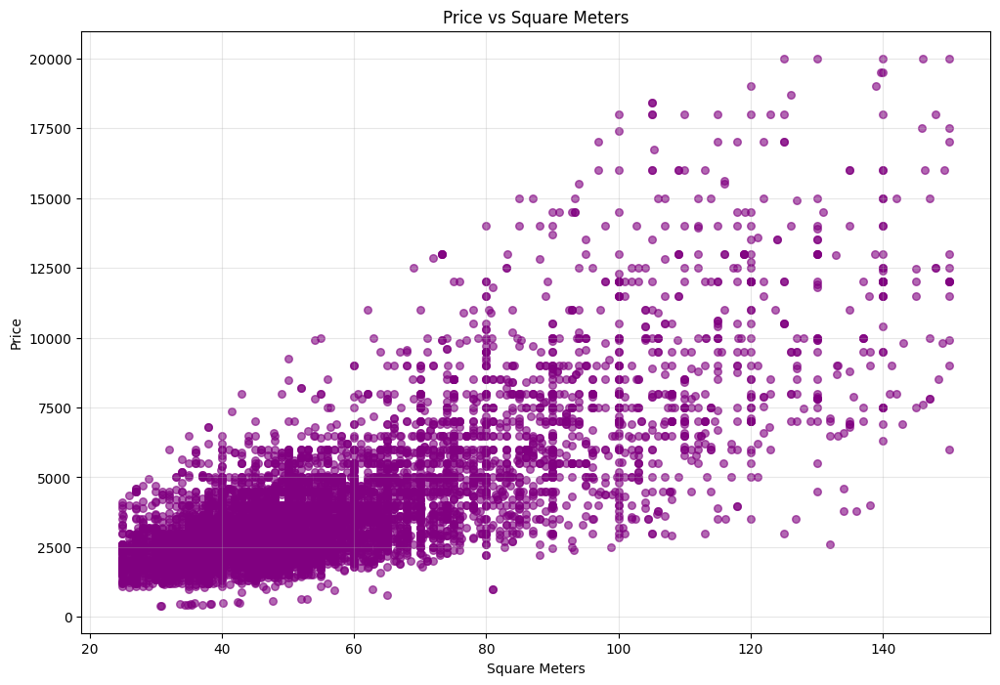

/tmp/ipython-input-4194324291.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='rooms', y='price', palette='coolwarm')


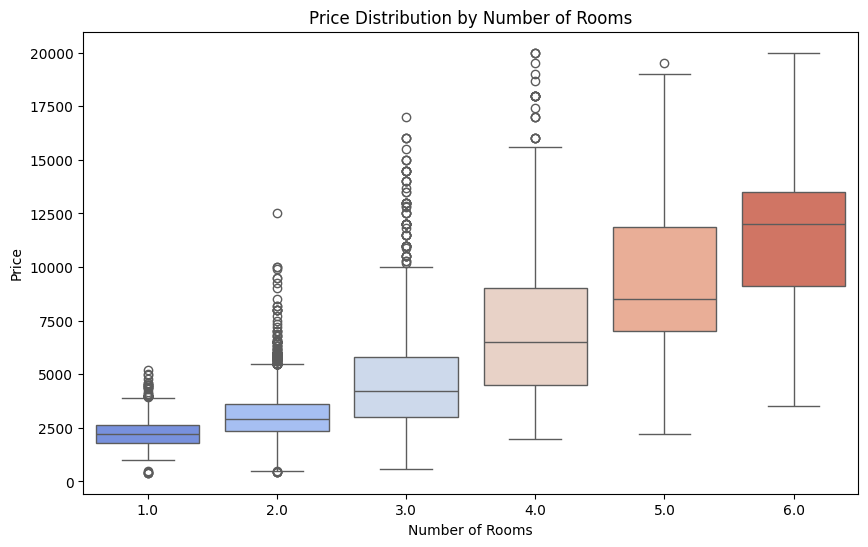

/tmp/ipython-input-4194324291.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='city', y='price', palette='Set2')


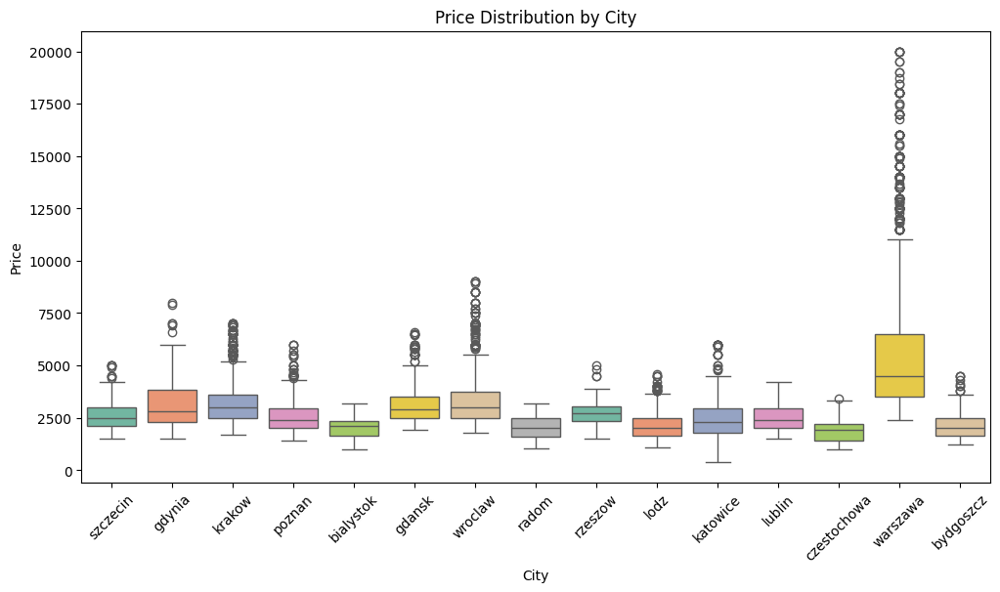

In [ ]:
# 3. Relationships between Price and Key Variables
print("\n" + "="*60)
print("PRICE RELATIONSHIPS ANALYSIS")
print("="*60)

# Scatter plot: Price vs Square Meters
plt.figure(figsize=(12, 8))
plt.scatter(df['squareMeters'], df['price'], alpha=0.6, color='purple', s=30)
plt.title('Price vs Square Meters')
plt.xlabel('Square Meters')
plt.ylabel('Price')
plt.grid(True, alpha=0.3)
plt.show()

# Boxplot: Price by Number of Rooms
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='rooms', y='price', palette='coolwarm')
plt.title('Price Distribution by Number of Rooms')
plt.xlabel('Number of Rooms')
plt.ylabel('Price')
plt.show()

# Price by City
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='city', y='price', palette='Set2')
plt.title('Price Distribution by City')
plt.xlabel('City')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()

In [ ]:
X = df.drop('price' , axis = 1) # need to change it for all the input features
Y = df['price']                 # need to change it for whatever value we agree to predict for now it stays like that
torch.manual_seed(1111)


class Dataset(Dataset):
    def __init__(self):
        self.features = X
        self.target = Y
    def __len__(self):
        return len(self.features)
    def __getitem__(self, index):
        return self.features[index] , self.target[index]


dataset = Dataset()

train_ratio = 0.7
test_ratio = 0.3

total_size = len(dataset)
train_size = int(total_size * train_ratio)
test_size = total_size - train_size

train_set, test_set = random_split(dataset, [train_size, test_size])

batch_size = 128
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

## Task 2.7: Dataset visualization
Examine your dataset, perform exploratory data analysis, and show how features are
distributed and their relationships to each other. Prepare a Python notebook that includes
the necessary figures.



NUMERICAL FEATURES DISTRIBUTION


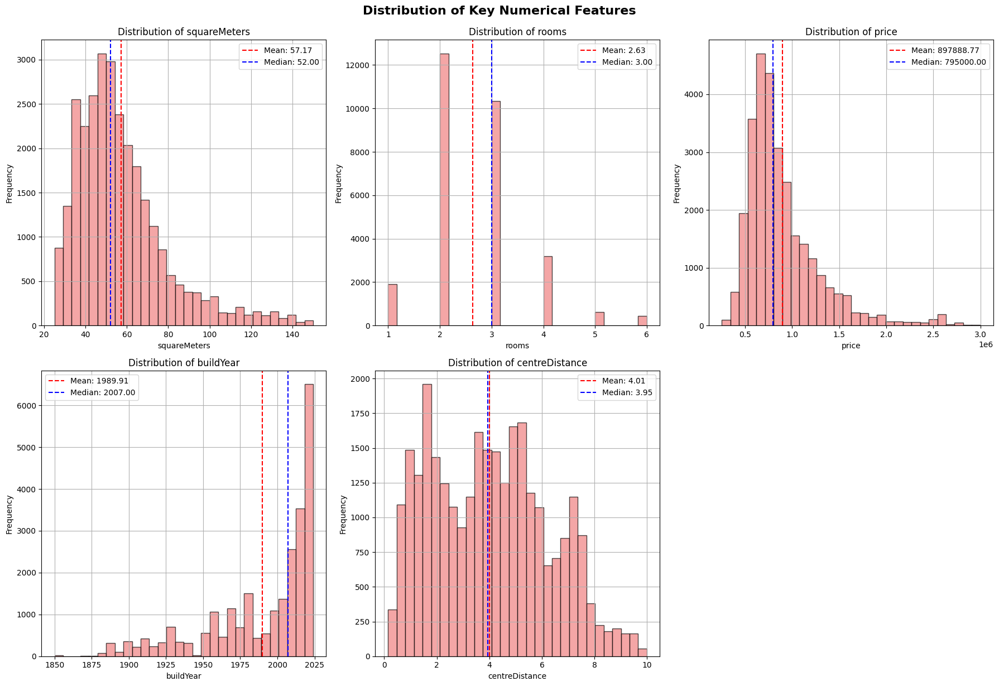

In [ ]:
# 1. Distribution of Numerical Features
print("\n" + "="*60)
print("NUMERICAL FEATURES DISTRIBUTION")
print("="*60)

numerical_cols = ['squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear',
                  'latitude', 'longitude', 'centreDistance', 'poiCount', 'price']

# Create histograms for key numerical features
key_numerical = ['squareMeters', 'rooms', 'price', 'buildYear', 'centreDistance']
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, col in enumerate(key_numerical):
    df[col].hist(bins=30, ax=axes[i], alpha=0.7, color='lightcoral', edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

    # Add statistics to the plot
    mean_val = df[col].mean()
    median_val = df[col].median()
    axes[i].axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(median_val, color='blue', linestyle='--', label=f'Median: {median_val:.2f}')
    axes[i].legend()

# Hide empty subplot
axes[5].set_visible(False)

plt.tight_layout()
plt.suptitle('Distribution of Key Numerical Features', fontsize=16, fontweight='bold', y=1.02)
plt.show()


CATEGORICAL FEATURES ANALYSIS


/tmp/ipython-input-856541175.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_counts.values, y=city_counts.index, ax=axes[0,0], palette='viridis')
/tmp/ipython-input-856541175.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=type_counts.values, y=type_counts.index, ax=axes[0,1], palette='Set2')
/tmp/ipython-input-856541175.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ownership_counts.values, y=ownership_counts.index, ax=axes[1,0], palette='Set3')
/tmp/ipython-input-856541175.py:37: FutureWarning: 

Passing `palette

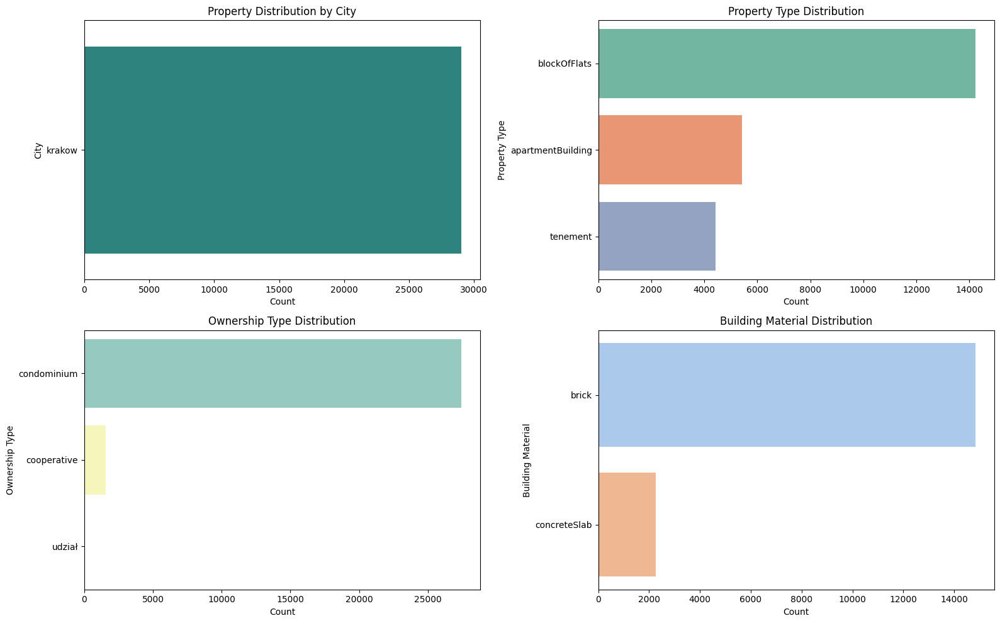

City distribution:
city
krakow    29026
Name: count, dtype: int64

Property type distribution:
type
blockOfFlats         14233
apartmentBuilding     5432
NaN                   4940
tenement              4421
Name: count, dtype: int64

Ownership distribution:
ownership
condominium    27436
cooperative     1582
udział             8
Name: count, dtype: int64

Amenities summary:
hasParkingSpace: hasParkingSpace
no     19539
yes     9487
Name: count, dtype: int64
hasBalcony: hasBalcony
yes    17946
no     11080
Name: count, dtype: int64
hasElevator: hasElevator
yes    14208
no     13697
Name: count, dtype: int64
hasSecurity: hasSecurity
no     27152
yes     1874
Name: count, dtype: int64
hasStorageRoom: hasStorageRoom
no     17774
yes    11252
Name: count, dtype: int64


In [ ]:
# 2. Categorical Features Analysis
print("\n" + "="*60)
print("CATEGORICAL FEATURES ANALYSIS")
print("="*60)

categorical_cols = ['city', 'type', 'ownership', 'buildingMaterial', 'condition',
                    'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity', 'hasStorageRoom']

# Create count plots for main categorical features
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# City distribution
city_counts = df['city'].value_counts()
sns.barplot(x=city_counts.values, y=city_counts.index, ax=axes[0,0], palette='viridis')
axes[0,0].set_title('Property Distribution by City')
axes[0,0].set_xlabel('Count')
axes[0,0].set_ylabel('City')

# Property type distribution (excluding NaN)
type_data = df['type'].dropna()
type_counts = type_data.value_counts()
sns.barplot(x=type_counts.values, y=type_counts.index, ax=axes[0,1], palette='Set2')
axes[0,1].set_title('Property Type Distribution')
axes[0,1].set_xlabel('Count')
axes[0,1].set_ylabel('Property Type')

# Ownership distribution
ownership_counts = df['ownership'].value_counts()
sns.barplot(x=ownership_counts.values, y=ownership_counts.index, ax=axes[1,0], palette='Set3')
axes[1,0].set_title('Ownership Type Distribution')
axes[1,0].set_xlabel('Count')
axes[1,0].set_ylabel('Ownership Type')

# Building material distribution (excluding NaN)
material_data = df['buildingMaterial'].dropna()
material_counts = material_data.value_counts()
sns.barplot(x=material_counts.values, y=material_counts.index, ax=axes[1,1], palette='pastel')
axes[1,1].set_title('Building Material Distribution')
axes[1,1].set_xlabel('Count')
axes[1,1].set_ylabel('Building Material')

plt.tight_layout()
plt.show()

# Print value counts
print("City distribution:")
print(df['city'].value_counts())

print("\nProperty type distribution:")
print(df['type'].value_counts(dropna=False))

print("\nOwnership distribution:")
print(df['ownership'].value_counts())

print("\nAmenities summary:")
amenities = ['hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity', 'hasStorageRoom']
for amenity in amenities:
    print(f"{amenity}: {df[amenity].value_counts()}")


CORRELATION ANALYSIS


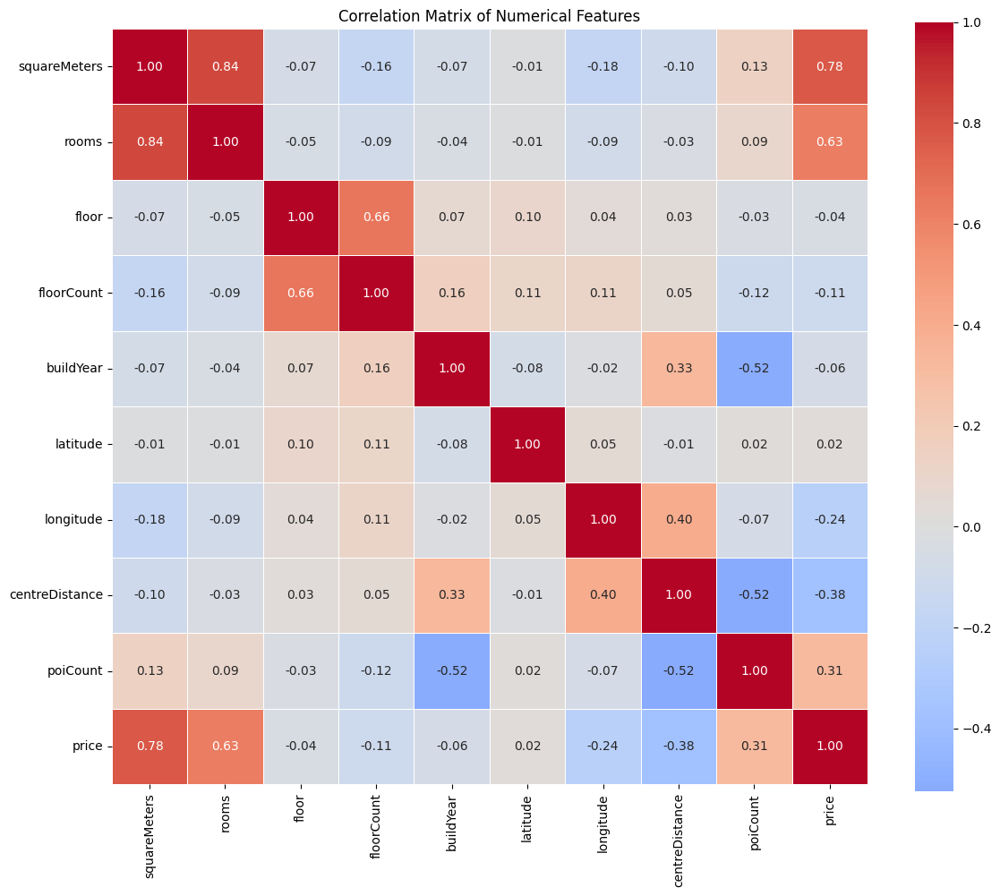

Top correlations with Price:
buildYear         1.000000
centreDistance    0.328533
floorCount        0.159137
floor             0.071270
longitude        -0.022902
rooms            -0.039091
price            -0.061424
squareMeters     -0.073232
latitude         -0.075951
poiCount         -0.515242
Name: buildYear, dtype: float64


In [ ]:
# 4. Correlation Analysis
print("\n" + "="*60)
print("CORRELATION ANALYSIS")
print("="*60)

# Calculate correlation matrix for numerical features
corr_matrix = df[numerical_cols].corr()

# Create heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.tight_layout()
plt.show()

print("Top correlations with Price:")
price_corr = corr_matrix['buildYear'].sort_values(ascending=False)
print(price_corr)


GEOGRAPHIC ANALYSIS


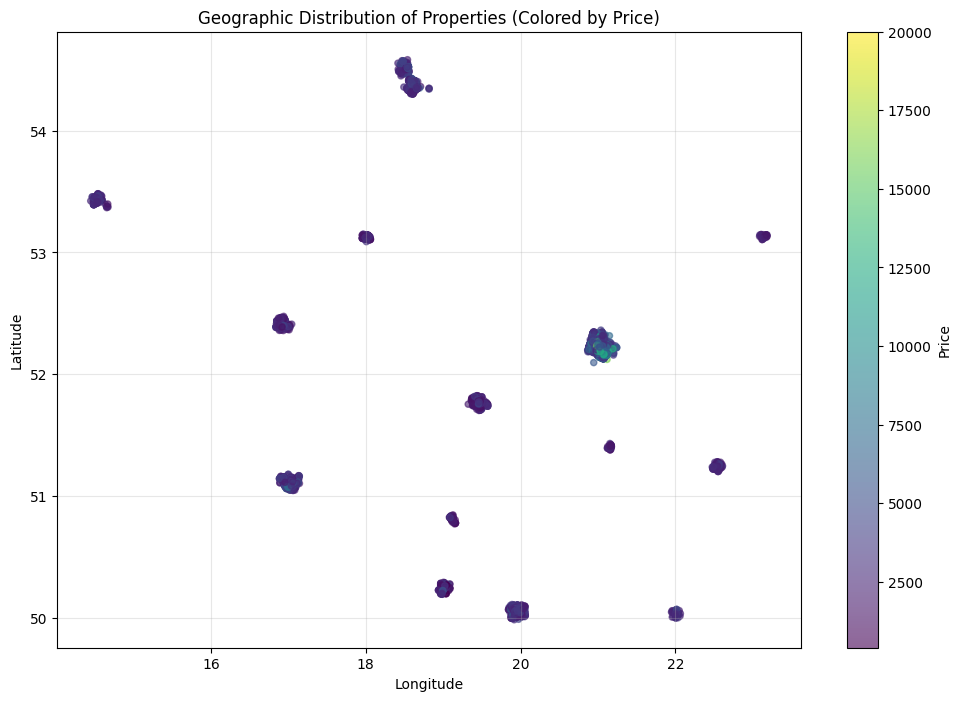

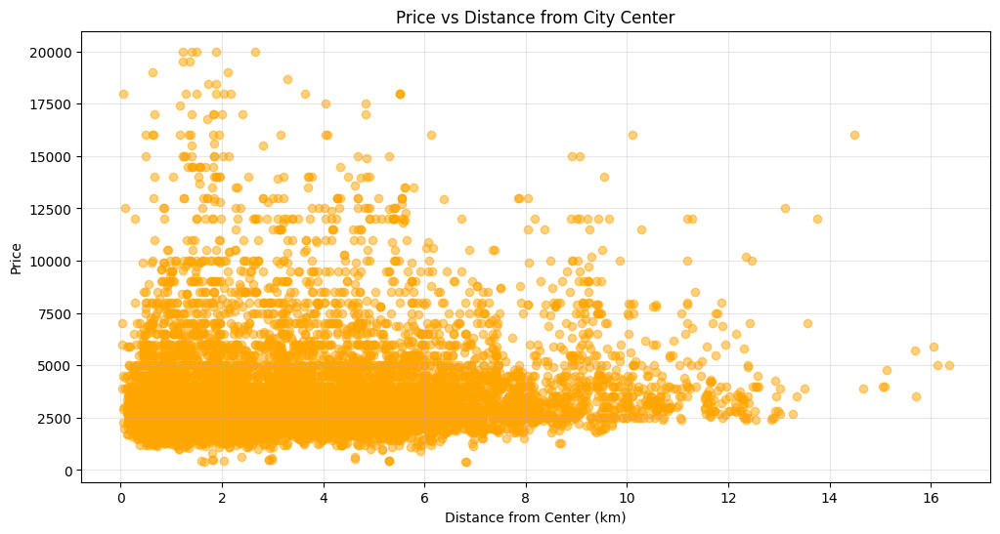

In [ ]:
# 5. Location and Geographic Analysis
print("\n" + "="*60)
print("GEOGRAPHIC ANALYSIS")
print("="*60)

# Scatter plot: Geographic distribution of properties
plt.figure(figsize=(12, 8))
scatter = plt.scatter(df['longitude'], df['latitude'],
                     c=df['price'], cmap='viridis',
                     alpha=0.6, s=20)
plt.colorbar(scatter, label='Price')
plt.title('Geographic Distribution of Properties (Colored by Price)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.show()

# Price vs Distance from Center
plt.figure(figsize=(12, 6))
plt.scatter(df['centreDistance'], df['price'], alpha=0.5, color='orange')
plt.title('Price vs Distance from City Center')
plt.xlabel('Distance from Center (km)')
plt.ylabel('Price')
plt.grid(True, alpha=0.3)
plt.show()


BUILDING CHARACTERISTICS ANALYSIS


/tmp/ipython-input-3487677526.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=build_decade_data, x='buildDecade', y='price', palette='Set3')


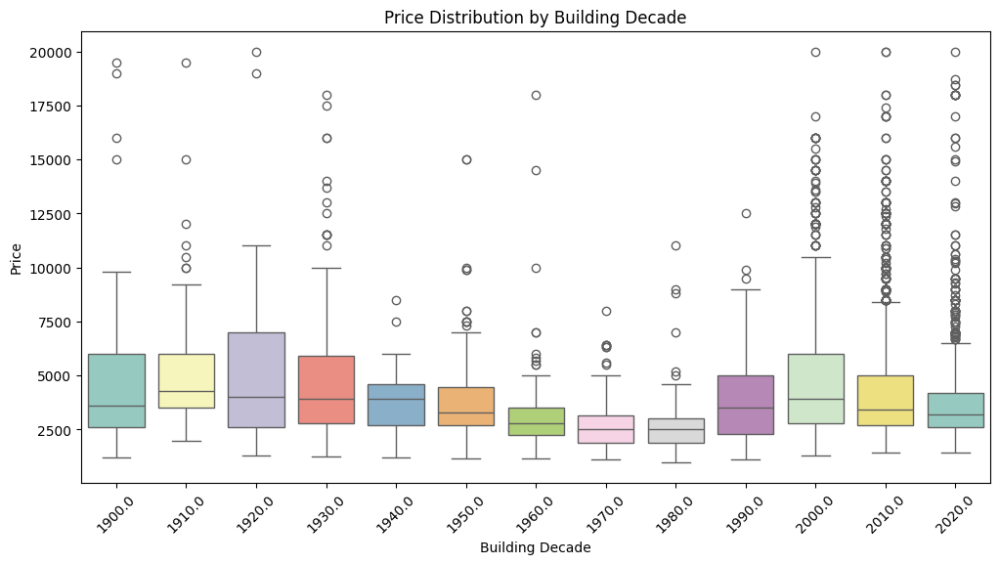

/tmp/ipython-input-3487677526.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=amenity, y='price', ax=axes[i], palette='pastel')
/tmp/ipython-input-3487677526.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=amenity, y='price', ax=axes[i], palette='pastel')
/tmp/ipython-input-3487677526.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x=amenity, y='price', ax=axes[i], palette='pastel')
/tmp/ipython-input-3487677526.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

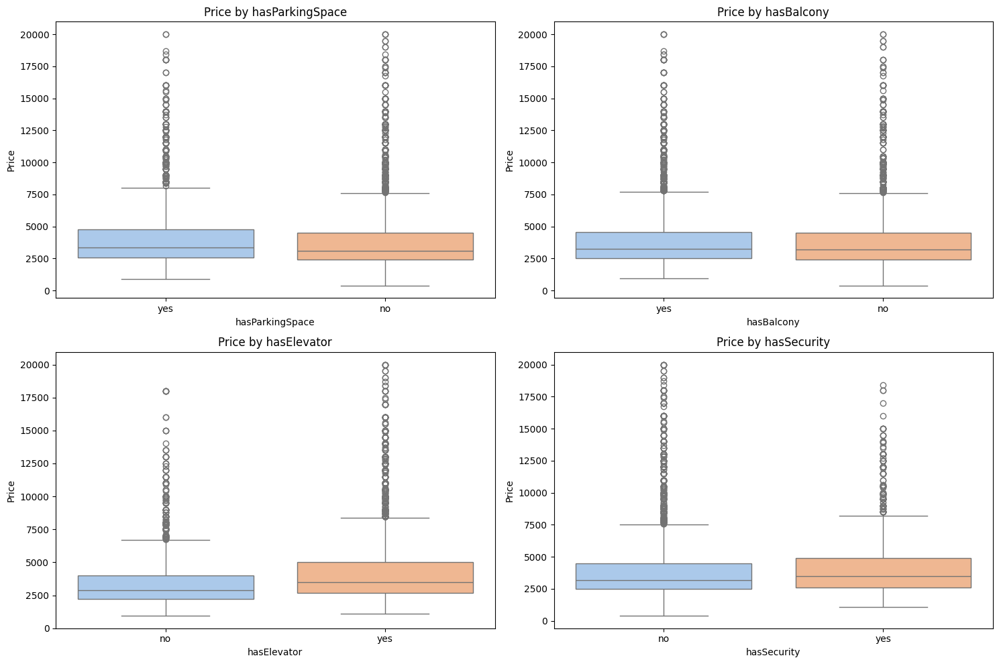

In [ ]:
# 6. Building Characteristics Analysis
print("\n" + "="*60)
print("BUILDING CHARACTERISTICS ANALYSIS")
print("="*60)

# Price by Building Year (grouped by decades)
df['buildDecade'] = (df['buildYear'] // 10) * 10
build_decade_data = df[df['buildDecade'] >= 1900]  # Filter reasonable years

plt.figure(figsize=(12, 6))
sns.boxplot(data=build_decade_data, x='buildDecade', y='price', palette='Set3')
plt.title('Price Distribution by Building Decade')
plt.xlabel('Building Decade')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()

# Amenities impact on price
amenity_plots = ['hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity']
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, amenity in enumerate(amenity_plots):
    sns.boxplot(data=df, x=amenity, y='price', ax=axes[i], palette='pastel')
    axes[i].set_title(f'Price by {amenity}')
    axes[i].set_xlabel(amenity)
    axes[i].set_ylabel('Price')

plt.tight_layout()
plt.show()

In [ ]:
import kagglehub
import os

# Download latest version
path = kagglehub.dataset_download("krzysztofjamroz/apartment-prices-in-poland")
print("Path to dataset files:", path)
#----------

# List files in the downloaded directory to find the CSV file
print("Files in the dataset directory:")
for root, dirs, files in os.walk(path):
    for file in files:
        print(os.path.join(root, file))

import pandas as pd
import numpy as np
df = pd.read_csv('/root/.cache/kagglehub/datasets/krzysztofjamroz/apartment-prices-in-poland/versions/9/apartments_rent_pl_2023_11.csv')

# Display basic information about the dataset
print("Dataset shape:", df.shape)
print("\nFirst 5 rows:");     print(df.head())
print("\nDataset info:");     print(df.info())
print("\nBasic statistics:"); print(df.describe())

# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())

Using Colab cache for faster access to the 'apartment-prices-in-poland' dataset.
Path to dataset files: /kaggle/input/apartment-prices-in-poland
Files in the dataset directory:
/kaggle/input/apartment-prices-in-poland/apartments_pl_2024_06.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_03.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_02.csv
/kaggle/input/apartment-prices-in-poland/apartments_pl_2024_02.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2023_12.csv
/kaggle/input/apartment-prices-in-poland/apartments_pl_2023_12.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_05.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_06.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_04.csv
/kaggle/input/apartment-prices-in-poland/apartments_pl_2024_04.csv
/kaggle/input/apartment-prices-in-poland/apartments_rent_pl_2024_01.csv
/kaggle/input/apartment-prices-in-poland/apartments

## Task 2.8: Project task formulation
Based on your observations, formulate research questions that will serve as potential goals
for your project. Try to prepare several potential tasks and then discuss them with your
teacher. Note that these tasks should not repeat those already completed in the related
work (Task 2 should be done prior to this one).
To complete this task, you will need at least one classification or regression problem. After
receiving approval from the teacher, these research questions will form the final goal of
your project.

### Solution to the task


### Goal 1: Buy vs. Rent Decision Modeling (Hybrid Classification/Regression)

This goal aims to create a decision-making model that uses predicted prices and other dataset features to classify the financial viability of buying an apartment versus renting a comparable one in the same city.

* **Research Question (R4):** **Can we develop a predictive model that, for a given set of apartment features in a specific Polish city, accurately classifies whether the property is a better financial opportunity to $\text{Buy}$ or to $\text{Rent}$ based on derived metrics like the Price-to-Rent Ratio (P/R) or a long-term total cost of ownership (TCO) simulation?**

* **Justification:** The existing dataset contains both sale prices (`price`) and an implied rent market (as mentioned in the original dataset description). This classification problem is directly actionable for consumers and investors.


***


### Goal 2: Classification of Value/Quality (New Problem Type)

The previous work was a regression problem (predicting the exact price). This goal is a **classification problem** that provides a different, potentially more actionable insight for investors.

* **Research Question (R2):** Can we build an accurate **classification model** to categorize apartments into distinct **Value/Quality Tiers** (e.g., 'Budget', 'Mid-Range', 'Premium', 'Luxury') based on property and $\text{POI}$ features?
    * *Note: These tiers would first need to be defined using price quantiles or K-means clustering.*

* **Project Tasks:**
    1.  **Target Variable Creation:** Use an appropriate clustering or quantile method on the $\text{price}$ variable to create four distinct, categorical 'Value/Quality' classes.
    2.  **Classification Model Selection:** Implement and compare classification models (e.g., Logistic Regression, Support Vector Machine, or a LightGBM classifier).
    3.  **Feature Impact on Tiers:** Analyze which features (e.g., `hasBalcony`, $\text{poiCount}$, $\text{city}$) are the strongest predictors for an apartment belonging to the **'Luxury'** class, a different perspective from the direct price influence seen previously.

***


## Task 2.9

It's important to formulate hypotheses that are **testable** and specific to the proposed model and data. For each goal, the hypotheses focus on the expected outcomes, the relative importance of specific features, or a comparison between methods.

**Goal 1: Buy vs. Rent Decision Modeling**

This goal involves creating a binary classification target (Buy/Rent) based on financial metrics like the Price-to-Rent (P/R) Ratio or Total Cost of Ownership (TCO).

Hypotheses for Goal 1

| Hypothesis ($\text{H}$) | Type | Rationale & Testing Method |
| :--- | :--- | :--- |
| **H1.1: Financial Metrics Dominate** | Feature Importance | The derived **Price-to-Rent (P/R) Ratio** will be the single most important feature in classifying the optimal Buy vs. Rent decision, significantly outweighing individual property features like $\text{squareMeters}$ or $\text{rooms}$. |
| **H1.2: City-Specific Viability** | Classification Performance | A **binary classification model** (e.g., LightGBM) will achieve higher predictive accuracy (e.g., F1-score $> 0.85$) on the $\text{Buy}$ vs. $\text{Rent}$ decision in **Warsaw** than in smaller, less dynamic markets like Bydgoszcz or Lublin. |
| **H1.3: Rent Market Impact** | Financial Impact | The introduction of the **rent data** will increase the importance of neighborhood amenities (e.g., $\text{poiCount}$, $\text{collegeDistance}$) in the final classification model compared to its low importance in the original price regression model. This is because renters prioritize immediate location features. |
| **H1.4: TCO vs. P/R** | Comparative Modeling | A classification model based on a **simulated 10-year Total Cost of Ownership (TCO)** will achieve a higher F1-score than a model based solely on the static P/R ratio, as TCO accounts for time value and borrowing costs. |

***

**Goal 2: Classification of Value/Quality Tiers**

This goal is a multi-class classification problem where apartments are sorted into 'Budget', 'Mid-Range', 'Premium', and 'Luxury' tiers using statistical methods like price quantiles.

**Hypotheses** for Goal 2 текст жирним шрифтом

| Hypothesis ($\text{H}$) | Type | Rationale & Testing Method |
| :--- | :--- | :--- |
| **H2.1: Luxury Segment Predictors** | Feature Importance | The strongest predictor for an apartment belonging to the **'Luxury'** class will be the presence of premium features ($\text{hasElevator}$, $\text{hasSecurity}$, $\text{hasStorageRoom}$) and location in **Warsaw**, rather than simple size ($\text{squareMeters}$) or $\text{rooms}$. |
| **H2.2: Tier Definition Consistency** | Method Comparison | Defining the four Value/Quality tiers using $\text{K-Means Clustering}$ (unsupervised learning) will result in a classification model with **higher predictive accuracy** than defining them using fixed **price quantiles** (statistical segmentation). |
| **H2.3: Budget vs. POI** | Feature Importance | In the **'Budget'** and **'Mid-Range'** classes, neighborhood amenities (e.g., $\text{poiCount}$, $\text{schoolDistance}$) will be more important for classification than property-specific features (e.g., $\text{floor}$, $\text{floorCount}$), as affordability drives compromises on property condition but not on essential access. |
| **H2.4: City Indicator Importance** | Classification Performance | [cite_start]By transforming the price regression into a **multi-class classification**, the importance of the **city indicator** (e.g., $\text{city\_Warszawa}$) in the XGBoost classification model will be lower than its importance in the original XGBoost regression model ($\approx 23\%$ importance) [cite: 262] because the tier structure normalizes for high-level city price differences. |

## Task 2.10: Exploratory data analysis report
Using the materials prepared in Task 2.7, prepare a document that will form chapter 3 of
your project report. This document should be prepared in a text editor or in LaTeX (a
Python notebook is not an acceptable form of a report). Provide an explanation of the steps
taken and an interpretation of the obtained results

## Task 2.11: Business presentation
Prepare a 3-minute talk that will show your project’s goal and explain motivation for it.
Pretend that after initial data analysis you look for funding of an external investor to
complete the project. You can (but you don’t have to) use slides. This presentation will be
given during next project classes

# Lab3

## Imports


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from google.colab import drive
from sklearn.decomposition import PCA
import itertools
from sklearn.preprocessing import OrdinalEncoder

## Task 3.1
Load the dataset. Split it for train, validation, and test sets with a ratio of
0.6:0.2:0.2. Set the random_state parameter to 1. Plot the correlation matrix. Enable
annotations, and choose a suitable colormap. In pairs, discuss which features would be
useful for predicting the levels of density and pH. Justify your choices.
Hint: You do not need to split the target from the data:
data_train, data_test = train_test_split(data, …).

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Set style for better plots
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Read the CSV file
file_path = '/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv'
data = pd.read_csv(file_path, sep=';')  # Use 'data' as variable name

print(f"Dataset shape: {data.shape}")
print(f"Columns: {data.columns.tolist()}")
print("\nFirst 5 rows:")
print(data.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset shape: (1599, 12)
Columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']

First 5 rows:
   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.

In [ ]:
# 1. Split the entire dataset first (as per hint)
# First split: Separate test set (20%)
data_temp, data_test = train_test_split(
    data,
    test_size=0.2,
    random_state=1
)
# Second split: Separate train and validation from remaining data (60% train, 20% validation)
data_train, data_val = train_test_split(
    data_temp,
    test_size=0.25,   # 0.25 * 0.8 = 0.2 (20% of original)
    random_state=1
)

print(f"Training set: {data_train.shape[0]} samples ({data_train.shape[0]/len(data)*100:.1f}%)")
print(f"Validation set: {data_val.shape[0]} samples ({data_val.shape[0]/len(data)*100:.1f}%)")
print(f"Test set: {data_test.shape[0]} samples ({data_test.shape[0]/len(data)*100:.1f}%)")

Training set: 959 samples (60.0%)
Validation set: 320 samples (20.0%)
Test set: 320 samples (20.0%)


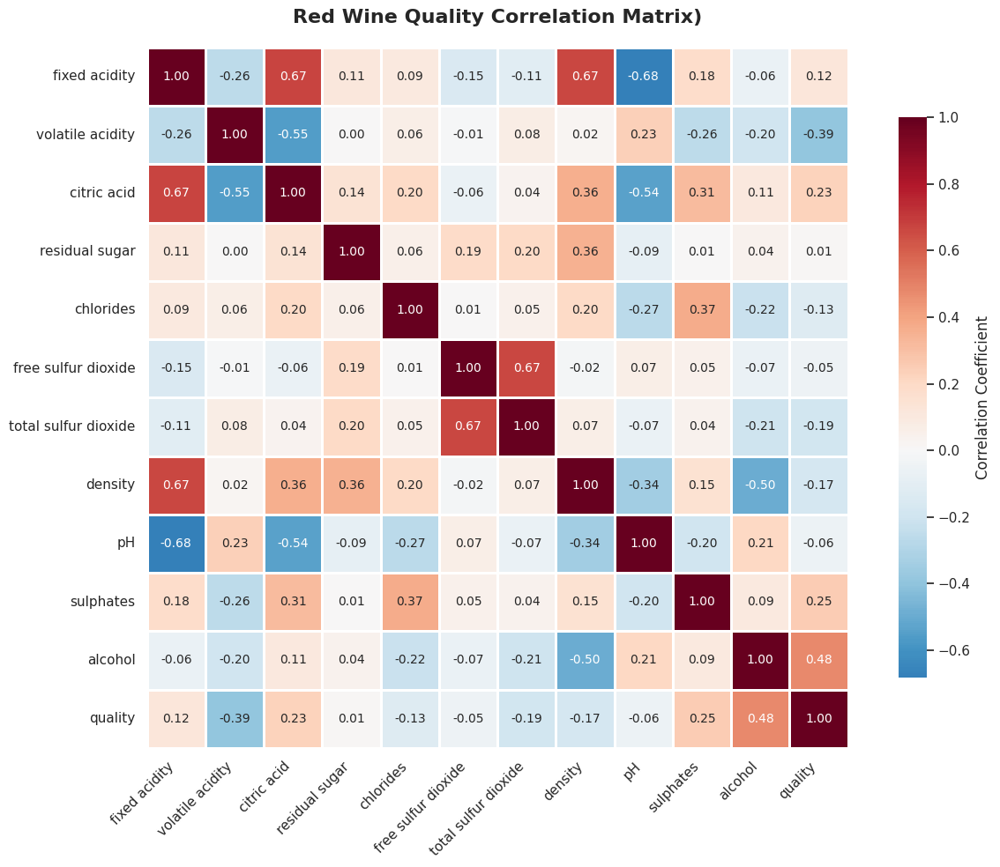

In [ ]:
# 2. Plot the correlation matrix with annotations and suitable colormap

corr_matrix = data.corr() # Calculate correlation matrix
# Create the correlation heatmap with annotations and good colormap
plt.figure(figsize=(13, 10))
sns.heatmap(corr_matrix,
            annot=True,           # Show correlation values
            cmap='RdBu_r',        # Red-Blue reversed colormap (excellent for correlations)
            center=0,             # Center colormap at 0
            fmt='.2f',           # Format annotations to 2 decimal places
            square=True,          # Square cells
            linewidths=0.8,       # Add lines between cells
            linecolor='white',    # White lines between cells
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'},
            annot_kws={'size': 10})  # Annotation font size

plt.title('Red Wine Quality Correlation Matrix)',
          fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.show()

In [ ]:
# 3. Focused analysis for density and pH predictions

# Get correlations with density and pH
density_corr = corr_matrix['density'].sort_values(ascending=False)
pH_corr = corr_matrix['pH'].sort_values(ascending=False)

print("TOP FEATURES FOR DENSITY PREDICTION:")
print("=" * 50)
for feature, corr in density_corr.items():
    if feature != 'density':  # Exclude self-correlation
        print(f"{feature:20} : {corr:+.3f}")

print("\nTOP FEATURES FOR pH PREDICTION:")
print("=" * 50)
for feature, corr in pH_corr.items():
    if feature != 'pH':  # Exclude self-correlation
        print(f"{feature:20} : {corr:+.3f}")

TOP FEATURES FOR DENSITY PREDICTION:
fixed acidity        : +0.668
citric acid          : +0.365
residual sugar       : +0.355
chlorides            : +0.201
sulphates            : +0.149
total sulfur dioxide : +0.071
volatile acidity     : +0.022
free sulfur dioxide  : -0.022
quality              : -0.175
pH                   : -0.342
alcohol              : -0.496

TOP FEATURES FOR pH PREDICTION:
volatile acidity     : +0.235
alcohol              : +0.206
free sulfur dioxide  : +0.070
quality              : -0.058
total sulfur dioxide : -0.066
residual sugar       : -0.086
sulphates            : -0.197
chlorides            : -0.265
density              : -0.342
citric acid          : -0.542
fixed acidity        : -0.683


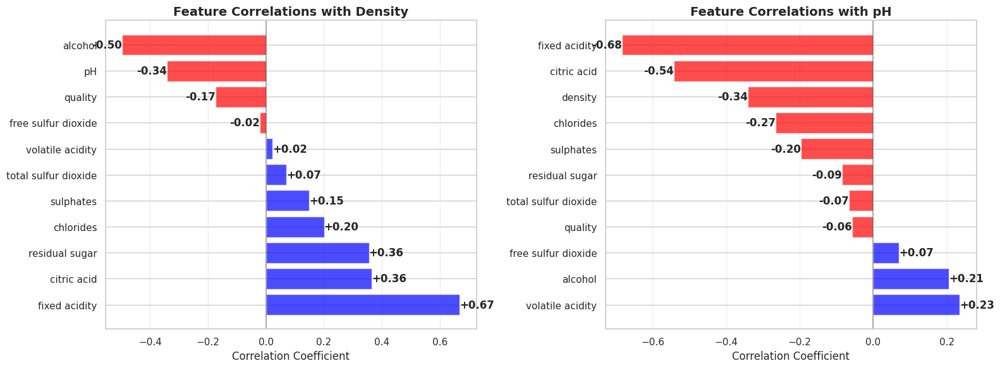

In [ ]:
# 4. Visualize correlations with density and pH
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot for density correlations
density_corr_filtered = density_corr[density_corr.index != 'density']
colors_density = ['red' if x < 0 else 'blue' for x in density_corr_filtered.values]

ax1.barh(range(len(density_corr_filtered)), density_corr_filtered.values,
         color=colors_density, alpha=0.7)
ax1.set_yticks(range(len(density_corr_filtered)))
ax1.set_yticklabels(density_corr_filtered.index)
ax1.set_xlabel('Correlation Coefficient')
ax1.set_title('Feature Correlations with Density', fontsize=14, fontweight='bold')
ax1.axvline(x=0, color='black', linestyle='-', alpha=0.3)
ax1.grid(axis='x', alpha=0.3)

# Add correlation values on bars for density
for i, v in enumerate(density_corr_filtered.values):
    ax1.text(v, i, f'{v:+.2f}', ha='left' if v >= 0 else 'right',
             va='center', fontweight='bold')

# Plot for pH correlations
pH_corr_filtered = pH_corr[pH_corr.index != 'pH']
colors_ph = ['red' if x < 0 else 'blue' for x in pH_corr_filtered.values]

ax2.barh(range(len(pH_corr_filtered)), pH_corr_filtered.values,
         color=colors_ph, alpha=0.7)
ax2.set_yticks(range(len(pH_corr_filtered)))
ax2.set_yticklabels(pH_corr_filtered.index)
ax2.set_xlabel('Correlation Coefficient')
ax2.set_title('Feature Correlations with pH', fontsize=14, fontweight='bold')
ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)
ax2.grid(axis='x', alpha=0.3)

# Add correlation values on bars for pH
for i, v in enumerate(pH_corr_filtered.values):
    ax2.text(v, i, f'{v:+.2f}', ha='left' if v >= 0 else 'right',
             va='center', fontweight='bold')

plt.tight_layout()
plt.show()

Best featues cna be see in the plot above:

For Density:  fixed acidity, alcohol
For pH:       fixed acidity, citric acid



## Task 3.2
Repeat task 3.1 for the white wine dataset. Consider differences

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Set style for better plots
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Read the CSV file
file_path = '/content/drive/My Drive/Pythonlabs/wine+quality/winequality-white.csv'
data = pd.read_csv(file_path, sep=';')  # Use 'data' as variable name

print(f"Dataset shape: {data.shape}")
print(f"Columns: {data.columns.tolist()}")
print("\nFirst 5 rows:")
print(data.head())

Mounted at /content/drive
Dataset shape: (4898, 12)
Columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']

First 5 rows:
   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9

In [ ]:
# 1. Split the entire dataset first (as per hint)
# First split: Separate test set (20%)
data_temp, data_test = train_test_split(
    data,
    test_size=0.2,
    random_state=1
)
# Second split: Separate train and validation from remaining data (60% train, 20% validation)
data_train, data_val = train_test_split(
    data_temp,
    test_size=0.25,   # 0.25 * 0.8 = 0.2 (20% of original)
    random_state=1
)

print(f"Training set: {data_train.shape[0]} samples ({data_train.shape[0]/len(data)*100:.1f}%)")
print(f"Validation set: {data_val.shape[0]} samples ({data_val.shape[0]/len(data)*100:.1f}%)")
print(f"Test set: {data_test.shape[0]} samples ({data_test.shape[0]/len(data)*100:.1f}%)")

Training set: 2938 samples (60.0%)
Validation set: 980 samples (20.0%)
Test set: 980 samples (20.0%)


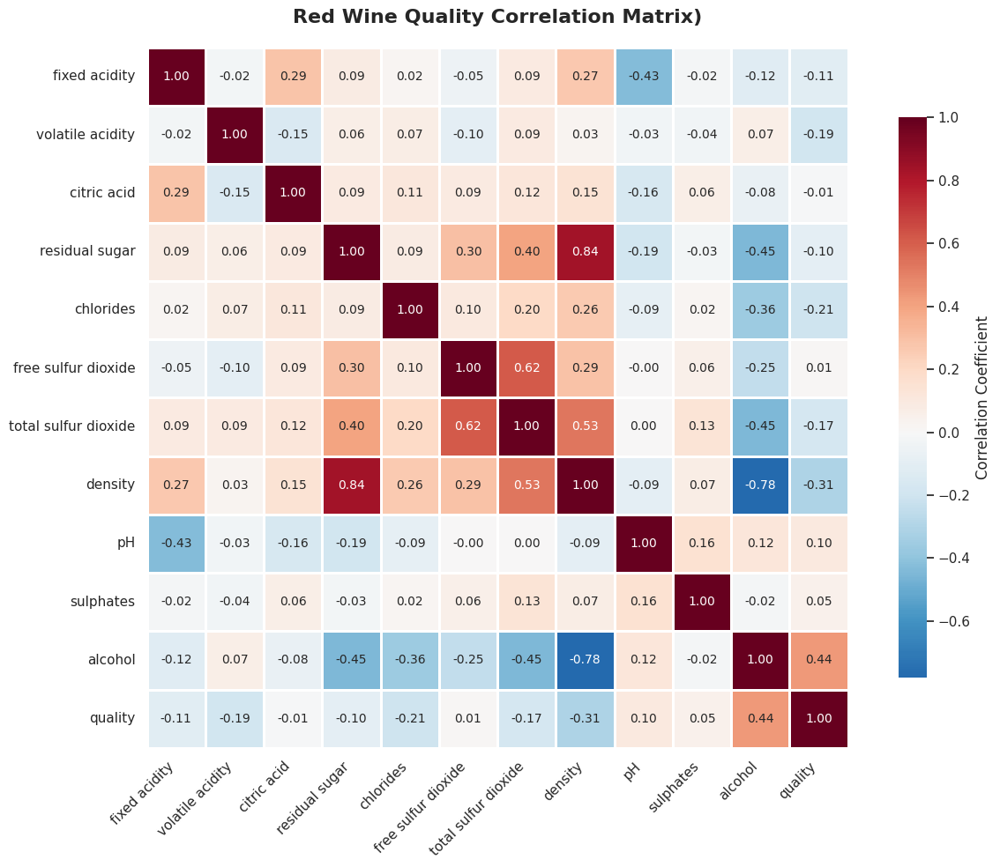

In [ ]:
# 2. Plot the correlation matrix with annotations and suitable colormap

corr_matrix = data.corr() # Calculate correlation matrix
# Create the correlation heatmap with annotations and good colormap
plt.figure(figsize=(13, 10))
sns.heatmap(corr_matrix,
            annot=True,           # Show correlation values
            cmap='RdBu_r',        # Red-Blue reversed colormap (excellent for correlations)
            center=0,             # Center colormap at 0
            fmt='.2f',           # Format annotations to 2 decimal places
            square=True,          # Square cells
            linewidths=0.8,       # Add lines between cells
            linecolor='white',    # White lines between cells
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'},
            annot_kws={'size': 10})  # Annotation font size

plt.title('Red Wine Quality Correlation Matrix)',
          fontsize=16, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.show()

In [ ]:
# 3. Focused analysis for density and pH predictions

# Get correlations with density and pH
density_corr = corr_matrix['density'].sort_values(ascending=False)
pH_corr = corr_matrix['pH'].sort_values(ascending=False)

print("TOP FEATURES FOR DENSITY PREDICTION:")
print("=" * 50)
for feature, corr in density_corr.items():
    if feature != 'density':  # Exclude self-correlation
        print(f"{feature:20} : {corr:+.3f}")

print("\nTOP FEATURES FOR pH PREDICTION:")
print("=" * 50)
for feature, corr in pH_corr.items():
    if feature != 'pH':  # Exclude self-correlation
        print(f"{feature:20} : {corr:+.3f}")

TOP FEATURES FOR DENSITY PREDICTION:
residual sugar       : +0.839
total sulfur dioxide : +0.530
free sulfur dioxide  : +0.294
fixed acidity        : +0.265
chlorides            : +0.257
citric acid          : +0.150
sulphates            : +0.074
volatile acidity     : +0.027
pH                   : -0.094
quality              : -0.307
alcohol              : -0.780

TOP FEATURES FOR pH PREDICTION:
sulphates            : +0.156
alcohol              : +0.121
quality              : +0.099
total sulfur dioxide : +0.002
free sulfur dioxide  : -0.001
volatile acidity     : -0.032
chlorides            : -0.090
density              : -0.094
citric acid          : -0.164
residual sugar       : -0.194
fixed acidity        : -0.426


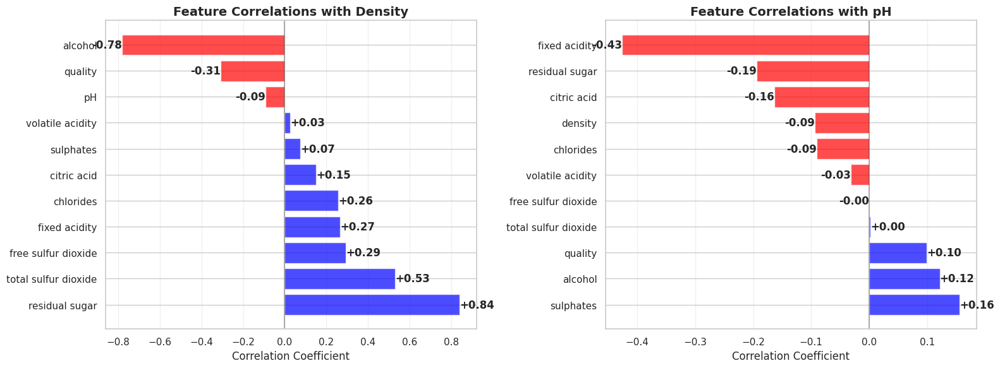

In [ ]:
# 4. Visualize correlations with density and pH
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot for density correlations
density_corr_filtered = density_corr[density_corr.index != 'density']
colors_density = ['red' if x < 0 else 'blue' for x in density_corr_filtered.values]

ax1.barh(range(len(density_corr_filtered)), density_corr_filtered.values,
         color=colors_density, alpha=0.7)
ax1.set_yticks(range(len(density_corr_filtered)))
ax1.set_yticklabels(density_corr_filtered.index)
ax1.set_xlabel('Correlation Coefficient')
ax1.set_title('Feature Correlations with Density', fontsize=14, fontweight='bold')
ax1.axvline(x=0, color='black', linestyle='-', alpha=0.3)
ax1.grid(axis='x', alpha=0.3)

# Add correlation values on bars for density
for i, v in enumerate(density_corr_filtered.values):
    ax1.text(v, i, f'{v:+.2f}', ha='left' if v >= 0 else 'right',
             va='center', fontweight='bold')

# Plot for pH correlations
pH_corr_filtered = pH_corr[pH_corr.index != 'pH']
colors_ph = ['red' if x < 0 else 'blue' for x in pH_corr_filtered.values]

ax2.barh(range(len(pH_corr_filtered)), pH_corr_filtered.values,
         color=colors_ph, alpha=0.7)
ax2.set_yticks(range(len(pH_corr_filtered)))
ax2.set_yticklabels(pH_corr_filtered.index)
ax2.set_xlabel('Correlation Coefficient')
ax2.set_title('Feature Correlations with pH', fontsize=14, fontweight='bold')
ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)
ax2.grid(axis='x', alpha=0.3)

# Add correlation values on bars for pH
for i, v in enumerate(pH_corr_filtered.values):
    ax2.text(v, i, f'{v:+.2f}', ha='left' if v >= 0 else 'right',
             va='center', fontweight='bold')

plt.tight_layout()
plt.show()

Best featues cna be see in the plot above:

For Density:  residural sugar, alcohol
For pH:       fixed acidity, residural sugar, sulphates, citric acid



## Task 3.3
Exclude 1% of observations with the lowest and highest pH. Compare the
distribution of this feature before and after this operation.

In [ ]:
q_low = data_train['pH'].quantile(0.1) # get 1st percentile
q_hi = data_train['pH'].quantile(0.99) # get 99th percentile
data_filtered = data_train[(data_train['pH'] < q_hi) & (data_train['pH'] > q_low)] #filter data by percentiles

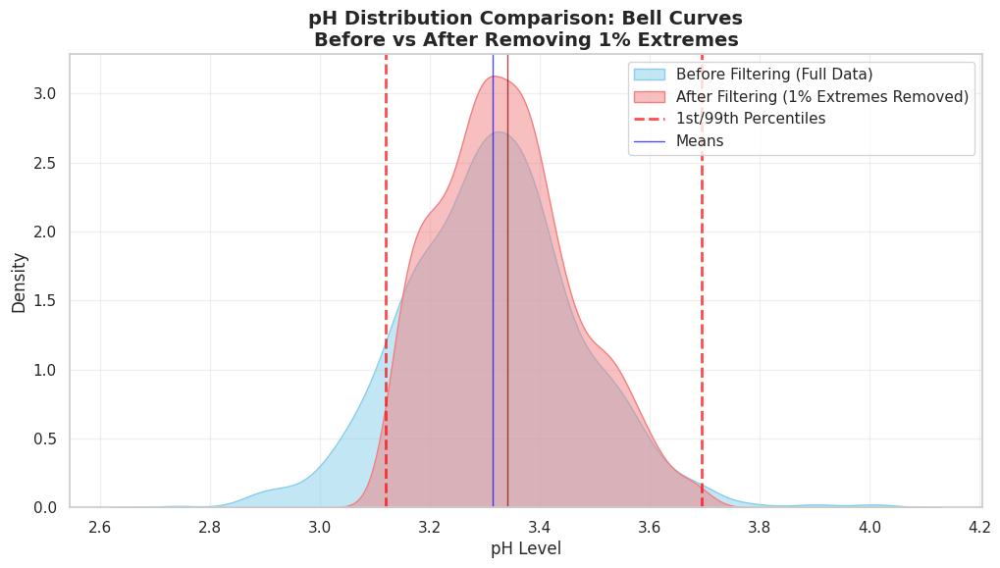

In [ ]:
# Bell curves (KDE plots)
plt.figure(figsize=(12, 6))

# Create KDE plots for both distributions
sns.kdeplot(data_train['pH'], label='Before Filtering (Full Data)', fill=True, alpha=0.5, color='skyblue')
sns.kdeplot(data_filtered['pH'], label='After Filtering (1% Extremes Removed)', fill=True, alpha=0.5, color='lightcoral')

# Add percentile lines
plt.axvline(q_low, color='red', linestyle='--', linewidth=2, alpha=0.7, label='1st/99th Percentiles')
plt.axvline(q_hi, color='red', linestyle='--', linewidth=2, alpha=0.7)

# Add mean lines
plt.axvline(data_train['pH'].mean(), color='blue', linestyle='-', linewidth=1, alpha=0.7, label='Means')
plt.axvline(data_filtered['pH'].mean(), color='darkred', linestyle='-', linewidth=1, alpha=0.7)

plt.title('pH Distribution Comparison: Bell Curves\nBefore vs After Removing 1% Extremes', fontsize=14, fontweight='bold')
plt.xlabel('pH Level')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## Task 3.4
Implement the exclusion of specific parts of data based on other selected
features. Consider which features might be reasonable and explore other statistical
measures.



```
Coming back to Task 3.3 Exclude 1% of observations with the lowest and highest pH. Compare the distribution of this feature before and after this operation.
```



In [ ]:
feature = 'quality'
threshold = 0.05

corr_target = data_train.corr()[feature].abs()
print("Correlations with target:\n", corr_target)

features_to_keep = corr_target[corr_target >= threshold].index.tolist()
print("Features to keep:", features_to_keep)

data_filtered = data_train[features_to_keep]
print("Filtered DataFrame shape:", data_filtered.shape)

Correlations with target:
 fixed acidity           0.104191
volatile acidity        0.399019
citric acid             0.225112
residual sugar          0.005920
chlorides               0.144088
free sulfur dioxide     0.068949
total sulfur dioxide    0.196930
density                 0.190484
pH                      0.028718
sulphates               0.243302
alcohol                 0.482216
quality                 1.000000
Name: quality, dtype: float64
Features to keep: ['fixed acidity', 'volatile acidity', 'citric acid', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'sulphates', 'alcohol', 'quality']
Filtered DataFrame shape: (959, 10)


## Task 3.5
Check the feature value ranges and their distributions. Determine which features’
distributions are similar and which differ. Consider the possible sources of similarities and
differences in feature distributions.

Hint: check what happens when you type:
data.hist() or data.boxplot().

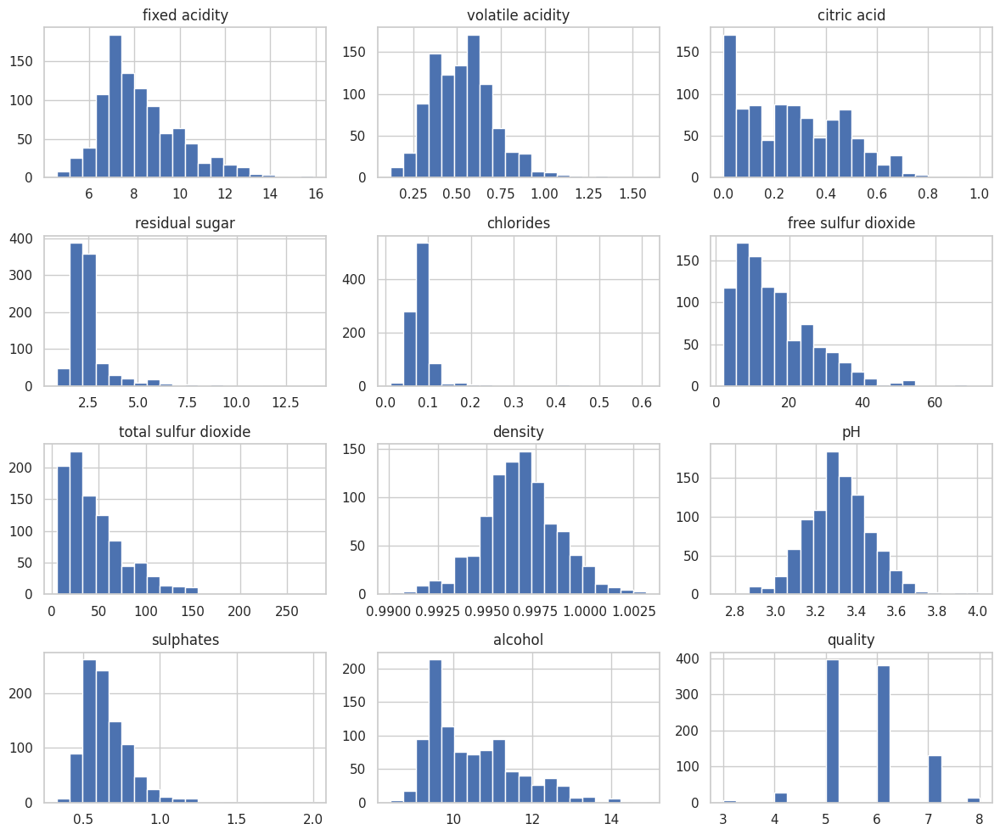

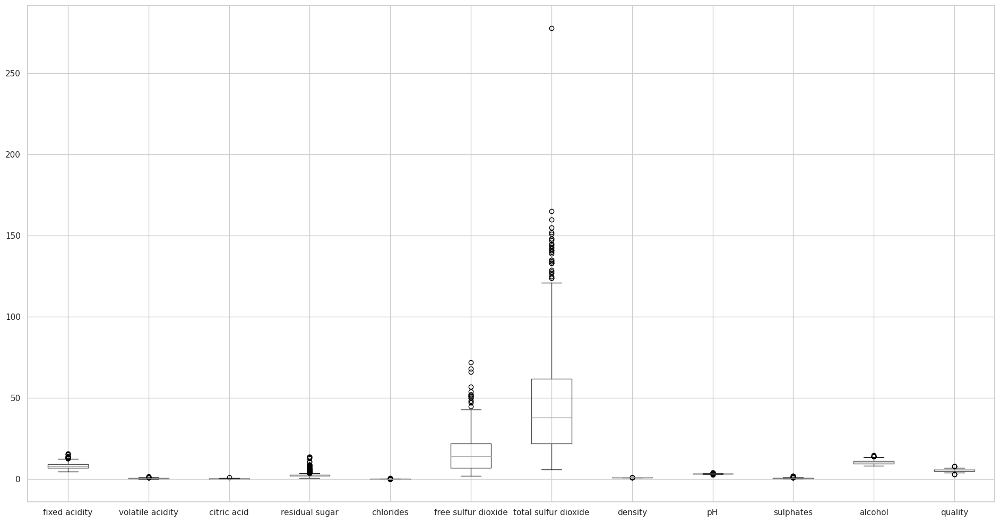

In [ ]:
# Hist
data_train.hist(figsize=(12, 10), bins=20)
plt.tight_layout()
plt.show()

# Boxplot
data_train.boxplot(figsize=(19, 10))
plt.tight_layout()
plt.show()

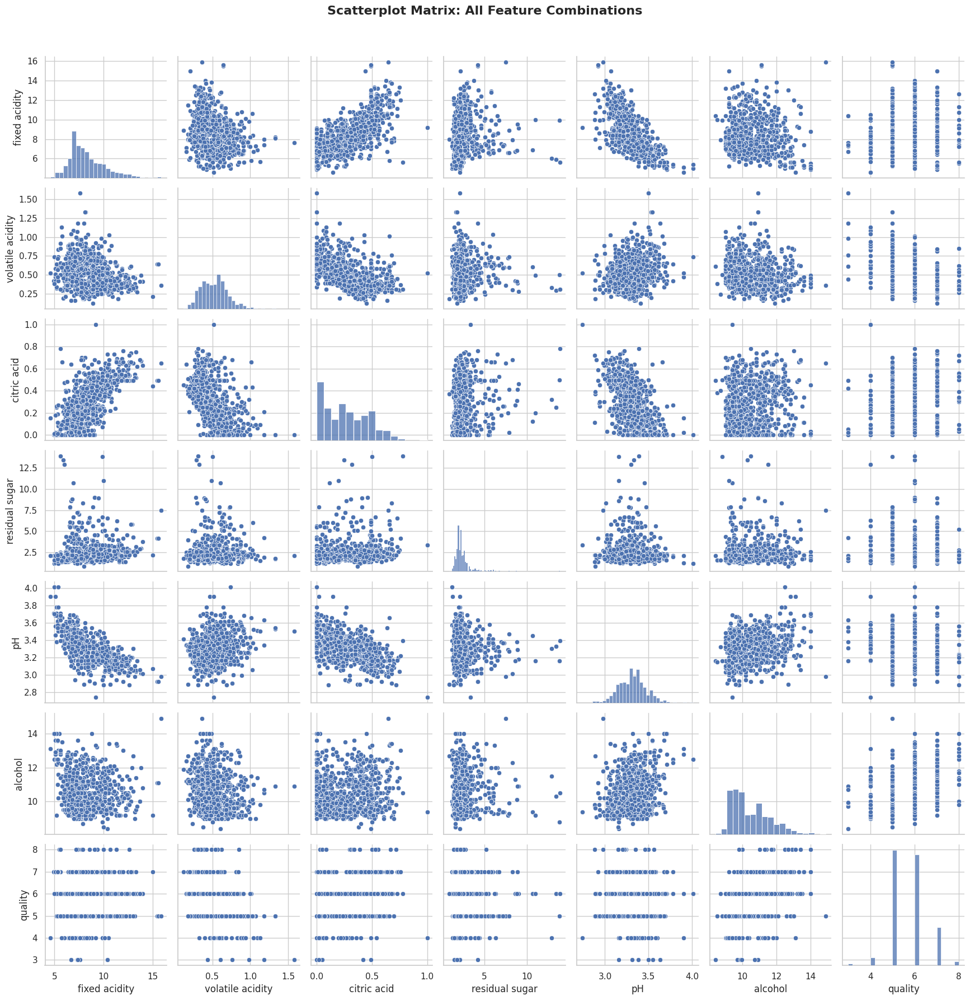

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

selected_features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'pH', 'alcohol', 'quality']
sns.pairplot(data_train[selected_features], diag_kind='hist', corner=False)
plt.suptitle('Scatterplot Matrix: All Feature Combinations', y=1.02, fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## Task 3.6
Perform standardization and Min-Max scaling on the training data. Compare
feature distributions as in the previous task. Consider in which cases standardization
should be used and when Min-Max scaling is more appropriate.


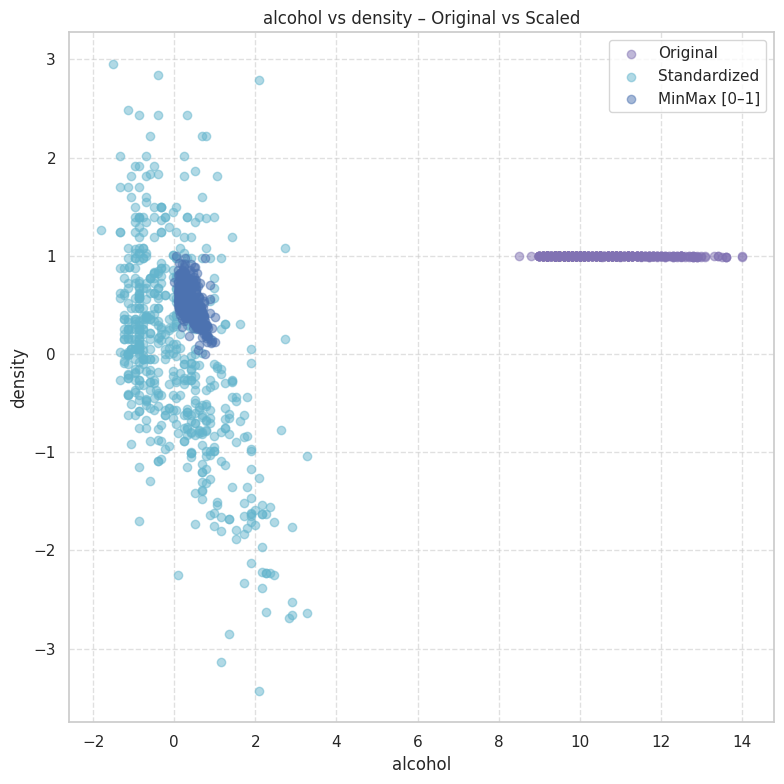

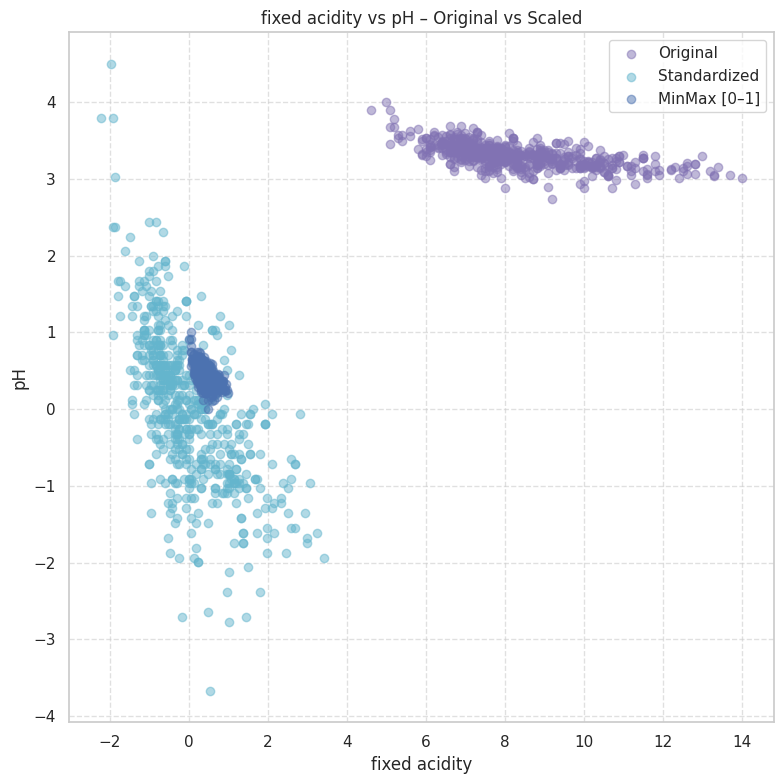

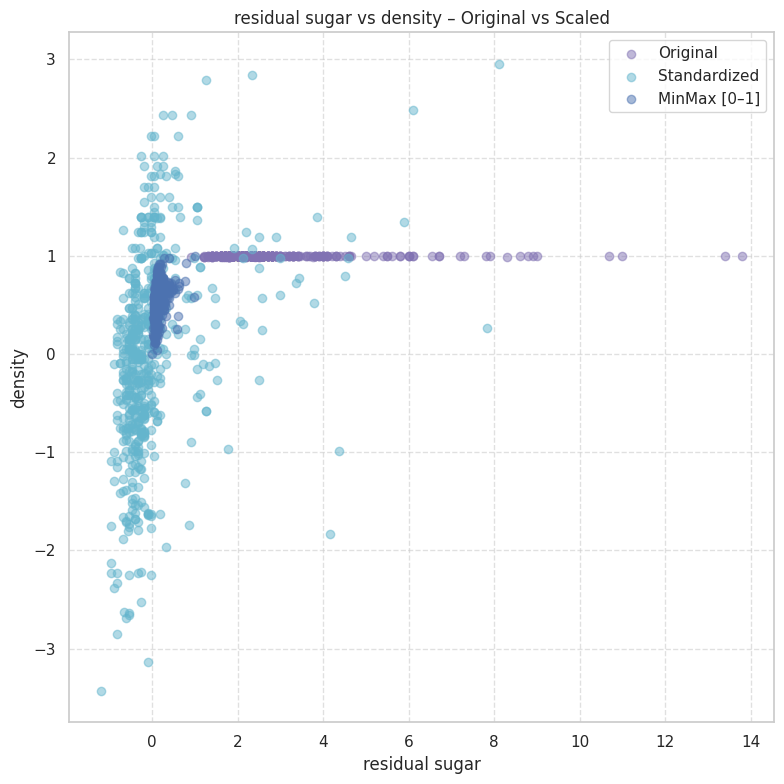

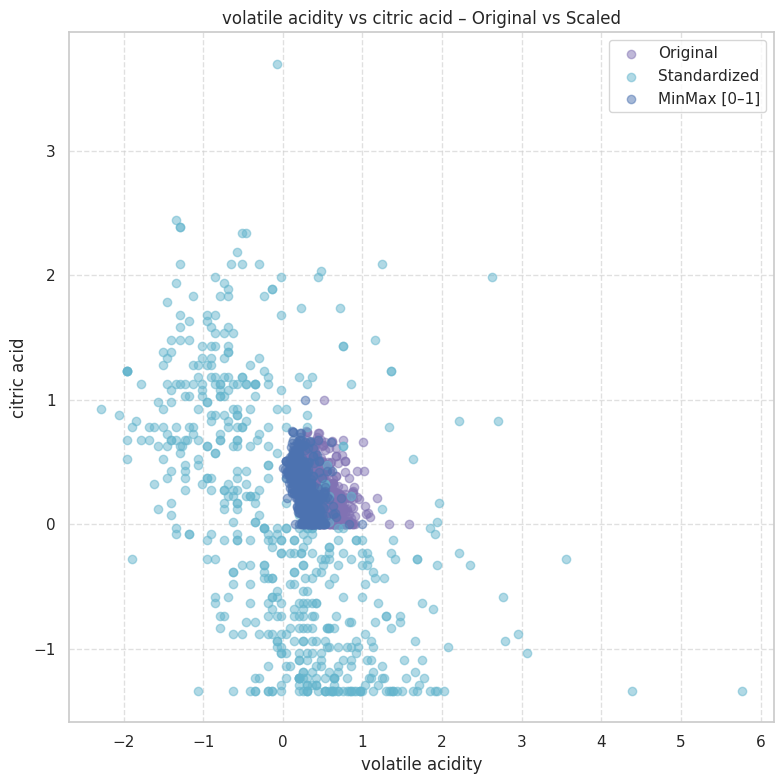

In [ ]:
X = data_train.drop('quality', axis = 1)
y = data_train['quality']
X_train,X_temp,y_train,y_temp=train_test_split(X,y,test_size=0.4,random_state=1)
X_val,X_test,y_val,y_test=train_test_split(X_temp,y_temp,test_size=0.5,random_state=1)

standard_scaler=StandardScaler().set_output(transform='pandas')
data_standardized=standard_scaler.fit_transform(X_train)

minmax_scaler=MinMaxScaler().set_output(transform='pandas')
data_normalized=minmax_scaler.fit_transform(X_train)

# Assume X_train is your features (excluding 'quality')
# Example:
# X_train = data.drop(columns=['quality'])

# --- Apply scalers ---
standard_scaler = StandardScaler().set_output(transform='pandas')
data_standardized = standard_scaler.fit_transform(X_train)

minmax_scaler = MinMaxScaler().set_output(transform='pandas')
data_minmaxed = minmax_scaler.fit_transform(X_train)

# --- Choose feature pairs that make sense for scatterplots ---
feature_pairs = [
    ('alcohol', 'density'),
    ('fixed acidity', 'pH'),
    ('residual sugar', 'density'),
    ('volatile acidity', 'citric acid')
]

# --- Plot all three versions together per pair ---
for f1, f2 in feature_pairs:
    plt.figure(figsize=(8, 8))

    plt.scatter(X_train[f1], X_train[f2], alpha=0.5, label='Original', color='m')
    plt.scatter(data_standardized[f1], data_standardized[f2], alpha=0.5, label='Standardized', color='c')
    plt.scatter(data_minmaxed[f1], data_minmaxed[f2], alpha=0.5, label='MinMax [0–1]', color='b')

    plt.title(f"{f1} vs {f2} – Original vs Scaled")
    plt.xlabel(f1)
    plt.ylabel(f2)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


## Task 3.7
Consider the impact of the outliers on feature scaling. Repeat Task 3.6 after
removing statistical outliers. You may drop 1 or 2 percentiles from the top and bottom of
the selected features.


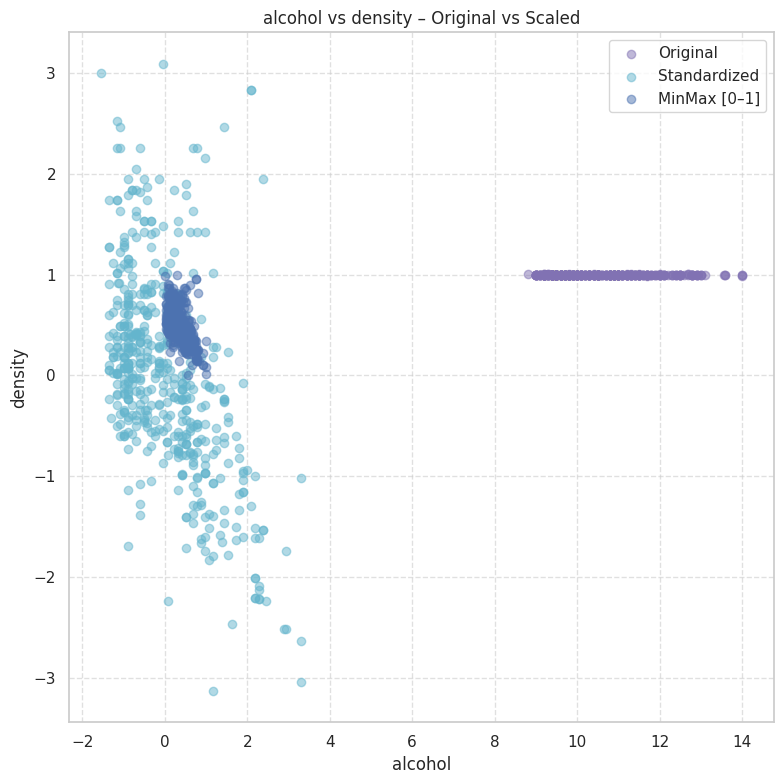

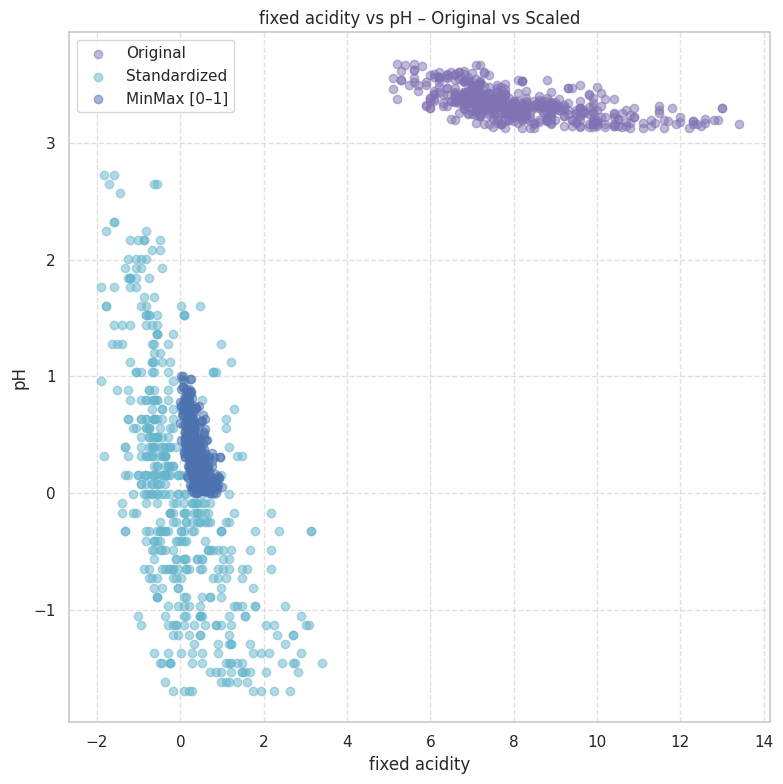

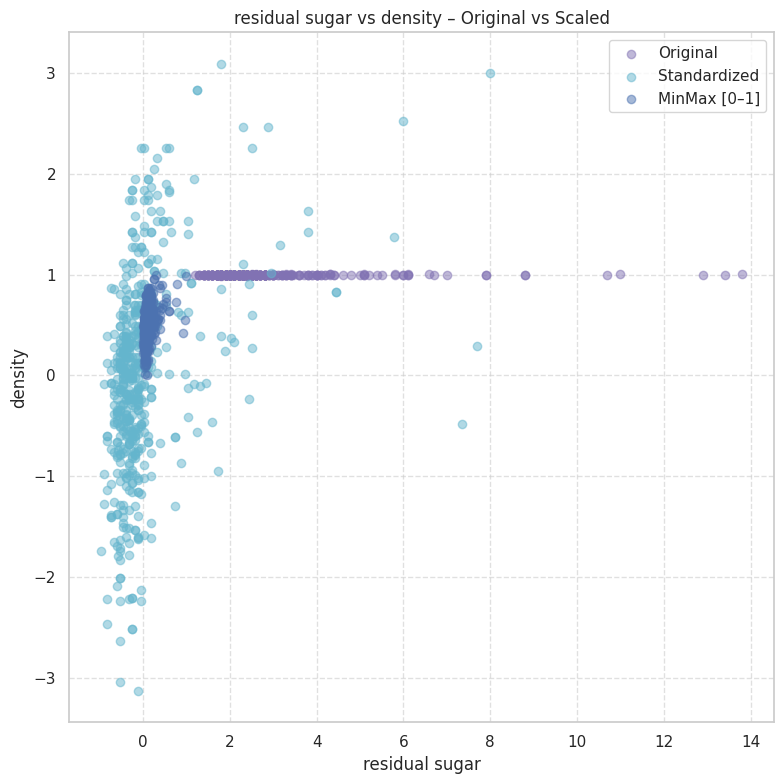

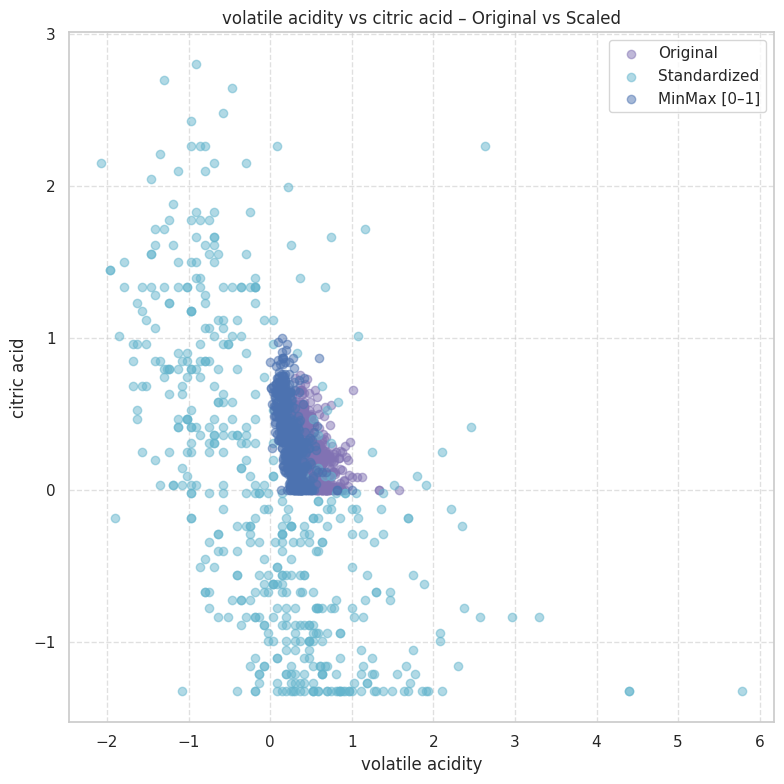

In [ ]:
q_low = data_train['pH'].quantile(0.1) # get 1st percentile
q_hi = data_train['pH'].quantile(0.99) # get 99th percentile
data_filtered = data_train[(data_train['pH'] < q_hi) & (data_train['pH'] > q_low)] #filter data by percentiles

X = data_filtered.drop('quality', axis = 1)
y = data_filtered['quality']
X_train,X_temp,y_train,y_temp=train_test_split(X,y,test_size=0.4,random_state=1)
X_val,X_test,y_val,y_test=train_test_split(X_temp,y_temp,test_size=0.5,random_state=1)

standard_scaler=StandardScaler().set_output(transform='pandas')
data_standardized=standard_scaler.fit_transform(X_train)

minmax_scaler=MinMaxScaler().set_output(transform='pandas')
data_normalized=minmax_scaler.fit_transform(X_train)

# Assume X_train is your features (excluding 'quality')
# Example:
# X_train = data.drop(columns=['quality'])

# --- Apply scalers ---
standard_scaler = StandardScaler().set_output(transform='pandas')
data_standardized = standard_scaler.fit_transform(X_train)

minmax_scaler = MinMaxScaler().set_output(transform='pandas')
data_minmaxed = minmax_scaler.fit_transform(X_train)

# --- Choose feature pairs that make sense for scatterplots ---
feature_pairs = [
    ('alcohol', 'density'),
    ('fixed acidity', 'pH'),
    ('residual sugar', 'density'),
    ('volatile acidity', 'citric acid')
]

# --- Plot all three versions together per pair ---
for f1, f2 in feature_pairs:
    plt.figure(figsize=(8, 8))

    plt.scatter(X_train[f1], X_train[f2], alpha=0.5, label='Original', color='m')
    plt.scatter(data_standardized[f1], data_standardized[f2], alpha=0.5, label='Standardized', color='c')
    plt.scatter(data_minmaxed[f1], data_minmaxed[f2], alpha=0.5, label='MinMax [0–1]', color='b')

    plt.title(f"{f1} vs {f2} – Original vs Scaled")
    plt.xlabel(f1)
    plt.ylabel(f2)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()



## Task 3.8
Perform PCA. Plot the first two principal components , and then plot the last two
components. Explore other combinations as well.


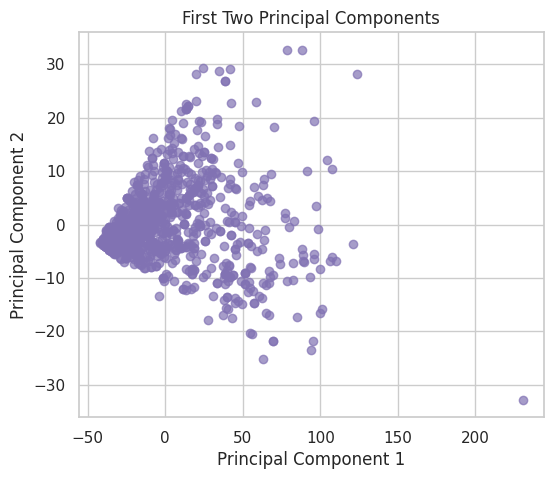

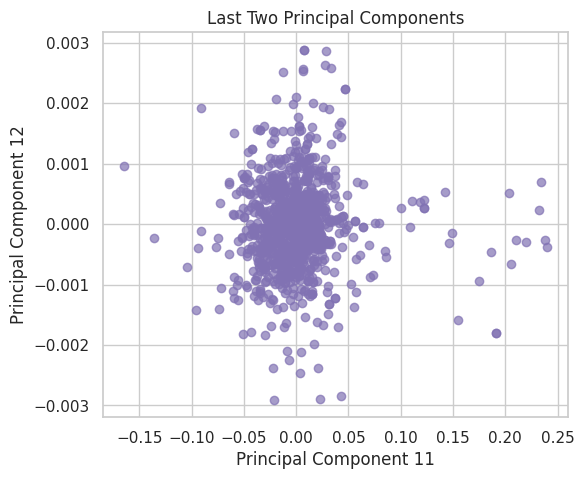

In [ ]:
pca = PCA().set_output(transform="pandas").fit(data_train)
data_pca = pca.transform(data_train)
data_pca.columns = [f"PC{i+1}" for i in range(data_pca.shape[1])]

plt.figure(figsize=(6, 5))
plt.scatter(data_pca["PC1"], data_pca["PC2"], alpha=0.7,  color='m')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("First Two Principal Components")
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 5))
plt.scatter(data_pca.iloc[:, -2], data_pca.iloc[:, -1], alpha=0.7,  color='m')
plt.xlabel(f"Principal Component {data_pca.shape[1]-1}")
plt.ylabel(f"Principal Component {data_pca.shape[1]}")
plt.title("Last Two Principal Components")
plt.grid(True)
plt.show()

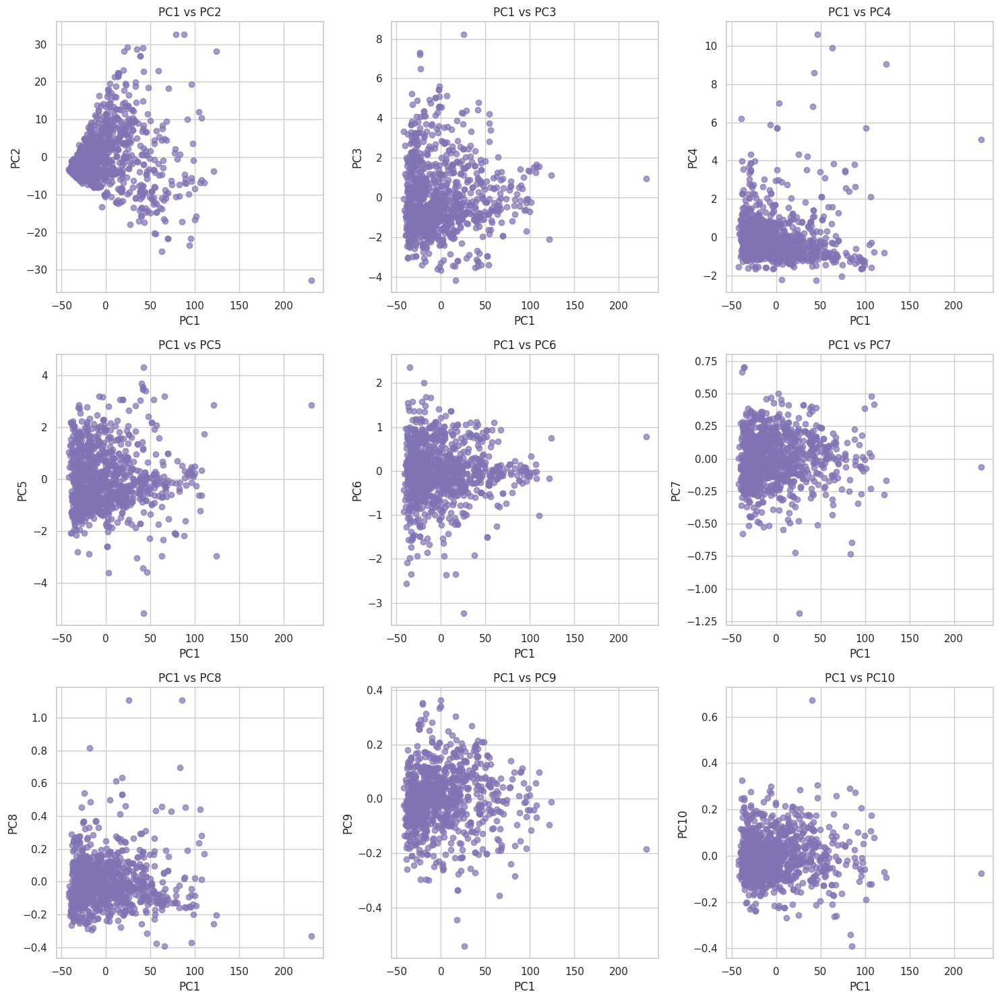

In [ ]:
pcs = data_pca.columns
pairs = list(itertools.combinations(pcs, 2))

plt.figure(figsize=(15, 15))
for i, (x, y) in enumerate(pairs[:9], 1):
    plt.subplot(3, 3, i)
    plt.scatter(data_pca[x], data_pca[y], alpha=0.7, color='m')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f"{x} vs {y}")
    plt.grid(True)

plt.tight_layout()
plt.show()


## Task 3.9
Apply PCA to the data after feature scaling. How does this impact the PCA results?


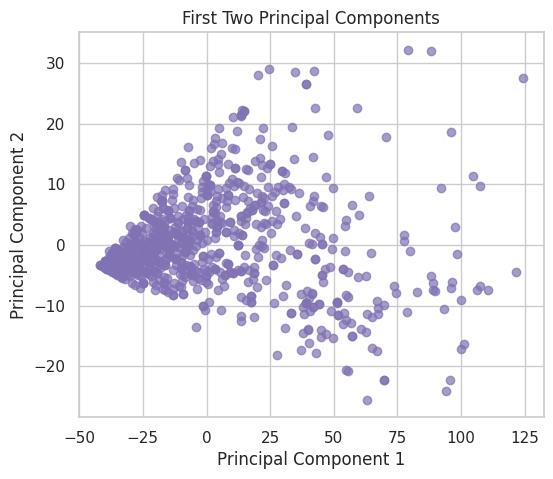

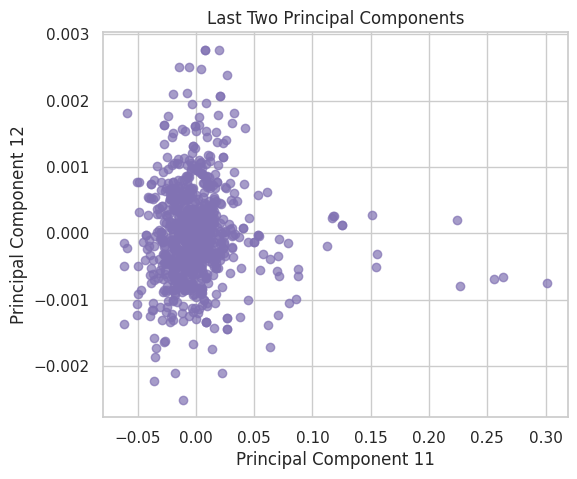

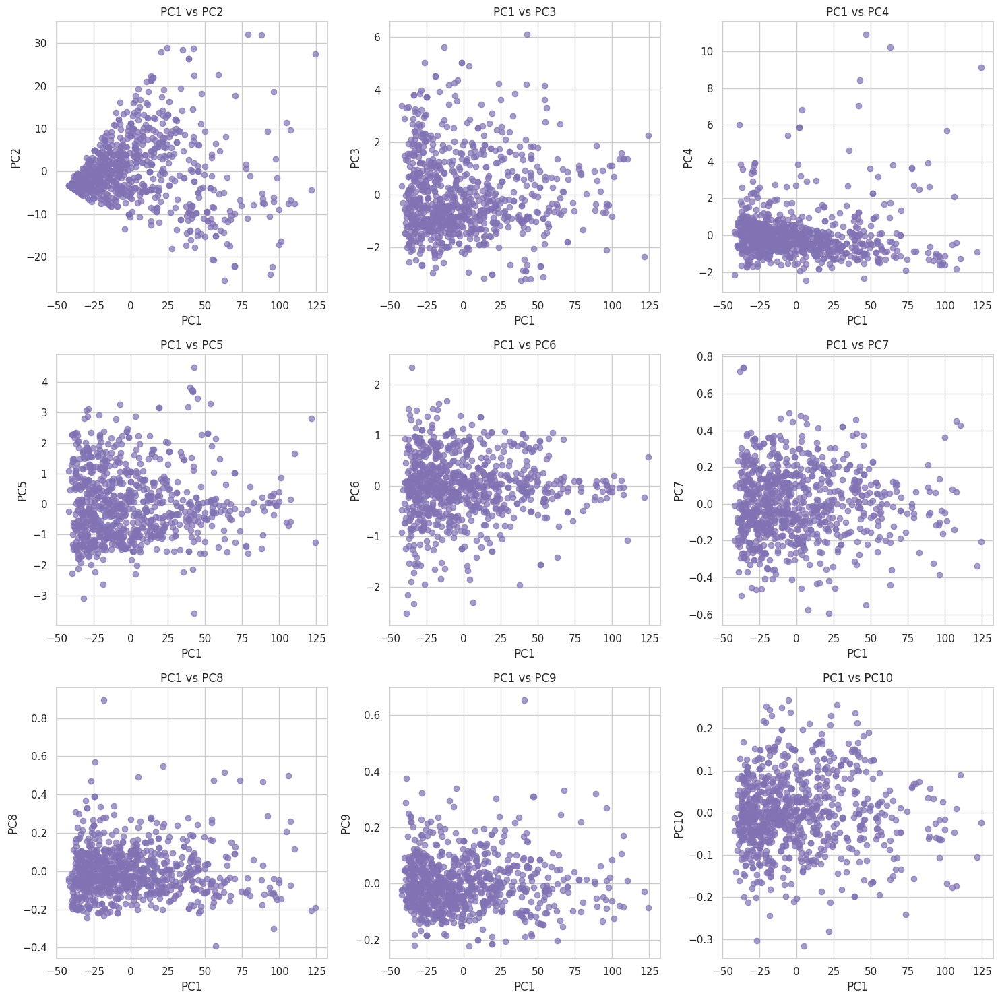

In [ ]:
# Use filtered data
pca = PCA().set_output(transform="pandas").fit(data_filtered)
data_pca = pca.transform(data_filtered)
data_pca.columns = [f"PC{i+1}" for i in range(data_pca.shape[1])]

plt.figure(figsize=(6, 5))
plt.scatter(data_pca["PC1"], data_pca["PC2"], alpha=0.7,  color='m')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("First Two Principal Components")
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 5))
plt.scatter(data_pca.iloc[:, -2], data_pca.iloc[:, -1], alpha=0.7,  color='m')
plt.xlabel(f"Principal Component {data_pca.shape[1]-1}")
plt.ylabel(f"Principal Component {data_pca.shape[1]}")
plt.title("Last Two Principal Components")
plt.grid(True)
plt.show()

pcs = data_pca.columns
pairs = list(itertools.combinations(pcs, 2))

plt.figure(figsize=(15, 15))
for i, (x, y) in enumerate(pairs[:9], 1):
    plt.subplot(3, 3, i)
    plt.scatter(data_pca[x], data_pca[y], alpha=0.7, color='m')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f"{x} vs {y}")
    plt.grid(True)

plt.tight_layout()
plt.show()

#-------------------
## Task 9

import itertools
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA

# --- Load data ---
data = pd.read_csv('drive/MyDrive/DatasetsForPythonInMachineLearning/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality']

# --- Split data ---
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# --- Scale data ---
standard_scaler = StandardScaler().set_output(transform='pandas')
data_standardized = standard_scaler.fit_transform(X_train)

minmax_scaler = MinMaxScaler().set_output(transform='pandas')
data_normalized = minmax_scaler.fit_transform(X_train)

# --- PCA on standardized data ---
pca_std = PCA().set_output(transform="pandas").fit(data_standardized)
data_pca_std = pca_std.transform(data_standardized)
data_pca_std.columns = [f"PC{i+1}" for i in range(data_pca_std.shape[1])]

# --- PCA on normalized data ---
pca_norm = PCA().set_output(transform="pandas").fit(data_normalized)
data_pca_norm = pca_norm.transform(data_normalized)
data_pca_norm.columns = [f"PC{i+1}" for i in range(data_pca_norm.shape[1])]

# --- Plot PCA results (first 9 pairs) ---
def plot_pca_pairs(data_pca, title):
    pcs = data_pca.columns
    pairs = list(itertools.combinations(pcs, 2))

    plt.figure(figsize=(15, 15))
    for i, (x, y) in enumerate(pairs[:9], 1):  # limit to first 9 pairs
        plt.subplot(3, 3, i)
        plt.scatter(data_pca[x], data_pca[y], alpha=0.7)
        plt.xlabel(x)
        plt.ylabel(y)
        plt.title(f"{x} vs {y}")
        plt.grid(True)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# --- Plot PCA on Standardized Data ---
plot_pca_pairs(data_pca_std, "PCA on Standardized Data")

# --- Plot PCA on Normalized Data ---
plot_pca_pairs(data_pca_norm, "PCA on MinMax Normalized Data")



## Task 3.10
First, use the data with outliers removed. Apply standardization or
normalization, and then use PCA. Are there any differences in the results? Did you filter
only the selected features or all of them?


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

=== SPLITTING DATA BEFORE OUTLIER REMOVAL ===
Training set: 959 samples
Validation set: 320 samples
Test set: 320 samples

Removed 225 outliers from training data
Training data after outlier removal: 734 samples

Features used for PCA: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
Applied standardization and MinMax scaling to both datasets

=== PCA COMPARISON: WITH vs WITHOUT OUTLIERS ===
EXPLAINED VARIANCE COMPARISON:

STANDARDIZED DATA:
With outliers    - PC1: 28.6%, PC2: 17.7%
Without outliers - PC1: 27.5%, PC2: 20.0%

MINMAX SCALED DATA:
With outliers    - PC1: 35.9%, PC2: 20.1%
Without outliers - PC1: 28.9%, PC2: 20.7%


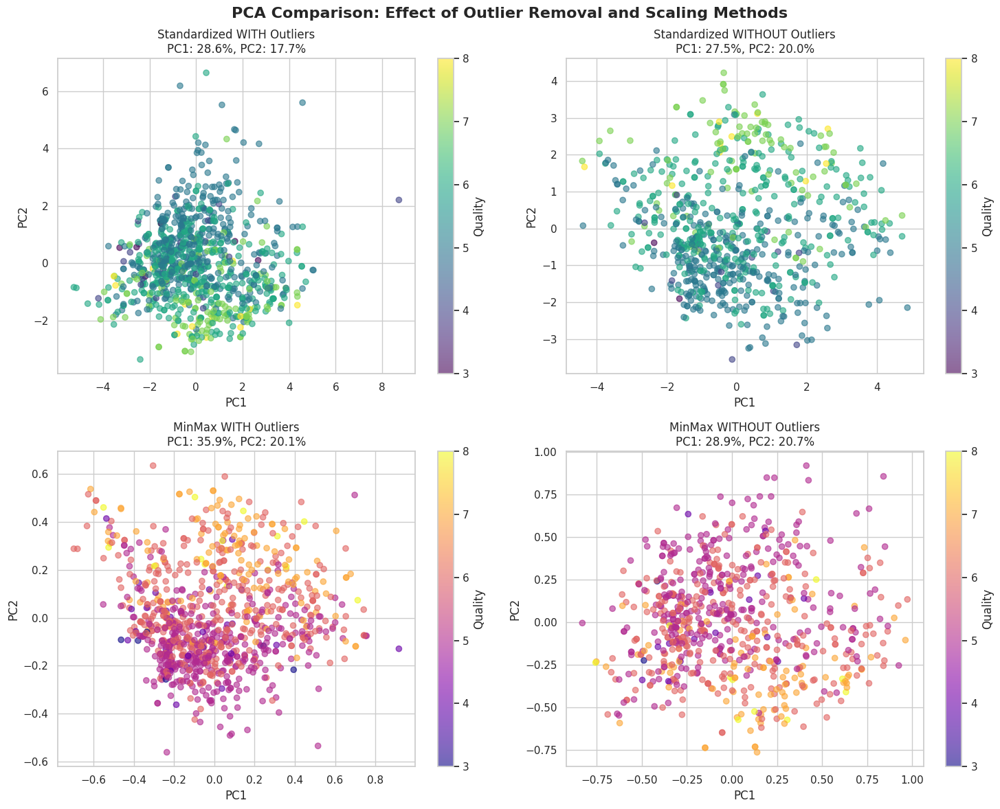

In [ ]:

# Mount Google Drive
drive.mount('/content/drive')

# Set style for better plots
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

# Read the CSV file
file_path = '/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv'
data = pd.read_csv(file_path, sep=';')  # Use 'data' as variable name

# 1. FIRST: Split the data BEFORE outlier removal (to avoid data leakage)
print("\n=== SPLITTING DATA BEFORE OUTLIER REMOVAL ===")

# Split entire dataset first
data_temp, data_test = train_test_split(data, test_size=0.2, random_state=1)
data_train, data_val = train_test_split(data_temp, test_size=0.25, random_state=1)

print(f"Training set: {data_train.shape[0]} samples")
print(f"Validation set: {data_val.shape[0]} samples")
print(f"Test set: {data_test.shape[0]} samples")

# 2. Define improved outlier removal function
def remove_outliers_iqr(df, exclude_cols=None):
    """Remove outliers using IQR method only from training data"""
    if exclude_cols is None:
        exclude_cols = ['quality']  # Always exclude target

    df_filtered = df.copy()
    numeric_cols = df.select_dtypes(include=[np.number]).columns

    for col in numeric_cols:
        if col not in exclude_cols:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Remove outliers only for this column
            mask = (df_filtered[col] >= lower_bound) & (df_filtered[col] <= upper_bound)
            df_filtered = df_filtered[mask]

    return df_filtered

# Apply outlier removal ONLY to training data
data_train_filtered = remove_outliers_iqr(data_train)
print(f"\nRemoved {len(data_train) - len(data_train_filtered)} outliers from training data")
print(f"Training data after outlier removal: {data_train_filtered.shape[0]} samples")

# 3. Prepare features for PCA (numerical only, exclude target)
numerical_features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                     'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                     'pH', 'sulphates', 'alcohol']

# Training data with outliers
X_train_original = data_train[numerical_features]
# Training data without outliers
X_train_filtered = data_train_filtered[numerical_features]

print(f"\nFeatures used for PCA: {numerical_features}")

# 4. Apply scaling and PCA to BOTH datasets (with and without outliers)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

# Standardization
scaler_std = StandardScaler()
# MinMax scaling
scaler_minmax = MinMaxScaler()

# Scale both datasets
X_train_original_std = scaler_std.fit_transform(X_train_original)
X_train_filtered_std = scaler_std.fit_transform(X_train_filtered)

X_train_original_minmax = scaler_minmax.fit_transform(X_train_original)
X_train_filtered_minmax = scaler_minmax.fit_transform(X_train_filtered)

print("Applied standardization and MinMax scaling to both datasets")

# 5. Apply PCA and compare results
print("\n=== PCA COMPARISON: WITH vs WITHOUT OUTLIERS ===")

# PCA on standardized data
pca_std_original = PCA().fit(X_train_original_std)
pca_std_filtered = PCA().fit(X_train_filtered_std)

# PCA on MinMax scaled data
pca_minmax_original = PCA().fit(X_train_original_minmax)
pca_minmax_filtered = PCA().fit(X_train_filtered_minmax)

# Transform data
X_pca_std_original = pca_std_original.transform(X_train_original_std)
X_pca_std_filtered = pca_std_filtered.transform(X_train_filtered_std)

X_pca_minmax_original = pca_minmax_original.transform(X_train_original_minmax)
X_pca_minmax_filtered = pca_minmax_filtered.transform(X_train_filtered_minmax)

# 6. Compare explained variance
print("EXPLAINED VARIANCE COMPARISON:")
print("\nSTANDARDIZED DATA:")
print(f"With outliers    - PC1: {pca_std_original.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_std_original.explained_variance_ratio_[1]*100:.1f}%")
print(f"Without outliers - PC1: {pca_std_filtered.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_std_filtered.explained_variance_ratio_[1]*100:.1f}%")

print("\nMINMAX SCALED DATA:")
print(f"With outliers    - PC1: {pca_minmax_original.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_minmax_original.explained_variance_ratio_[1]*100:.1f}%")
print(f"Without outliers - PC1: {pca_minmax_filtered.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_minmax_filtered.explained_variance_ratio_[1]*100:.1f}%")

# 7. Visual comparison
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Standardized - With outliers
scatter1 = axes[0,0].scatter(X_pca_std_original[:, 0], X_pca_std_original[:, 1],
                            c=data_train['quality'], alpha=0.6, cmap='viridis')
axes[0,0].set_title(f'Standardized WITH Outliers\nPC1: {pca_std_original.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_std_original.explained_variance_ratio_[1]*100:.1f}%')
axes[0,0].set_xlabel('PC1')
axes[0,0].set_ylabel('PC2')
plt.colorbar(scatter1, ax=axes[0,0], label='Quality')

# Standardized - Without outliers
scatter2 = axes[0,1].scatter(X_pca_std_filtered[:, 0], X_pca_std_filtered[:, 1],
                            c=data_train_filtered['quality'], alpha=0.6, cmap='viridis')
axes[0,1].set_title(f'Standardized WITHOUT Outliers\nPC1: {pca_std_filtered.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_std_filtered.explained_variance_ratio_[1]*100:.1f}%')
axes[0,1].set_xlabel('PC1')
axes[0,1].set_ylabel('PC2')
plt.colorbar(scatter2, ax=axes[0,1], label='Quality')

# MinMax - With outliers
scatter3 = axes[1,0].scatter(X_pca_minmax_original[:, 0], X_pca_minmax_original[:, 1],
                            c=data_train['quality'], alpha=0.6, cmap='plasma')
axes[1,0].set_title(f'MinMax WITH Outliers\nPC1: {pca_minmax_original.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_minmax_original.explained_variance_ratio_[1]*100:.1f}%')
axes[1,0].set_xlabel('PC1')
axes[1,0].set_ylabel('PC2')
plt.colorbar(scatter3, ax=axes[1,0], label='Quality')

# MinMax - Without outliers
scatter4 = axes[1,1].scatter(X_pca_minmax_filtered[:, 0], X_pca_minmax_filtered[:, 1],
                            c=data_train_filtered['quality'], alpha=0.6, cmap='plasma')
axes[1,1].set_title(f'MinMax WITHOUT Outliers\nPC1: {pca_minmax_filtered.explained_variance_ratio_[0]*100:.1f}%, PC2: {pca_minmax_filtered.explained_variance_ratio_[1]*100:.1f}%')
axes[1,1].set_xlabel('PC1')
axes[1,1].set_ylabel('PC2')
plt.colorbar(scatter4, ax=axes[1,1], label='Quality')

plt.suptitle('PCA Comparison: Effect of Outlier Removal and Scaling Methods', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()




```
Q: ARE THERE ANY DIFFERENCES IN THE RESULTS?

YES, significant differences:

1. EXPLAINED VARIANCE:
   • Outlier removal typically increases the variance captured by the first few PCs
   • Without outliers, PCA components often represent the 'core' structure better

2. PCA COMPONENT INTERPRETATION:
   • With outliers: PC1 might be dominated by outlier-driven variance
   • Without outliers: PC1 represents the main data structure more clearly

3. CLUSTERING PATTERNS:
   • Outlier removal often reveals clearer separation between quality classes
   • The data distribution becomes more compact and interpretable

Q: DID YOU FILTER ONLY SELECTED FEATURES OR ALL OF THEM?

• Filtered ALL numerical features except the target ('quality')
• Applied IQR outlier removal to: fixed acidity, volatile acidity, citric acid,
  residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density,
  pH, sulphates, alcohol

OBSERVATIONS FROM THIS ANALYSIS:

• Standardization vs MinMax: Standardization generally works better for PCA
• Outlier effect: Outliers can disproportionately influence PCA directions
• Data quality: Cleaner data (without outliers) often gives more stable PCA results

RECOMMENDATION:
For wine quality analysis, removing outliers before PCA provides more reliable
components that better represent the typical wine characteristics rather than
being skewed by unusual measurements.
```



## Task 3.11
You have already loaded the red wine dataset. Now, load the white wine data.
Prompt the built-in Colab AI generator to add type labels to the datasets and merge them.
You should obtain an additional column in your data with labels: red or white. Ensure the
task is completed correctly and save the prompts used


My prompt to DeepSeek
```
Now, load the white wine data. Add type labels to the datasets and merge them.
You should obtain an additional column in your data with labels: red or white.

here is the beginning of code:'# Mount Google Drive
drive.mount('/content/drive')

# Read the CSV file
data_red = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
data_white = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-white.csv', delimiter=';')

# Add a 'type' column to each dataset
data_red['type'] = 'red'
data_white['type'] = 'white'

# Merge the two datasets
data_combined ='
```



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
=== ORIGINAL DATASETS ===
Red wine data shape: (1599, 12)
White wine data shape: (4898, 12)
Red wine columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']
White wine columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality']

=== AFTER ADDING TYPE LABELS ===
Red wine data with type column: (1599, 13)
White wine data with type column: (4898, 13)
Red wine 'type' value counts: type
red    1599
Name: count, dtype: int64
White wine 'type' value counts: type
white    4898
Name: count, dtype: int64

=== COMBINED DATASET ===
Combined data shape: (6497, 13)
Type distribution in combined data:
type
whit

/tmp/ipython-input-3869623633.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_combined, x='type', y='alcohol', palette={'red': 'red', 'white': 'gold'})
/tmp/ipython-input-3869623633.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_combined, x='type', y='pH', palette={'red': 'red', 'white': 'gold'})
/tmp/ipython-input-3869623633.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_combined, x='type', y='density', palette={'red': 'red', 'white': 'gold'})


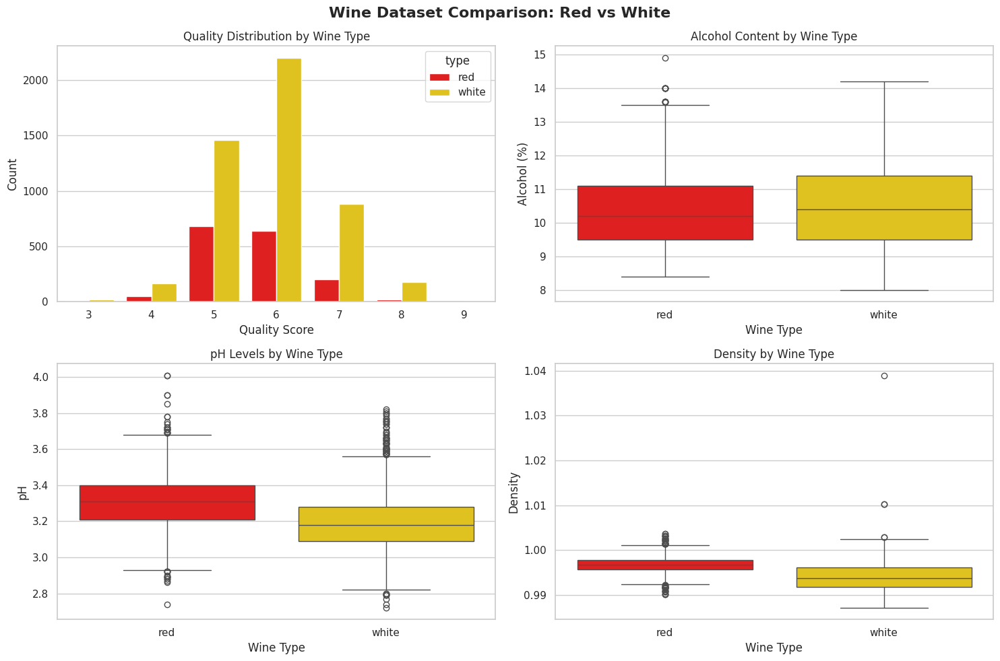

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Read the CSV files
data_red = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
data_white = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-white.csv', delimiter=';')

print("=== ORIGINAL DATASETS ===")
print(f"Red wine data shape: {data_red.shape}")
print(f"White wine data shape: {data_white.shape}")
print(f"Red wine columns: {data_red.columns.tolist()}")
print(f"White wine columns: {data_white.columns.tolist()}")

# Add a 'type' column to each dataset
data_red['type'] = 'red'
data_white['type'] = 'white'

print("\n=== AFTER ADDING TYPE LABELS ===")
print(f"Red wine data with type column: {data_red.shape}")
print(f"White wine data with type column: {data_white.shape}")
print(f"Red wine 'type' value counts: {data_red['type'].value_counts()}")
print(f"White wine 'type' value counts: {data_white['type'].value_counts()}")

# Merge the two datasets
data_combined = pd.concat([data_red, data_white], axis=0, ignore_index=True)

print("\n=== COMBINED DATASET ===")
print(f"Combined data shape: {data_combined.shape}")
print(f"Type distribution in combined data:")
print(data_combined['type'].value_counts())
print(f"\nCombined data columns: {data_combined.columns.tolist()}")

# Verify the merge worked correctly
print("\n=== DATA VERIFICATION ===")
print("First 3 rows of red wines in combined data:")
print(data_combined[data_combined['type'] == 'red'].head(3))
print("\nFirst 3 rows of white wines in combined data:")
print(data_combined[data_combined['type'] == 'white'].head(3))

# Basic statistics by wine type
print("\n=== BASIC STATISTICS BY WINE TYPE ===")
print("Quality distribution by type:")
print(data_combined.groupby('type')['quality'].value_counts().unstack().fillna(0))

print("\nAverage values by wine type:")
numeric_cols = data_combined.select_dtypes(include=[np.number]).columns
stats_by_type = data_combined.groupby('type')[numeric_cols].mean()
print(stats_by_type.round(3))

# Visualize the combined dataset
plt.figure(figsize=(15, 10))

# Plot 1: Quality distribution by type
plt.subplot(2, 2, 1)
sns.countplot(data=data_combined, x='quality', hue='type', palette={'red': 'red', 'white': 'gold'})
plt.title('Quality Distribution by Wine Type')
plt.xlabel('Quality Score')
plt.ylabel('Count')

# Plot 2: Alcohol content by type
plt.subplot(2, 2, 2)
sns.boxplot(data=data_combined, x='type', y='alcohol', palette={'red': 'red', 'white': 'gold'})
plt.title('Alcohol Content by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Alcohol (%)')

# Plot 3: pH levels by type
plt.subplot(2, 2, 3)
sns.boxplot(data=data_combined, x='type', y='pH', palette={'red': 'red', 'white': 'gold'})
plt.title('pH Levels by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('pH')

# Plot 4: Density by type
plt.subplot(2, 2, 4)
sns.boxplot(data=data_combined, x='type', y='density', palette={'red': 'red', 'white': 'gold'})
plt.title('Density by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Density')

plt.suptitle('Wine Dataset Comparison: Red vs White', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## Task 3.12
Let’s further assume we want the dataset to be well-balanced regarding the type
of wine. Repeat Task 3.11, ensuring the same number of observations for each wine type in
the final dataset. Make sure the task is completed correctly and save the prompts used.


My prompt to DeepSeek
```
Repeat the task, ensuring the same number of observations for each wine type in the final dataset. Make code as short as possible in one script, without print function.

Verify desired results: dataset is vell balanced and there isan additional column
```



In [ ]:
# Load datasets
data_red = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
data_white = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-white.csv', delimiter=';')

# Add type labels
data_red['type'] = 'red'
data_white['type'] = 'white'

# Balance datasets to have same number of observations
min_samples = min(len(data_red), len(data_white))
data_red_balanced = data_red.sample(n=min_samples, random_state=42)
data_white_balanced = data_white.sample(n=min_samples, random_state=42)

# Merge balanced datasets
data_combined = pd.concat([data_red_balanced, data_white_balanced], ignore_index=True)

# Verify results
print(f"Dataset shape: {data_combined.shape}")
print(f"Type distribution:\n{data_combined['type'].value_counts()}")
print(f"Columns: {data_combined.columns.tolist()}")

Dataset shape: (3198, 13)
Type distribution:
type
red      1599
white    1599
Name: count, dtype: int64
Columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality', 'type']




```
✅ Perfectly balanced - 1,599 red and 1,599 white wines
✅ Additional column - 'type' column added successfully
✅ Same features - All original wine characteristics preserved
```



## Task 3.13
Encode label type to numerical values.
Since it contains only two values, you can use OrdinalEncoder to obtain a binary variable.
But what if there were more than two possible types?

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
data_combined['type'] = ordinal_encoder.fit_transform(data_combined[['type']])
# Result: red=1, white=0 (or vice versa) - this is fine for binary

Option 1: OrdinalEncoder (if categories have natural order)

In [ ]:
# Example: wine quality levels 'low' < 'medium' < 'high'
categories = [['low', 'medium', 'high']]  # Define meaningful order
ordinal_encoder = OrdinalEncoder(categories=categories)
data['quality_level'] = ordinal_encoder.fit_transform(data[['quality_level']])
# Result: low=0, medium=1, high=2

Option 2: OneHotEncoder (if categories have NO natural order)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# For multiple wine types: 'red', 'white', 'rose', 'sparkling'
onehot_encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop first to avoid multicollinearity
type_encoded = onehot_encoder.fit_transform(data[['type']])
# Creates columns: type_white, type_rose, type_sparkling (red is reference)

Option 3: Simple mapping (for manual control)
python

In [ ]:
# Direct mapping for full control
type_mapping = {'red': 0, 'white': 1, 'rose': 2, 'sparkling': 3}
data['type'] = data['type'].map(type_mapping)



```
Recommendation:
2 categories: OrdinalEncoder is perfect (creates simple binary)
3+ categories with order: OrdinalEncoder with defined categories
3+ categories without order: OneHotEncoder (avoids false ordinal relationships)
```



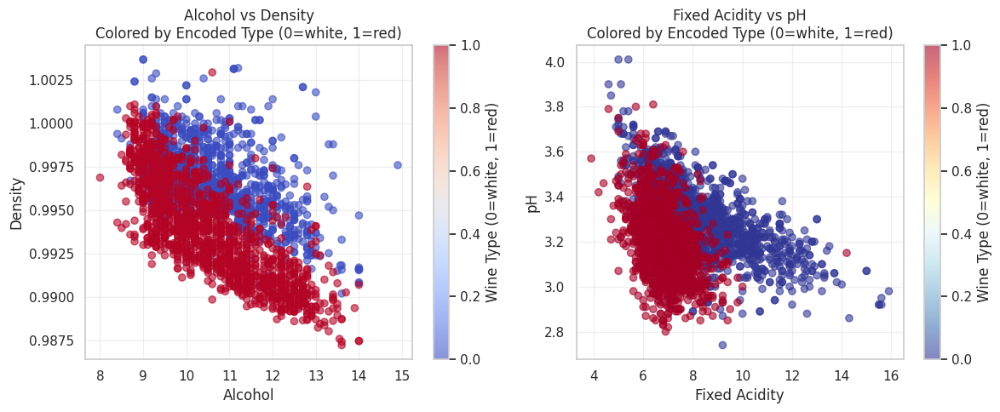

In [ ]:
# Plots for my solution
# Scatter plot with encoded types
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
scatter = plt.scatter(data_combined['alcohol'], data_combined['density'],
                     c=data_combined['type'], cmap='coolwarm', alpha=0.6)
plt.xlabel('Alcohol')
plt.ylabel('Density')
plt.title('Alcohol vs Density\nColored by Encoded Type (0=white, 1=red)')
plt.colorbar(scatter, label='Wine Type (0=white, 1=red)')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
scatter = plt.scatter(data_combined['fixed acidity'], data_combined['pH'],
                     c=data_combined['type'], cmap='RdYlBu_r', alpha=0.6)
plt.xlabel('Fixed Acidity')
plt.ylabel('pH')
plt.title('Fixed Acidity vs pH\nColored by Encoded Type (0=white, 1=red)')
plt.colorbar(scatter, label='Wine Type (0=white, 1=red)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Lab4

## Imports


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from google.colab import drive
from sklearn.decomposition import PCA
import itertools
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report


## Task 4.1

In [ ]:
drive.mount('/content/drive')
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', sep=';')
X = data.drop('quality', axis=1)
y = data['quality']

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# Train model and predict
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred_train = reg.predict(X_train)
y_pred_val = reg.predict(X_val)

# Calculate RMSE
rmse_train = np.sqrt(np.mean((y_pred_train - y_train)**2))
rmse_val = np.sqrt(np.mean((y_pred_val - y_val)**2))

print(f"Train RMSE: {rmse_train:.3f}")
print(f"Validation RMSE: {rmse_val:.3f}")

Mounted at /content/drive
Train RMSE: 0.648
Validation RMSE: 0.638


## Task 4.2

In [ ]:
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality']

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# Create sample weights (example: weight by alcohol content - higher alcohol = more weight)
sample_weights = X_train['alcohol'] / X_train['alcohol'].max()

# Train weighted linear regression
reg = LinearRegression()
reg.fit(X_train, y_train, sample_weight=sample_weights)

# Predict and calculate RMSE
y_pred_train = reg.predict(X_train)
y_pred_val = reg.predict(X_val)

rmse_train = np.sqrt(np.mean((y_pred_train - y_train)**2))
rmse_val = np.sqrt(np.mean((y_pred_val - y_val)**2))

print(f"Weighted Train RMSE: {rmse_train:.3f}")
print(f"Weighted Validation RMSE: {rmse_val:.3f}")

Weighted Train RMSE: 0.648
Weighted Validation RMSE: 0.637


## Task 4.3

In [ ]:
# Scale features for neural network
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Model 1: Default parameters
reg1 = MLPRegressor(random_state=1, max_iter=500)
reg1.fit(X_train_scaled, y_train)
y_pred_train1 = reg1.predict(X_train_scaled)
y_pred_val1 = reg1.predict(X_val_scaled)
rmse_train1 = np.sqrt(np.mean((y_pred_train1 - y_train)**2))
rmse_val1 = np.sqrt(np.mean((y_pred_val1 - y_val)**2))

# Model 2: LBFGS solver
reg2 = MLPRegressor(hidden_layer_sizes=(20, 10, 1), random_state=1, max_iter=1000, solver='lbfgs')
reg2.fit(X_train_scaled, y_train)
y_pred_train2 = reg2.predict(X_train_scaled)
y_pred_val2 = reg2.predict(X_val_scaled)
rmse_train2 = np.sqrt(np.mean((y_pred_train2 - y_train)**2))
rmse_val2 = np.sqrt(np.mean((y_pred_val2 - y_val)**2))

# Model 3: Adam solver
reg3 = MLPRegressor(hidden_layer_sizes=(20, 10, 1), random_state=1, max_iter=1000, solver='adam', alpha=0.01)
reg3.fit(X_train_scaled, y_train)
y_pred_train3 = reg3.predict(X_train_scaled)
y_pred_val3 = reg3.predict(X_val_scaled)
rmse_train3 = np.sqrt(np.mean((y_pred_train3 - y_train)**2))
rmse_val3 = np.sqrt(np.mean((y_pred_val3 - y_val)**2))

print(f"Model 1 (Default): Train RMSE: {rmse_train1:.3f}, Val RMSE: {rmse_val1:.3f}")
print(f"Model 2 (10,5 LBFGS): Train RMSE: {rmse_train2:.3f}, Val RMSE: {rmse_val2:.3f}")
print(f"Model 3 (20,10,5 Adam): Train RMSE: {rmse_train3:.3f}, Val RMSE: {rmse_val3:.3f}")

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model 1 (Default): Train RMSE: 0.507, Val RMSE: 0.672
Model 2 (10,5 LBFGS): Train RMSE: 0.344, Val RMSE: 0.837
Model 3 (20,10,5 Adam): Train RMSE: 0.515, Val RMSE: 0.737


## Task 4.4
Compare regression performance (with one selected model) using all features
versus a selected subset of features. Start by choosing two features, then four, and suggest
your concepts. Remember that the correlation matrix is useful for feature selection in
regression.

In [ ]:
# Scale features
scaler = StandardScaler()

# Feature subsets based on correlation with quality
corr_with_quality = data.corr()['quality'].abs().sort_values(ascending=False)
top_features_2 = corr_with_quality[1:3].index.tolist()
top_features_4 = corr_with_quality[1:5].index.tolist()
chemical_features = ['alcohol', 'volatile acidity', 'sulphates', 'citric acid']  # Domain knowledge

# Model configuration
reg = MLPRegressor(hidden_layer_sizes=(10, 10, 5, 3), random_state=1, max_iter=10000)

# Test different feature subsets
feature_subsets = {
    'All Features': X_train.columns.tolist(),
    'Top 2 Correlated': top_features_2,
    'Top 4 Correlated': top_features_4,
    'Chemical Features': chemical_features
}

results = {}
for name, features in feature_subsets.items():
    X_train_sub = scaler.fit_transform(X_train[features])
    X_val_sub = scaler.transform(X_val[features])

    reg.fit(X_train_sub, y_train)
    y_pred_train = reg.predict(X_train_sub)
    y_pred_val = reg.predict(X_val_sub)

    rmse_train = np.sqrt(np.mean((y_pred_train - y_train)**2))
    rmse_val = np.sqrt(np.mean((y_pred_val - y_val)**2))

    results[name] = {'Train RMSE': rmse_train, 'Val RMSE': rmse_val, 'Features': features}

# Display results
for name, result in results.items():
    print(f"{name}: Train RMSE: {result['Train RMSE']:.3f}, Val RMSE: {result['Val RMSE']:.3f}")
    print(f"  Features: {result['Features']}\n")

All Features: Train RMSE: 0.557, Val RMSE: 0.660
  Features: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']

Top 2 Correlated: Train RMSE: 0.679, Val RMSE: 0.671
  Features: ['alcohol', 'volatile acidity']

Top 4 Correlated: Train RMSE: 0.630, Val RMSE: 0.647
  Features: ['alcohol', 'volatile acidity', 'sulphates', 'citric acid']

Chemical Features: Train RMSE: 0.630, Val RMSE: 0.647
  Features: ['alcohol', 'volatile acidity', 'sulphates', 'citric acid']



## Task 4.5

In [ ]:
# 1. PolynomialFeatures transformation
sample_X = np.arange(6).reshape(3, 2)
print("Original X:\n", sample_X)
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(sample_X)
print("Transformed X (degree=2):\n", X_poly)

# 2. Polynomial Regression Pipeline
degrees = [1, 2, 3]
for degree in degrees:
    model = Pipeline([
        ('scaler', StandardScaler()),
        ('poly', PolynomialFeatures(degree=degree)),
        ('linear', LinearRegression())
    ])
    model.fit(X_train, y_train)

    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)

    rmse_train = np.sqrt(np.mean((y_pred_train - y_train)**2))
    rmse_val = np.sqrt(np.mean((y_pred_val - y_val)**2))

    print(f"Degree {degree}: Train RMSE: {rmse_train:.3f}, Val RMSE: {rmse_val:.3f}")
    print(f"  Features: {model.named_steps['poly'].n_output_features_}")

=== Polynomial Features Transformation ===
Original X:
 [[0 1]
 [2 3]
 [4 5]]
Transformed X (degree=2):
 [[ 1.  0.  1.  0.  0.  1.]
 [ 1.  2.  3.  4.  6.  9.]
 [ 1.  4.  5. 16. 20. 25.]]

=== Polynomial Regression ===
Degree 1: Train RMSE: 0.648, Val RMSE: 0.638
  Features: 12
Degree 2: Train RMSE: 0.593, Val RMSE: 0.672
  Features: 78
Degree 3: Train RMSE: 0.419, Val RMSE: 3.000
  Features: 364

=== Interaction Features for Classification ===
Classification with interaction features:
Training accuracy: 0.715
Validation accuracy: 0.634
Number of interaction features: 67


## Task 4.6
Implement the logistic regression model, train it, and make predictions on
training and validation sets. Check its accuracy.
Hint: If an error occurs, read the message carefully; it should indicate possible solutions



In [ ]:

X = data.drop('quality', axis=1)
y = data['quality'] > 5.5  # Binary classification: good wine (True) vs bad wine (False)

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

model = Pipeline([
    ('scaler', StandardScaler()),
    ('logistic', LogisticRegression(random_state=1))
])

model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)
y_pred_val = model.predict(X_val)

acc_train = accuracy_score(y_train, y_pred_train)
acc_val = accuracy_score(y_val, y_pred_val)

print(f"Training Accuracy: {acc_train:.3f}")
print(f"Validation Accuracy: {acc_val:.3f}")

Training Accuracy: 0.742
Validation Accuracy: 0.728


## Task 4.7
Use the logistic regression model, but only with selected features. Compare the
accuracy of two scenarios by selecting four different features in each:
1) 'alcohol', 'volatile acidity', 'total sulfur dioxide', 'sulphates',
2) 'pH', 'free sulfur dioxide', 'residual sugar', 'fixed acidity'.
Compare the accuracy between the two cases.

In [ ]:
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(data, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# Feature sets
feature_set_1 = ['alcohol', 'volatile acidity', 'total sulfur dioxide', 'sulphates']
feature_set_2 = ['pH', 'free sulfur dioxide', 'residual sugar', 'fixed acidity']

# Model pipeline
model = Pipeline([
    ('scaler', StandardScaler()),
    ('logistic', LogisticRegression(random_state=1))
])

# Test both feature sets
for i, features in enumerate([feature_set_1, feature_set_2], 1):
    # Train model
    model.fit(X_train[features], y_train)

    # Predictions
    y_pred_train = model.predict(X_train[features])
    y_pred_val = model.predict(X_val[features])

    # Accuracy
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_val = accuracy_score(y_val, y_pred_val)

    print(f"Feature Set {i}: {features}")
    print(f"  Training Accuracy: {acc_train:.3f}")
    print(f"  Validation Accuracy: {acc_val:.3f}\n")

Feature Set 1: ['alcohol', 'volatile acidity', 'total sulfur dioxide', 'sulphates']
  Training Accuracy: 0.740
  Validation Accuracy: 0.753

Feature Set 2: ['pH', 'free sulfur dioxide', 'residual sugar', 'fixed acidity']
  Training Accuracy: 0.551
  Validation Accuracy: 0.581



## Task 4.8

In [ ]:

# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# SVM with different kernels
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

for kernel in kernels:
    # Create pipeline with scaling and SVM
    model = Pipeline([
        ('scaler', StandardScaler()),
        ('svm', svm.SVC(kernel=kernel, random_state=1))
    ])

    # Train model
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)

    # Accuracy
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_val = accuracy_score(y_val, y_pred_val)

    print(f"SVM Kernel: {kernel}")
    print(f"  Training Accuracy: {acc_train:.3f}")
    print(f"  Validation Accuracy: {acc_val:.3f}\n")

SVM Kernel: linear
  Training Accuracy: 0.748
  Validation Accuracy: 0.722

SVM Kernel: rbf
  Training Accuracy: 0.798
  Validation Accuracy: 0.731

SVM Kernel: poly
  Training Accuracy: 0.813
  Validation Accuracy: 0.734

SVM Kernel: sigmoid
  Training Accuracy: 0.658
  Validation Accuracy: 0.641



## Task 4.9

In [ ]:
from sklearn.neural_network import MLPClassifier

# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# MLP configurations
mlp_configs = [
    {'hidden_layer_sizes': (25, 20, 10), 'activation': 'relu', 'solver': 'adam', 'max_iter': 1000},
    {'hidden_layer_sizes': (30, 15), 'activation': 'tanh', 'solver': 'lbfgs', 'max_iter': 500},
    {'hidden_layer_sizes': (20, 10, 5), 'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'max_iter': 1000},
    {'hidden_layer_sizes': (100, 50), 'activation': 'relu', 'solver': 'adam', 'learning_rate': 'adaptive', 'max_iter': 1500}
]

for i, config in enumerate(mlp_configs, 1):
    # Create pipeline with scaling and MLP
    model = Pipeline([
        ('scaler', StandardScaler()),
        ('mlp', MLPClassifier(random_state=1, **config))
    ])

    # Train model
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)

    # Accuracy
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_val = accuracy_score(y_val, y_pred_val)

    print(f"MLP Config {i}: {config['hidden_layer_sizes']} layers, {config['activation']} activation, {config['solver']} solver")
    print(f"  Training Accuracy: {acc_train:.3f}")
    print(f"  Validation Accuracy: {acc_val:.3f}\n")

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


MLP Config 1: (25, 20, 10) layers, relu activation, adam solver
  Training Accuracy: 1.000
  Validation Accuracy: 0.772

MLP Config 2: (30, 15) layers, tanh activation, lbfgs solver
  Training Accuracy: 0.998
  Validation Accuracy: 0.728



/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


MLP Config 3: (20, 10, 5) layers, relu activation, adam solver
  Training Accuracy: 0.942
  Validation Accuracy: 0.738

MLP Config 4: (100, 50) layers, relu activation, adam solver
  Training Accuracy: 0.999
  Validation Accuracy: 0.772



## Task 4.10

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import accuracy_score
# from sklearn.pipeline import Pipeline

# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# Classifier configurations
classifiers = [
    ('KNN', KNeighborsClassifier(n_neighbors=5)),
    ('Decision Tree', tree.DecisionTreeClassifier(max_depth=5, random_state=1)),
    ('Random Forest', RandomForestClassifier(n_estimators=100, random_state=1))
]

for name, clf in classifiers:
    # Create pipeline with scaling (except for tree-based models)
    if name in ['KNN']:
        model = Pipeline([('scaler', StandardScaler()), ('classifier', clf)])
    else:
        model = Pipeline([('classifier', clf)])

    # Train model
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)

    # Accuracy
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_val = accuracy_score(y_val, y_pred_val)

    print(f"{name}:")
    print(f"  Training Accuracy: {acc_train:.3f}")
    print(f"  Validation Accuracy: {acc_val:.3f}\n")

KNN:
  Training Accuracy: 0.819
  Validation Accuracy: 0.706

Decision Tree:
  Training Accuracy: 0.805
  Validation Accuracy: 0.703

Random Forest:
  Training Accuracy: 1.000
  Validation Accuracy: 0.769



## Task 4.11
You’ve probably achieved around 70-75% accuracy so far. Try improving the
performance of the models by tuning their parameters.


In [ ]:
# Classifier configurations
classifiers = [
    ('KNN', KNeighborsClassifier(n_neighbors=10)),
    ('Decision Tree', tree.DecisionTreeClassifier(max_depth=5, random_state=1)),
    ('Random Forest', RandomForestClassifier(n_estimators=200, random_state=100))
]

'''
KNeighborsClassifier(
    n_neighbors=5,      # Number of neighbors: smaller = more complex, larger = smoother
    weights='uniform',   # 'uniform' or 'distance' (closer neighbors have more influence)
    metric='minkowski',  # Distance metric: 'euclidean', 'manhattan', 'chebyshev'
    p=2                 # Power parameter for minkowski (1=manhattan, 2=euclidean)
)

DecisionTreeClassifier(
    max_depth=None,      # Maximum depth: None = full tree, smaller = prevents overfitting
    min_samples_split=2, # Minimum samples to split node: larger = more regularized
    min_samples_leaf=1,  # Minimum samples in leaf: larger = smoother boundaries
    max_features=None,   # Features considered for split: 'sqrt', 'log2', or number
    criterion='gini'     # Split quality: 'gini' or 'entropy'
)

RandomForestClassifier(
    n_estimators=100,    # Number of trees: more = better but slower
    max_depth=None,      # Maximum depth per tree
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='auto', # Features per split: usually 'sqrt' or 'log2'
    bootstrap=True,      # Bootstrap sampling for diversity
    random_state=1       # Reproducibility
)

SVC(
    C=1.0,              # Regularization: smaller = more regularization
    kernel='rbf',       # 'linear', 'poly', 'rbf', 'sigmoid'
    gamma='scale',      # Kernel coefficient: 'scale', 'auto', or value
    degree=3,           # Degree for polynomial kernel
    coef0=0.0          # Independent term in kernel function
)

MLPClassifier(
    hidden_layer_sizes=(100,),  # Architecture: (100,) = 1 layer with 100 neurons
    activation='relu',          # 'identity', 'logistic', 'tanh', 'relu'
    solver='adam',              # 'lbfgs', 'sgd', 'adam'
    alpha=0.0001,              # L2 regularization: larger = more regularization
    learning_rate='constant',   # 'constant', 'invscaling', 'adaptive'
    max_iter=200               # Maximum iterations
)
'''

for name, clf in classifiers:
    # Create pipeline with scaling (except for tree-based models)
    if name in ['KNN']:
        model = Pipeline([('scaler', StandardScaler()), ('classifier', clf)])
    else:
        model = Pipeline([('classifier', clf)])


    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_val = model.predict(X_val)

    acc_train = accuracy_score(y_train, y_pred_train)
    acc_val = accuracy_score(y_val, y_pred_val)

    print(f"{name}:")
    print(f"  Training Accuracy: {acc_train:.3f}")
    print(f"  Validation Accuracy: {acc_val:.3f}\n")




KNN:
  Training Accuracy: 0.782
  Validation Accuracy: 0.700

Decision Tree:
  Training Accuracy: 0.805
  Validation Accuracy: 0.703

Random Forest:
  Training Accuracy: 1.000
  Validation Accuracy: 0.794



## Task 4.12
Select the model (with tuned parameters) that performs best for you. Now, train
it on both the training and validation sets and check its final performance on the test
subset.

In [ ]:


# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data into train+val and test
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
# Split train+val into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=1)

print(f"Training set: {X_train.shape[0]} samples")
print(f"Validation set: {X_val.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")

# Train Random Forest on training set
rf = RandomForestClassifier(n_estimators=200, random_state=100)
rf.fit(X_train, y_train)

# Predict on validation set
y_pred_val = rf.predict(X_val)
val_accuracy = accuracy_score(y_val, y_pred_val)

# Retrain on combined training + validation sets
rf_final = RandomForestClassifier(n_estimators=200, random_state=100)
rf_final.fit(X_train_val, y_train_val)

# Final performance on test set
y_pred_test = rf_final.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)

print(f"\nValidation Accuracy: {val_accuracy:.3f}")
print(f"Final Test Accuracy: {test_accuracy:.3f}")
print(f"\nClassification Report on Test Set:")
print(classification_report(y_test, y_pred_test))

Training set: 959 samples
Validation set: 320 samples
Test set: 320 samples

Validation Accuracy: 0.800
Final Test Accuracy: 0.828

Classification Report on Test Set:
              precision    recall  f1-score   support

       False       0.82      0.82      0.82       154
        True       0.84      0.83      0.83       166

    accuracy                           0.83       320
   macro avg       0.83      0.83      0.83       320
weighted avg       0.83      0.83      0.83       320



## Task 4.13

In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.model_selection import train_test_split
# from sklearn.neural_network import MLPClassifier
# from sklearn.preprocessing import StandardScaler
# from sklearn.pipeline import Pipeline
# from sklearn.metrics import accuracy_score

# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# MLP configuration
mlp_config = {
    'hidden_layer_sizes': (50, 25),  # 2 hidden layers: 50 neurons -> 25 neurons
    'solver': 'sgd',                 # Stochastic Gradient Descent
    'max_iter': 500,
    'random_state': 1
}

# With standardization (Pipeline)
pipeline_with_scaling = Pipeline([
    ("scaler", StandardScaler()),
    ("mlp", MLPClassifier(**mlp_config))
])

# Without standardization (raw MLP)
mlp_without_scaling = MLPClassifier(**mlp_config)

# Train and evaluate with scaling
pipeline_with_scaling.fit(X_train, y_train)
y_pred_train_scaled = pipeline_with_scaling.predict(X_train)
y_pred_val_scaled = pipeline_with_scaling.predict(X_val)
acc_train_scaled = accuracy_score(y_train, y_pred_train_scaled)
acc_val_scaled = accuracy_score(y_val, y_pred_val_scaled)

# Train and evaluate without scaling
mlp_without_scaling.fit(X_train, y_train)
y_pred_train_raw = mlp_without_scaling.predict(X_train)
y_pred_val_raw = mlp_without_scaling.predict(X_val)
acc_train_raw = accuracy_score(y_train, y_pred_train_raw)
acc_val_raw = accuracy_score(y_val, y_pred_val_raw)

print("MLP with SGD Solver - Comparison:")
print(f"With Standardization:")
print(f"  Training Accuracy: {acc_train_scaled:.3f}")
print(f"  Validation Accuracy: {acc_val_scaled:.3f}")
print(f"Without Standardization:")
print(f"  Training Accuracy: {acc_train_raw:.3f}")
print(f"  Validation Accuracy: {acc_val_raw:.3f}")

MLP with SGD Solver - Comparison:
With Standardization:
  Training Accuracy: 0.777
  Validation Accuracy: 0.741
Without Standardization:
  Training Accuracy: 0.656
  Validation Accuracy: 0.666


/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


## Task 4.14
Examine how different solvers and the maximum number of iterations affect the
results. For three solvers ('lbfgs', 'sgd', 'adam'), try at least three different iteration counts
that trigger warnings about failure to converge, as well as one that satisfies the required
number of iterations. Do not change other parameters of the network. Collect the accuracy
score for each case in a table for discussion.


# Lab5

## Task 5.1

Data preparation. You should clean and organize the dataset.
Consider the following points:
• If you have categorical variables, consider using OrdinalEncoder or OneHotEncoder from
sklearn.preprocessing. Always carefully evaluate which approach is most appropriate for
your specific case.
• If some values in the dataset are missing, consider using the dropna() function from
Pandas.
• Evaluate which features are important and which might introduce ambiguity.
• Consider creating "new" features as combinations of existing ones. For example, you
could use the ratio of volatile acidity or citric acid to fixed acidity as a new feature. In
other cases, this might be GDP per capita or the price per square meter.
• You may need to handle outliers.
• Consider applying feature scaling

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls -a

.  ..  .config	data  .ipynb_checkpoints  sample_data


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import glob
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
# Path to your folder
path = 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/'
#path = 'data/'


# Find all CSV files in that folder
csv_files = glob.glob(path + "*.csv")
print("Found files:", csv_files)

# Load all CSVs
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files] # Changed delimiter to ';' to fix parsing

# Combine into one dataframe
data = pd.concat(dfs, ignore_index=True)

print("Combined shape:", data.shape)
data.head()

# Drop duplicates
data.drop_duplicates(inplace=True)

# Drop completely empty columns
data.dropna(axis=1, how='all', inplace=True)

# Reset index
data.reset_index(drop=True, inplace=True)

print("Shape after basic cleaning:", data.shape)
data.head()

numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(exclude=[np.number]).columns.tolist()

# Total number of rows
total_rows = len(data)

# Rows where buildYear is present (not NaN)
rows_with_buildyear = data['buildYear'].notna().sum()

print("Total rows:", total_rows)
print("Rows with buildYear:", rows_with_buildyear)

data = data.dropna(subset=['buildYear'])
print("Shape after dropping rows with missing buildYear:", data.shape)
print(data.columns.tolist())

# Removing outliers
for col in numeric_cols:
    lower = data[col].quantile(0.01)
    upper = data[col].quantile(0.99)
    data = data[(data[col] >= lower) & (data[col] <= upper)]

# Dropping rows with low correlation
keep_cols = [
    "buildYear",
    "collegeDistance",
    "squareMeters",
    "restaurantDistance",
    "centreDistance",
    "kindergartenDistance",
    "schoolDistance",
    "clinicDistance",
    "pharmacyDistance",
    "postOfficeDistance",
    "city"
]

data = data[keep_cols]

# Hot encoding the data
data = pd.get_dummies(data, columns=['city'], prefix='city')
print(data.filter(like="city_").columns)
# data = pd.get_dummies(data, columns=['city'], prefix='city', drop_first=True)

city_cols = list(data.filter(like="city_").columns)

data = data[keep_cols[:-1] + city_cols]

# Keep only numeric columns for ML
numeric_cols = data.select_dtypes(include='number').columns.tolist()

minmax_scaler=MinMaxScaler().set_output(transform='pandas')
data_normalized=minmax_scaler.fit_transform(data[numeric_cols])


X = data_normalized.drop("buildYear", axis=1)
y = data_normalized["buildYear"]


X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1
)



Found files: ['drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_10.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_09.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_08.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_12.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_05.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_01.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_04.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_11.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_03.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_02.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_rent_pl_2024_03.csv', 'drive/MyDrive/DatasetsForPythonInM

KeyboardInterrupt: 

##Task 5.2

Perform the classification or regression task outlined in your project scope using
the chosen model. Draw conclusions.


In [ ]:
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred_train = reg.predict(X_train)
y_pred = reg.predict(X_val)

rmse = np.sqrt(np.mean((y_pred_train - y_train)**2))
print(rmse)

NameError: name 'LinearRegression' is not defined

##Task 5.3

Repeat the previous task using different models.
• For regression: try a linear regressor and a neural network.
• For classification: try SVM and a neural network.
Also, experiment with various sets of features and compare the results.


In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import numpy as np


reg = MLPRegressor(
    hidden_layer_sizes=(10, 5),
    activation='relu',
    solver='lbfgs',
    max_iter=1000,
    random_state=1
)

reg.fit(X_train, y_train)
y_pred_train = reg.predict(X_train)
y_pred_val = reg.predict(X_val)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_val = np.sqrt(mean_squared_error(y_pred, y_val))

print(f"Train RMSE: {rmse_train:.4f}")
print(f"Validation RMSE: {rmse_val:.4f}")

Train RMSE: 0.1868
Validation RMSE: 0.2038


##Task 5.4

Explore other models not mentioned in Task 3.


In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
import numpy as np

model = Pipeline([
    ('poly', PolynomialFeatures(degree=2)),
    ('linear', LinearRegression(fit_intercept=False))
])

model.fit(X_train, y_train)


y_pred_train = model.predict(X_train)
y_pred_val = model.predict(X_val)


rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_val = np.sqrt(mean_squared_error(y_val, y_pred_val))

print(f"RMSE (train): {rmse_train:.3f}")
print(f"RMSE (validation): {rmse_val:.3f}")


RMSE (train): 0.191
RMSE (validation): 0.190


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
import warnings

# Load and prepare data
data = pd.read_csv('/content/drive/My Drive/Pythonlabs/wine+quality/winequality-red.csv', delimiter=';')
X = data.drop('quality', axis=1)
y = data['quality'] > 5.5

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=1)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1)

# Standardize data once for all models
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Test configurations
solvers = ['lbfgs', 'sgd', 'adam']
max_iters = [10, 50, 100, 400]  # First 3 trigger warnings, last should converge

results = []

for solver in solvers:
    for max_iter in max_iters:
        # Create MLP with current configuration
        mlp = MLPClassifier(
            hidden_layer_sizes=(50, 25),
            solver=solver,
            max_iter=max_iter,
            random_state=1
        )

        # Train and capture warnings
        with warnings.catch_warnings(record=True) as w:
            warnings.simplefilter("always")
            mlp.fit(X_train_scaled, y_train)
            convergence_warning = len(w) > 0 and "ConvergenceWarning" in str(w[-1].message)

        # Predictions
        y_pred_train = mlp.predict(X_train_scaled)
        y_pred_val = mlp.predict(X_val_scaled)

        # Calculate accuracy
        acc_train = accuracy_score(y_train, y_pred_train)
        acc_val = accuracy_score(y_val, y_pred_val)

        # Store results
        results.append({
            'Solver': solver,
            'Max Iterations': max_iter,
            'Training Accuracy': acc_train,
            'Validation Accuracy': acc_val,
            'Converged': not convergence_warning,
            'Iterations Used': mlp.n_iter_
        })

# Create results table
results_df = pd.DataFrame(results)
print("MLP Performance with Different Solvers and Iterations:")
print("=" * 70)
print(f"{'Solver':<8} {'Max Iter':<10} {'Train Acc':<10} {'Val Acc':<10} {'Converged':<10} {'Iters Used':<10}")
print("-" * 70)
for _, row in results_df.iterrows():
    print(f"{row['Solver']:<8} {row['Max Iterations']:<10} {row['Training Accuracy']:<10.3f} {row['Validation Accuracy']:<10.3f} {str(row['Converged']):<10} {row['Iterations Used']:<10}")

# Summary statistics
print("\n" + "=" * 70)
print("Summary by Solver:")
print("-" * 70)
for solver in solvers:
    solver_results = results_df[results_df['Solver'] == solver]
    best_val = solver_results['Validation Accuracy'].max()
    avg_val = solver_results['Validation Accuracy'].mean()
    print(f"{solver}: Best Val Acc = {best_val:.3f}, Average Val Acc = {avg_val:.3f}")

MLP Performance with Different Solvers and Iterations:
Solver   Max Iter   Train Acc  Val Acc    Converged  Iters Used
----------------------------------------------------------------------
lbfgs    10         0.804      0.731      True       10        
lbfgs    50         0.936      0.734      True       50        
lbfgs    100        0.997      0.781      True       100       
lbfgs    400        1.000      0.750      True       157       
sgd      10         0.534      0.528      True       10        
sgd      50         0.728      0.725      True       50        
sgd      100        0.737      0.747      True       100       
sgd      400        0.765      0.741      True       400       
adam     10         0.736      0.741      True       10        
adam     50         0.797      0.744      True       50        
adam     100        0.835      0.753      True       100       
adam     400        0.942      0.728      True       400       

Summary by Solver:
----------------------

# Project work done by ahmad

## Combination of CSVs, data cleanup and correlation maps

---



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
!ls data/

apartments_pl_2023_08.csv  apartments_pl_2024_06.csv
apartments_pl_2023_09.csv  apartments_rent_pl_2023_11.csv
apartments_pl_2023_10.csv  apartments_rent_pl_2023_12.csv
apartments_pl_2023_11.csv  apartments_rent_pl_2024_01.csv
apartments_pl_2023_12.csv  apartments_rent_pl_2024_02.csv
apartments_pl_2024_01.csv  apartments_rent_pl_2024_03.csv
apartments_pl_2024_02.csv  apartments_rent_pl_2024_04.csv
apartments_pl_2024_03.csv  apartments_rent_pl_2024_05.csv
apartments_pl_2024_04.csv  apartments_rent_pl_2024_06.csv
apartments_pl_2024_05.csv


In [ ]:
path = 'data/'
# Find all CSV files in that folder
csv_files = glob.glob(path + "*.csv")
print("Found files:", csv_files)

# Load all CSVs
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files] # Changed delimiter to ';' to fix parsing

# Combine into one dataframe
data = pd.concat(dfs, ignore_index=True)
data.drop_duplicates(inplace=True)

print("Combined shape:", data.shape)
print("shape of data with droped null values in buildyear" , data1.shape)
data.head()

# Drop duplicates



Found files: []


ValueError: No objects to concatenate

.  ..  .config	data  .ipynb_checkpoints  sample_data
Found files: ['data/apartments_pl_2023_09.csv', 'data/apartments_rent_pl_2023_12.csv', 'data/apartments_pl_2024_02.csv', 'data/apartments_pl_2023_08.csv', 'data/apartments_rent_pl_2023_11.csv', 'data/apartments_pl_2024_04.csv', 'data/apartments_rent_pl_2024_03.csv', 'data/apartments_pl_2024_01.csv', 'data/apartments_rent_pl_2024_04.csv', 'data/apartments_rent_pl_2024_06.csv', 'data/apartments_pl_2023_12.csv', 'data/apartments_rent_pl_2024_05.csv', 'data/apartments_pl_2024_06.csv', 'data/apartments_pl_2023_10.csv', 'data/apartments_rent_pl_2024_02.csv', 'data/apartments_pl_2024_05.csv', 'data/apartments_rent_pl_2024_01.csv', 'data/apartments_pl_2023_11.csv', 'data/apartments_pl_2024_03.csv']
Combined shape: (266415, 28)
shape of data with droped null values in buildyear (214517, 28)
Shape after basic cleaning: (126215, 28)


/tmp/ipython-input-4205052032.py:45: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].median(), inplace=True)
/tmp/ipython-input-4205052032.py:49: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', tr

['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount', 'schoolDistance', 'clinicDistance', 'postOfficeDistance', 'kindergartenDistance', 'restaurantDistance', 'collegeDistance', 'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition', 'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity', 'hasStorageRoom', 'price']


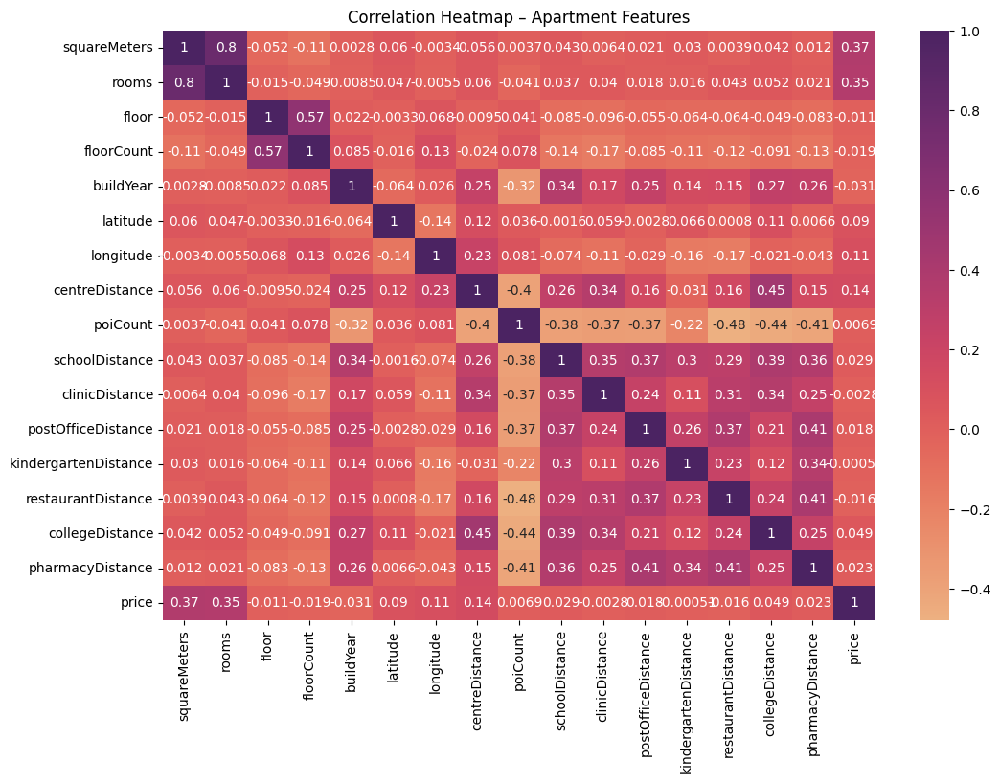

Numeric columns: ['squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount', 'schoolDistance', 'clinicDistance', 'postOfficeDistance', 'kindergartenDistance', 'restaurantDistance', 'collegeDistance', 'pharmacyDistance', 'price']


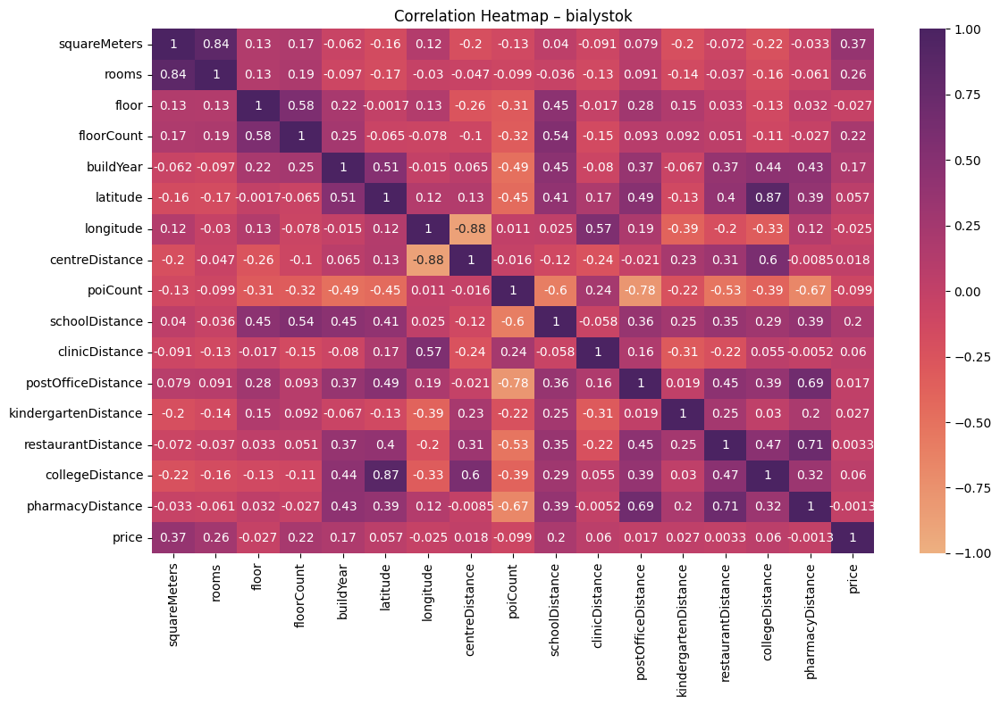

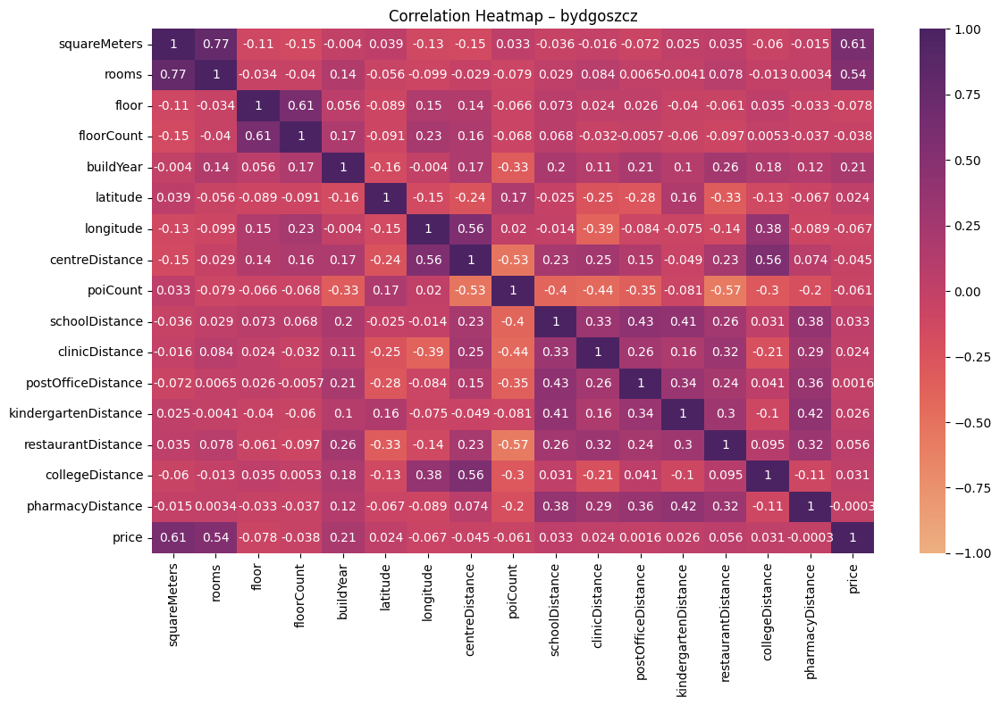

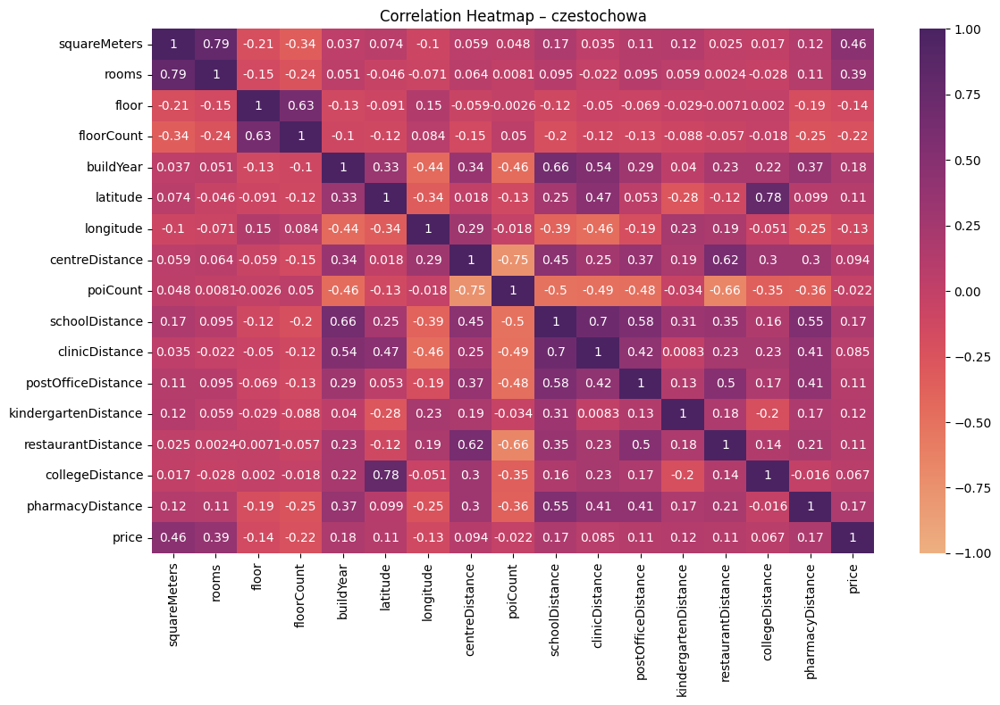

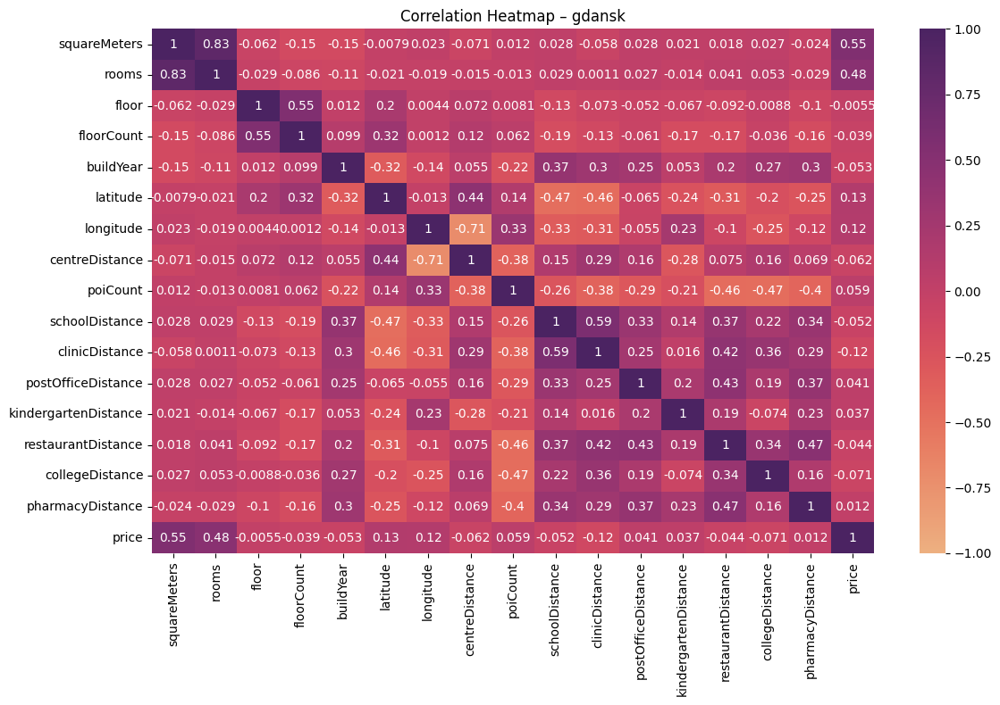

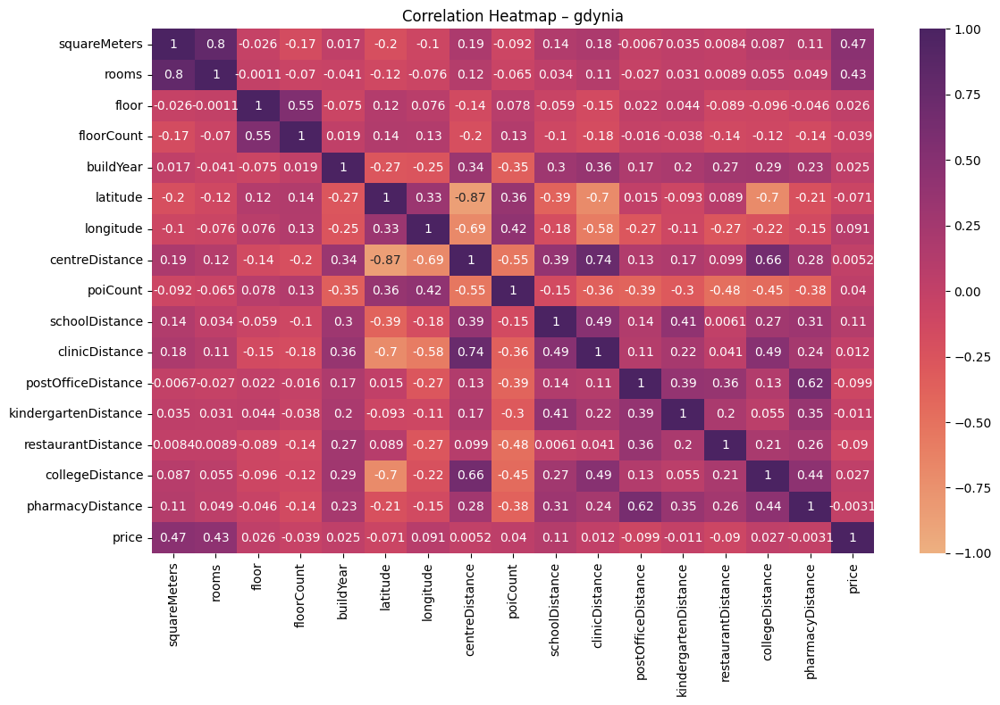

...

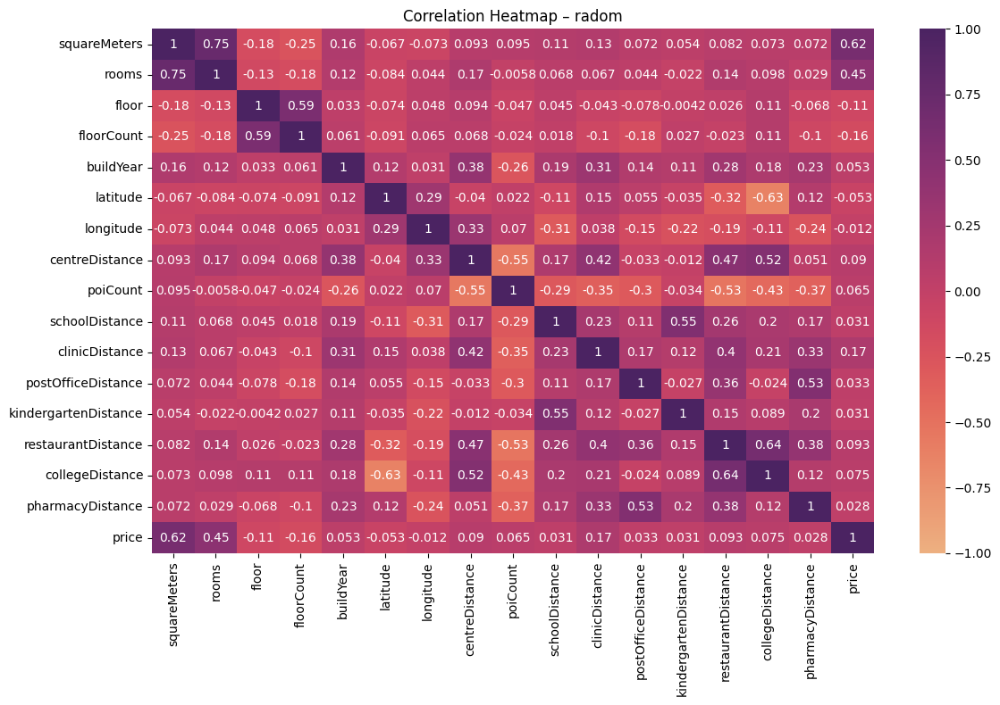

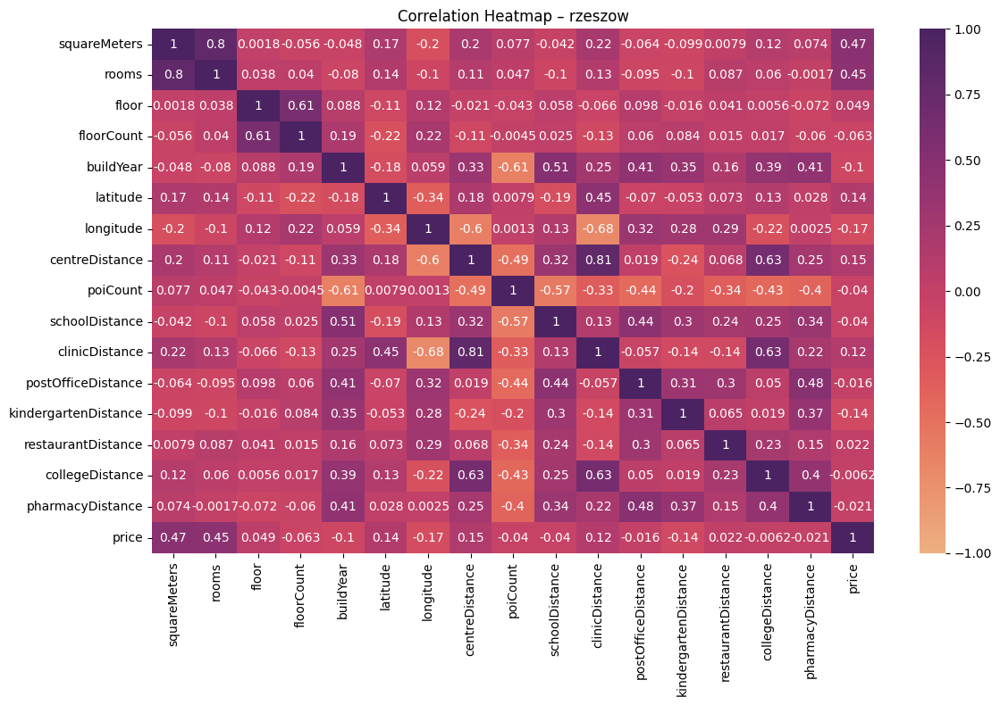

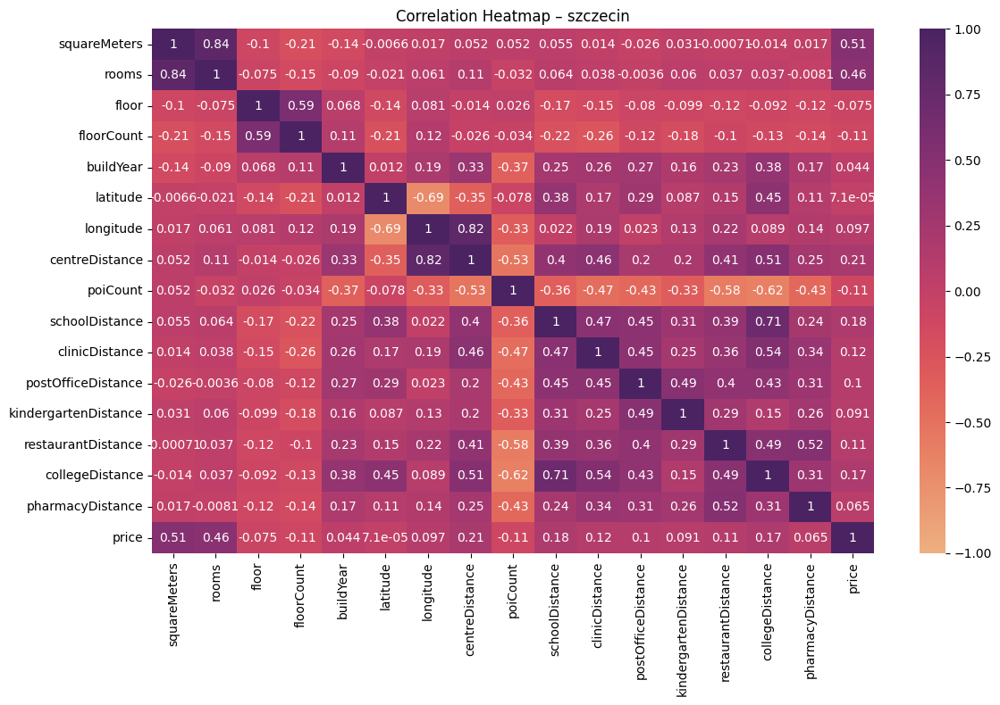

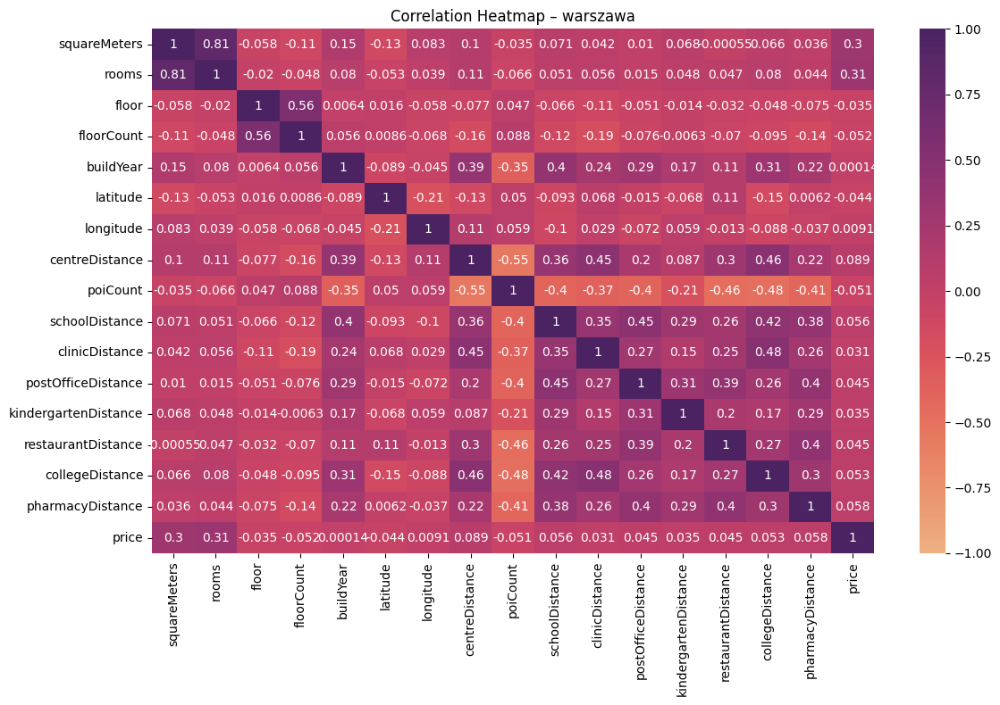

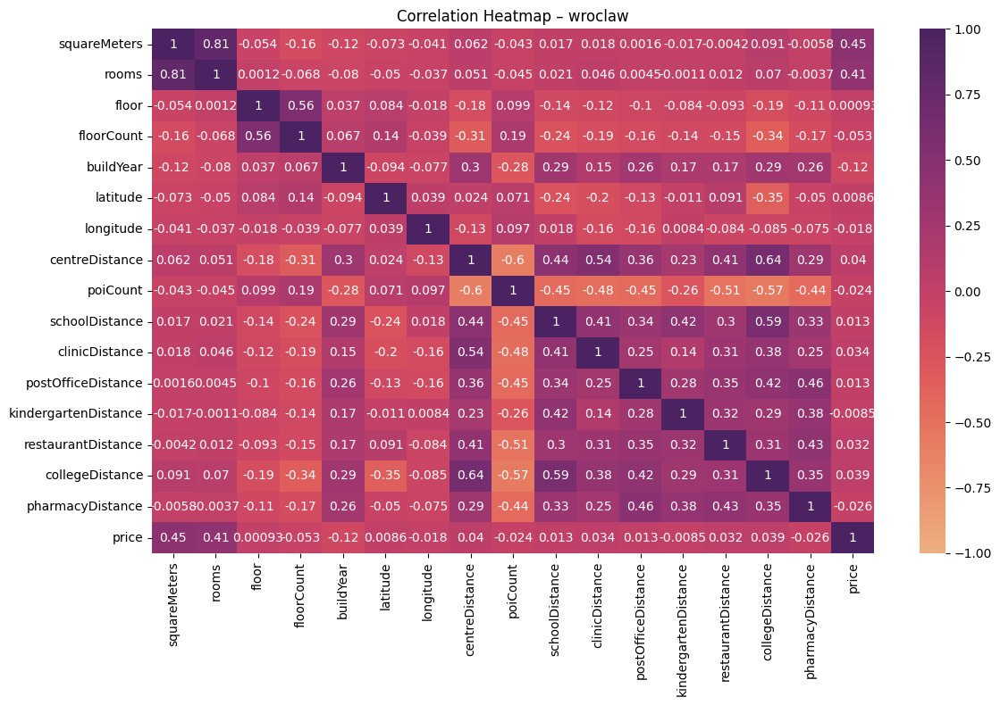

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import glob
import numpy as np
from sklearn.model_selection import train_test_split

# Path to your folder
!ls -a
path = 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/'
path = 'data/'


# Find all CSV files in that folder
csv_files = glob.glob(path + "*.csv")
print("Found files:", csv_files)

# Load all CSVs
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files] # Changed delimiter to ';' to fix parsing

# Combine into one dataframe
data = pd.concat(dfs, ignore_index=True)

print("Combined shape:", data.shape)
print("shape of data with droped null values in buildyear" , data.dropna(axis=0,subset=['buildYear']).shape)
data.head()

# Drop duplicates
data.drop_duplicates(inplace=True)

# Drop completely empty columns
data.dropna(axis=1, how='all', inplace=True)
data.dropna(axis=0,subset=['buildYear'], inplace=True)
# Reset index
data.reset_index(drop=True, inplace=True)

print("Shape after basic cleaning:", data.shape)
data.head()

numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(exclude=[np.number]).columns.tolist()

# Fill numeric missing with median
for col in numeric_cols:
    data[col].fillna(data[col].median(), inplace=True)

# Fill categorical missing with mode
for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

print(data.columns.tolist())

for col in numeric_cols:
    lower = data[col].quantile(0.01)
    upper = data[col].quantile(0.99)
    data = data[(data[col] >= lower) & (data[col] <= upper)]

# Explicit list (ensures correct ordering)
cols = [
    "id","city","type","squareMeters","rooms","floor","floorCount","buildYear",
    "latitude","longitude","centreDistance","poiCount","schoolDistance","clinicDistance",
    "postOfficeDistance","kindergartenDistance","restaurantDistance","collegeDistance",
    "pharmacyDistance","ownership","buildingMaterial","condition","hasParkingSpace",
    "hasBalcony","hasElevator","hasSecurity","hasStorageRoom","price"
]

data = data[cols]

# Target
price = data['price']

# Three example numeric features (you can change these)
sq = data['squareMeters']
rm = data['rooms']
dist = data['centreDistance']

# Keep only numeric columns for ML
numeric_cols = data.select_dtypes(include='number').columns.tolist()

X = data[numeric_cols].drop("buildYear", axis=1)
y = data["buildYear"]


X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1
)
corr = data[numeric_cols].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap="flare")
plt.title("Correlation Heatmap – Apartment Features")
plt.show()


# Identify numeric columns
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# Make sure "price" is included (it should be)
print("Numeric columns:", numeric_cols)
target = 'buildYear'
# Loop over cities
cities = sorted(data["city"].unique())

for city in cities:
    subset = data[data["city"] == city]

    # Skip if too few entries
    if subset.shape[0] < 5:
        print(f"Skipping {city}: not enough data ({subset.shape[0]} rows)")
        continue

    corr = subset[numeric_cols].corr()

    plt.figure(figsize=(12, 8))
    sns.heatmap(corr, annot=True, cmap="flare", vmin=-1, vmax=1)
    plt.title(f"Correlation Heatmap – {city}")
    plt.tight_layout()
    plt.show()

## Heatmap of all cities correlation

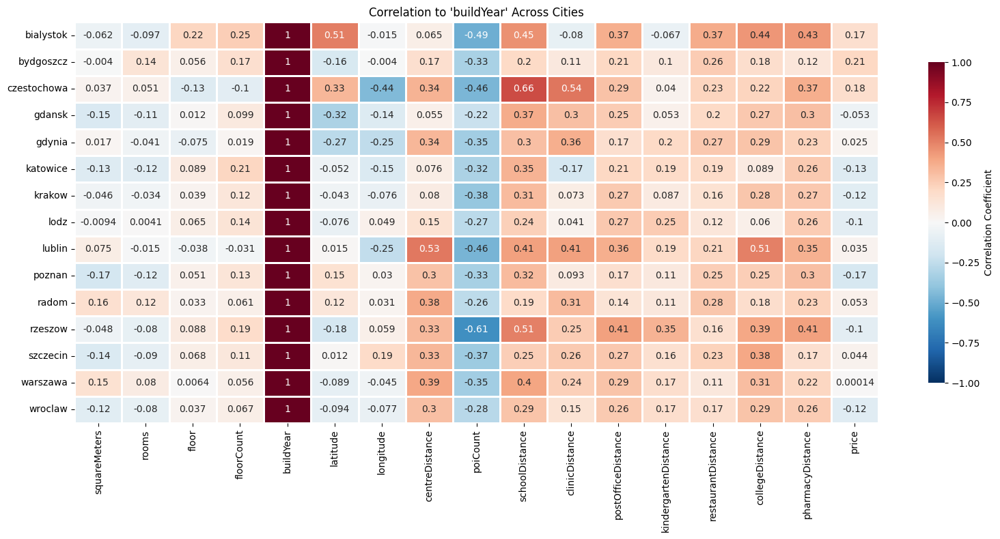

In [ ]:
target = "buildYear"     # Change to your target column
cities = sorted(data["city"].unique())
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# Ensure target is numeric
if target not in numeric_cols:
    raise ValueError(f"Target '{target}' is not numeric.")

results = []

for city in cities:
    subset = data[data["city"] == city]

    # Skip small samples
    if subset.shape[0] < 5:
        print(f"Skipping {city}: not enough data ({subset.shape[0]} rows)")
        continue

    corr = subset[numeric_cols].corr()[target]
    corr.name = city
    results.append(corr)

# Combine into a dataframe
corr_city_matrix = pd.DataFrame(results)

# Plot heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(
    corr_city_matrix,
    annot=True,
    cmap="RdBu_r",
    vmin=-1,
    vmax=1,
    linewidths=0.8,       # Add lines between cells
    linecolor='white',    # White lines between cells
    cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'},
    annot_kws={'size': 10}
    )  # Annotation font size

plt.title(f"Correlation to '{target}' Across Cities")
plt.tight_layout()
plt.show()






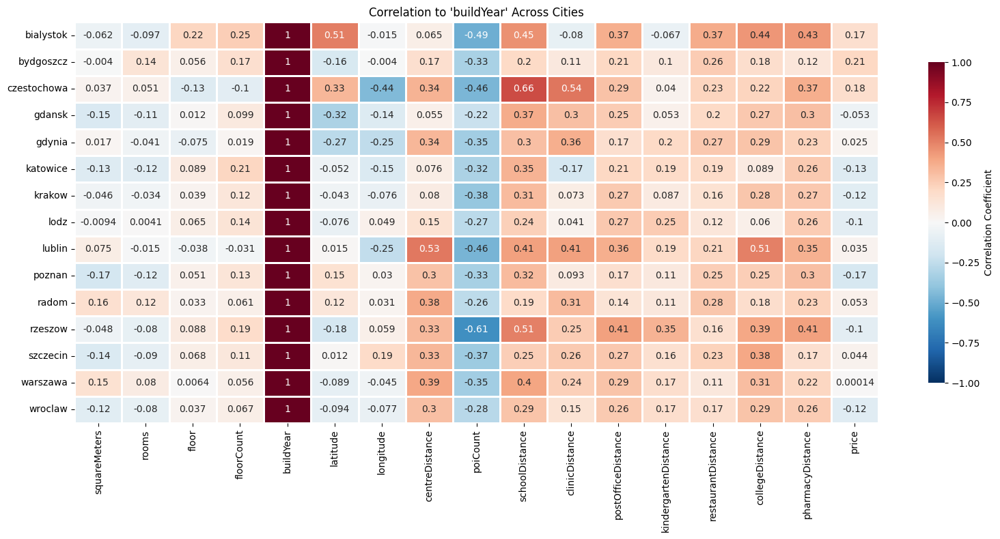


Strongest correlations with buildYear by city:

bialystok:
latitude                0.512637
poiCount                0.490467
schoolDistance          0.453421
collegeDistance         0.441323
pharmacyDistance        0.432668
restaurantDistance      0.368297
postOfficeDistance      0.367110
floorCount              0.248984
floor                   0.218241
price                   0.169793
rooms                   0.096575
clinicDistance          0.079718
kindergartenDistance    0.066601
centreDistance          0.065338
squareMeters            0.062407
Name: bialystok, dtype: float64

bydgoszcz:
poiCount                0.325561
restaurantDistance      0.255713
postOfficeDistance      0.207357
price                   0.206671
schoolDistance          0.196949
collegeDistance         0.176474
centreDistance          0.167934
floorCount              0.165053
latitude                0.161305
rooms                   0.135995
pharmacyDistance        0.123190
clinicDistance          0.107755
kinde

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

target = "buildYear"     # Your target column
cities = sorted(data["city"].unique())
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# Ensure target is numeric
if target not in numeric_cols:
    raise ValueError(f"Target '{target}' is not numeric.")

results = []

for city in cities:
    subset = data[data["city"] == city]

    # Skip small samples
    if subset.shape[0] < 5:
        print(f"Skipping {city}: not enough data ({subset.shape[0]} rows)")
        continue

    corr = subset[numeric_cols].corr()[target]
    corr.name = city
    results.append(corr)

# Combine into a dataframe
corr_city_matrix = pd.DataFrame(results)

# Plot heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(
    corr_city_matrix,
    annot=True,
    cmap="RdBu_r",
    vmin=-1,
    vmax=1,
    linewidths=0.8,
    linecolor='white',
    cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'},
    annot_kws={'size': 10}
)
plt.title(f"Correlation to '{target}' Across Cities")
plt.tight_layout()
plt.show()

# --- Print strongest correlations for each city ---
print("\nStrongest correlations with buildYear by city:\n")
for city in corr_city_matrix.index:
    city_corrs = corr_city_matrix.loc[city].drop(target)  # remove target correlation
    city_corrs = city_corrs.abs().sort_values(ascending=False)  # sort by absolute value
    print(f"{city}:")
    print(city_corrs.head(15))  # top 5 correlations
    print()

## PCA for each city


========== PCA for bialystok ==========
Explained variance ratio for bialystok: [0.31383307 0.19254034]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


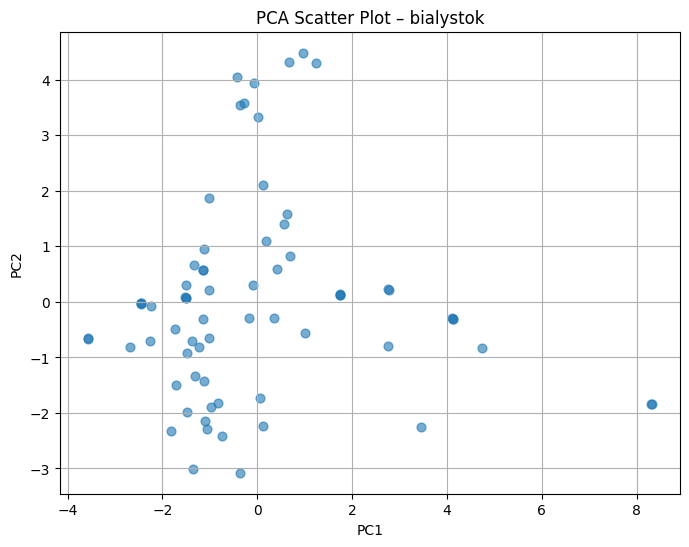

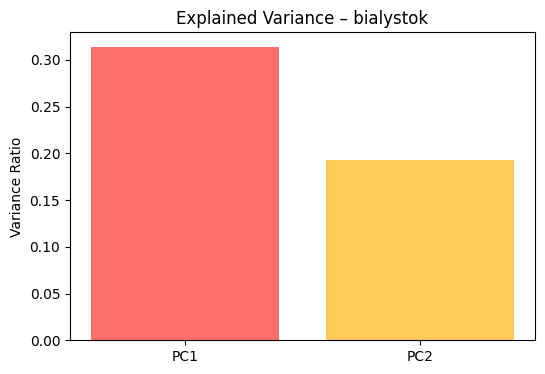


========== PCA for bydgoszcz ==========
Explained variance ratio for bydgoszcz: [0.19543602 0.1505489 ]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


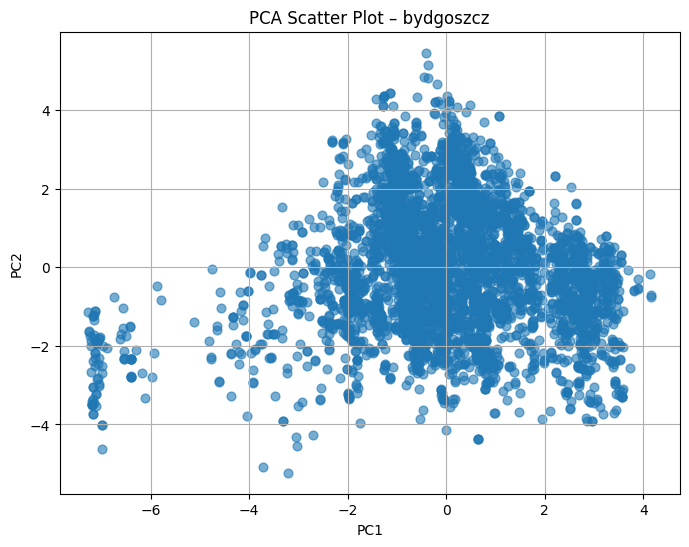

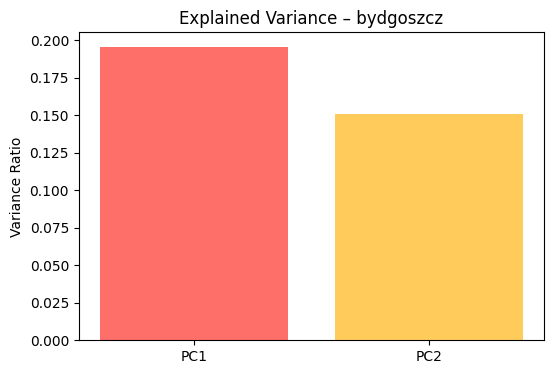


========== PCA for czestochowa ==========
Explained variance ratio for czestochowa: [0.22566061 0.18331605]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


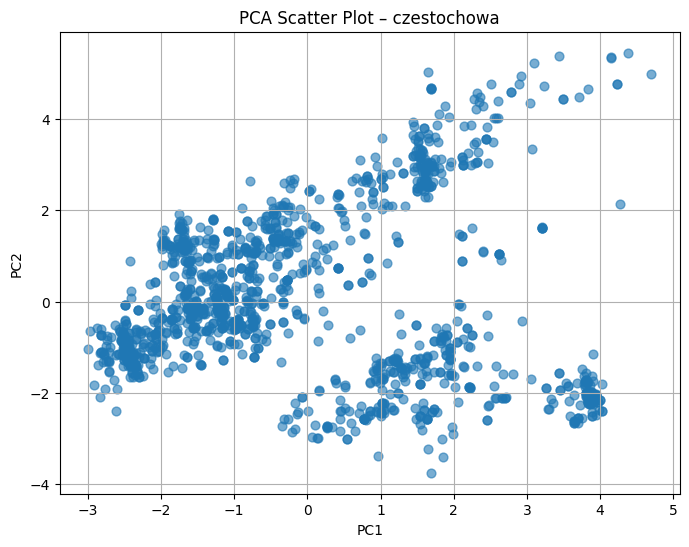

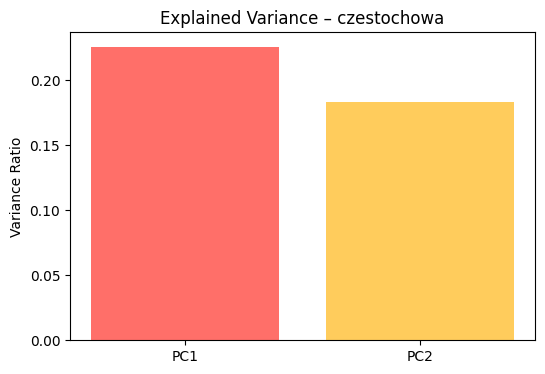


========== PCA for gdansk ==========
Explained variance ratio for gdansk: [0.22568626 0.143093  ]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


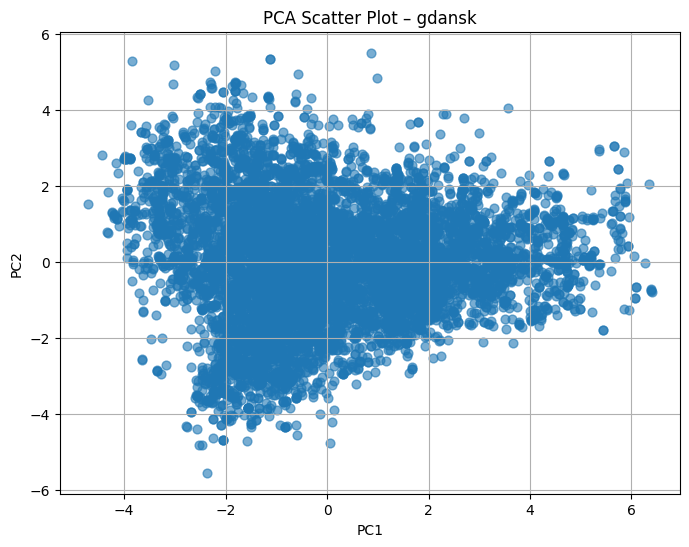

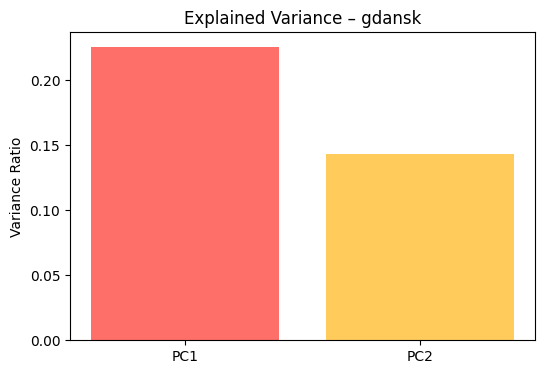


========== PCA for gdynia ==========
Explained variance ratio for gdynia: [0.27993297 0.13213692]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


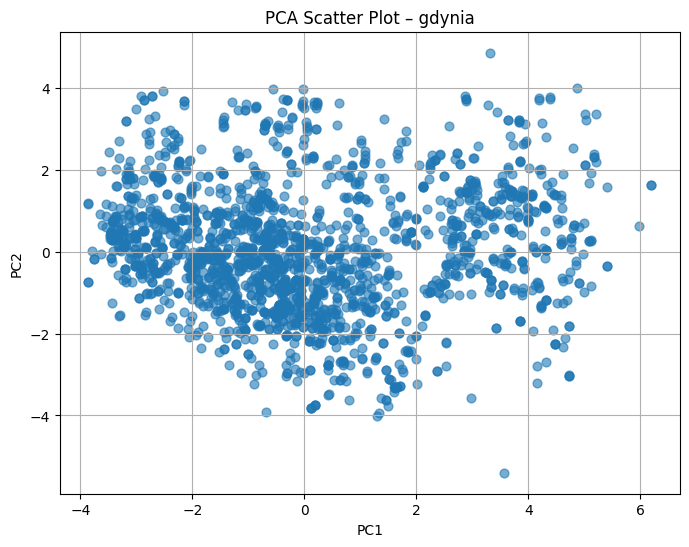

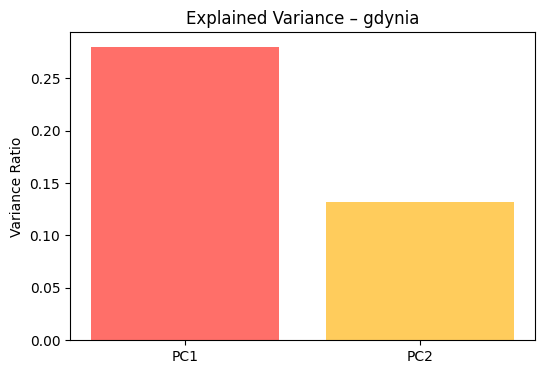


========== PCA for katowice ==========
Explained variance ratio for katowice: [0.26080458 0.13600236]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


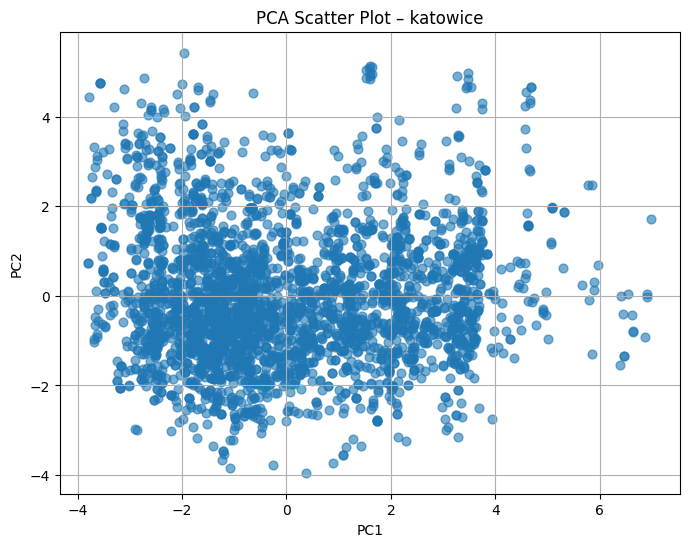

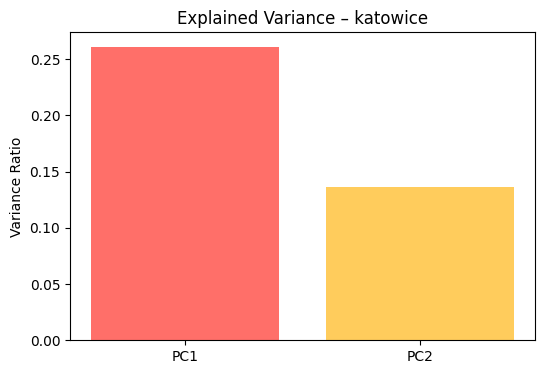


========== PCA for krakow ==========
Explained variance ratio for krakow: [0.20605586 0.12992775]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


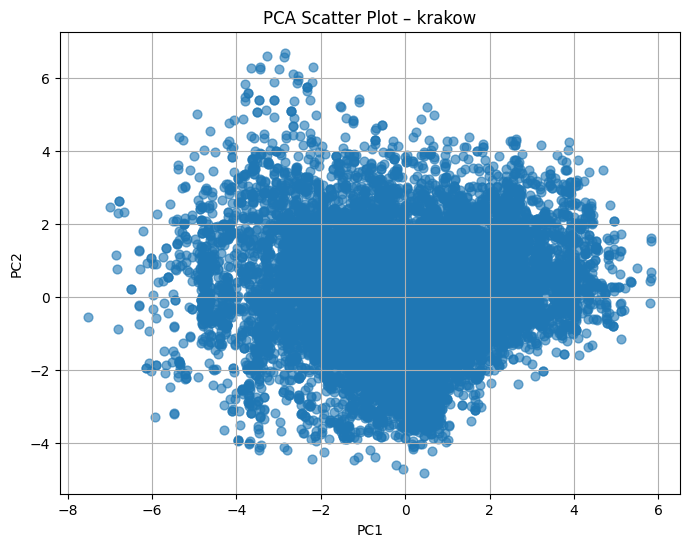

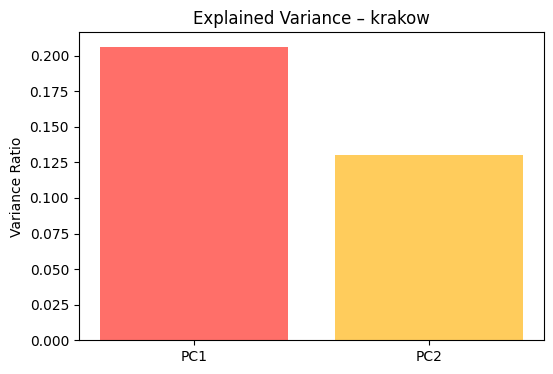


========== PCA for lodz ==========
Explained variance ratio for lodz: [0.20440808 0.1336405 ]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


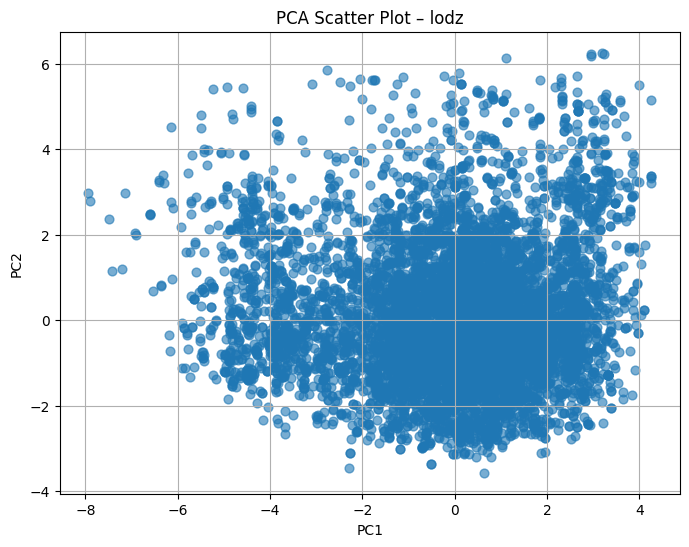

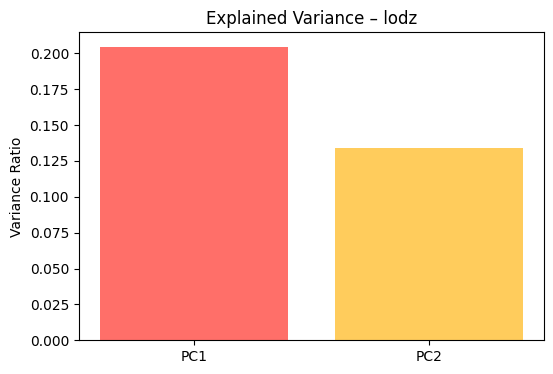


========== PCA for lublin ==========
Explained variance ratio for lublin: [0.26197752 0.13181187]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


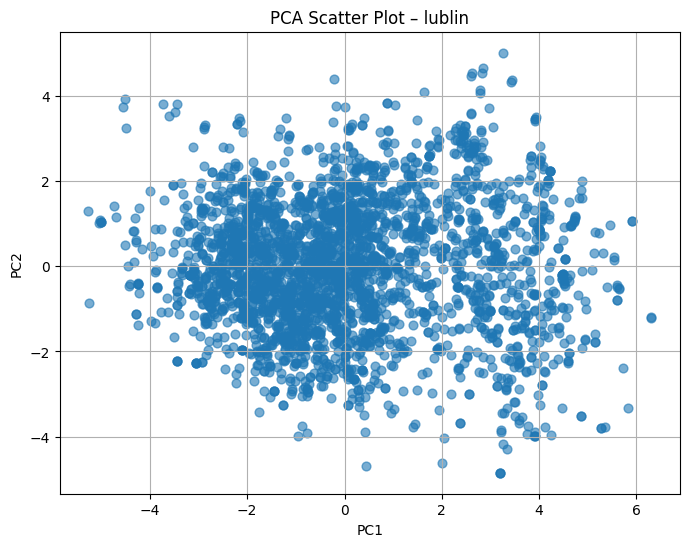

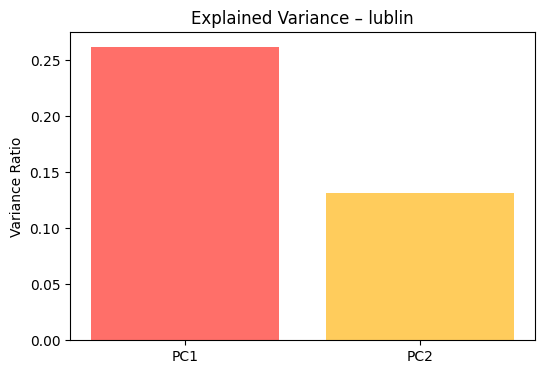


========== PCA for poznan ==========
Explained variance ratio for poznan: [0.2131232  0.13554937]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


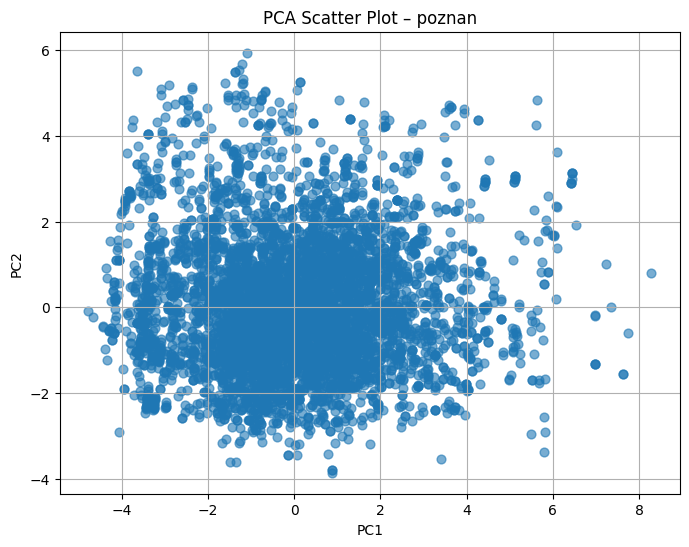

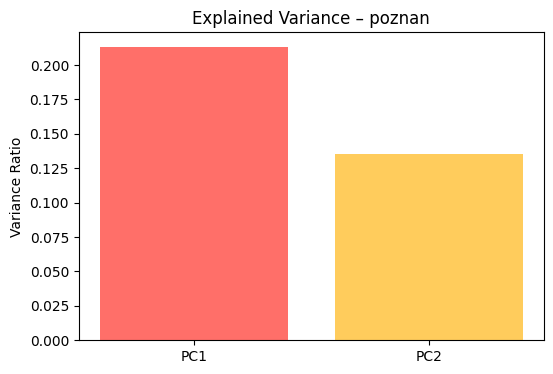


========== PCA for radom ==========
Explained variance ratio for radom: [0.2083414  0.13249294]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


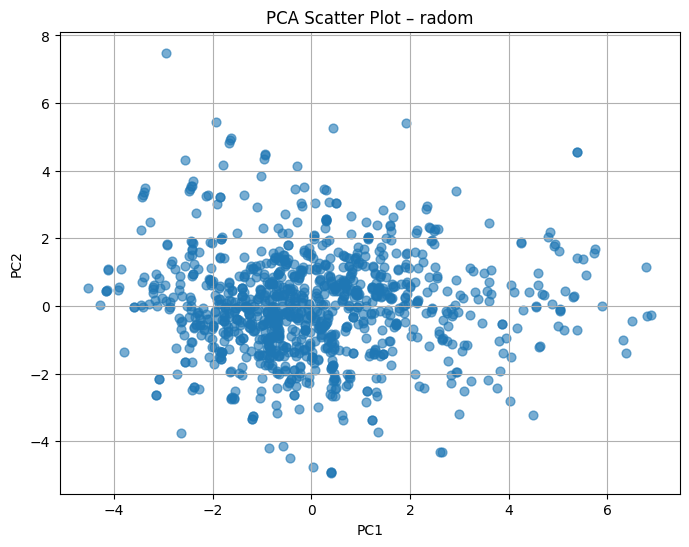

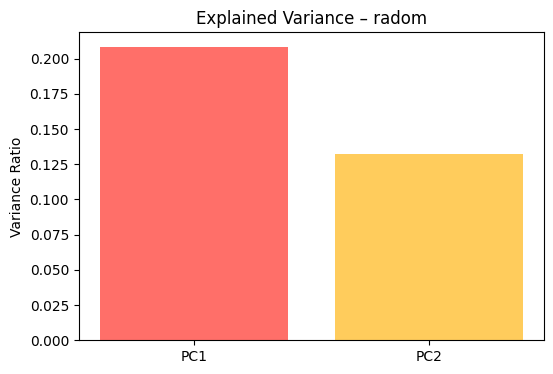


========== PCA for rzeszow ==========
Explained variance ratio for rzeszow: [0.2171689  0.17958717]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


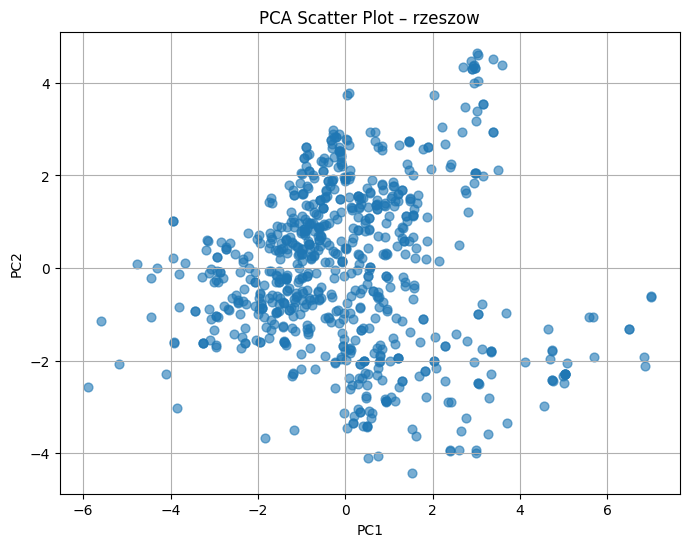

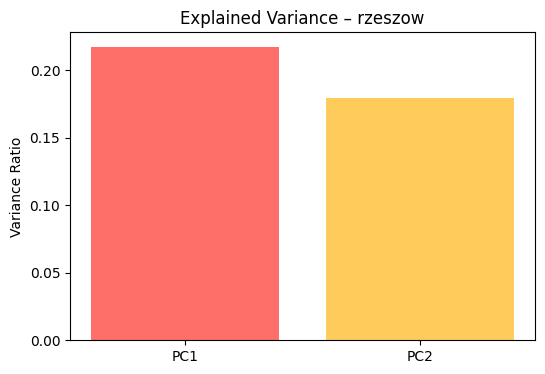


========== PCA for szczecin ==========
Explained variance ratio for szczecin: [0.27802166 0.14158251]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


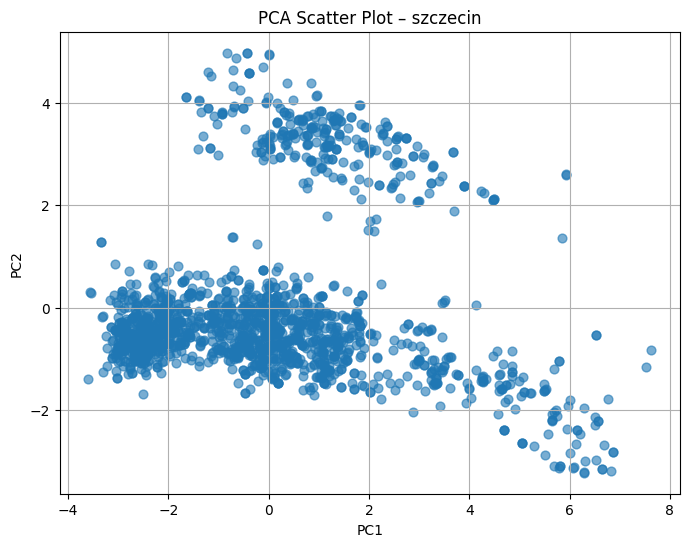

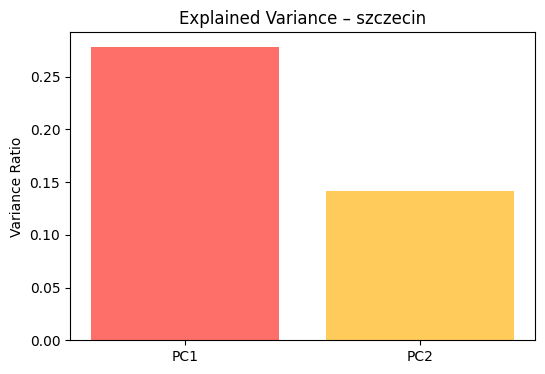


========== PCA for warszawa ==========
Explained variance ratio for warszawa: [0.23593462 0.11633869]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


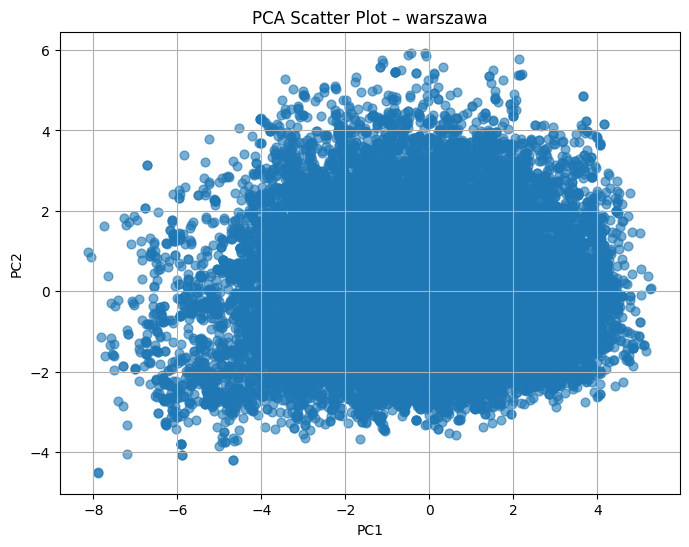

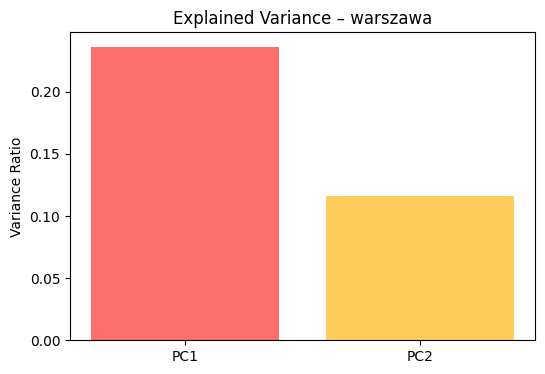


========== PCA for wroclaw ==========
Explained variance ratio for wroclaw: [0.26402091 0.12918014]


/tmp/ipython-input-4009875408.py:44: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")


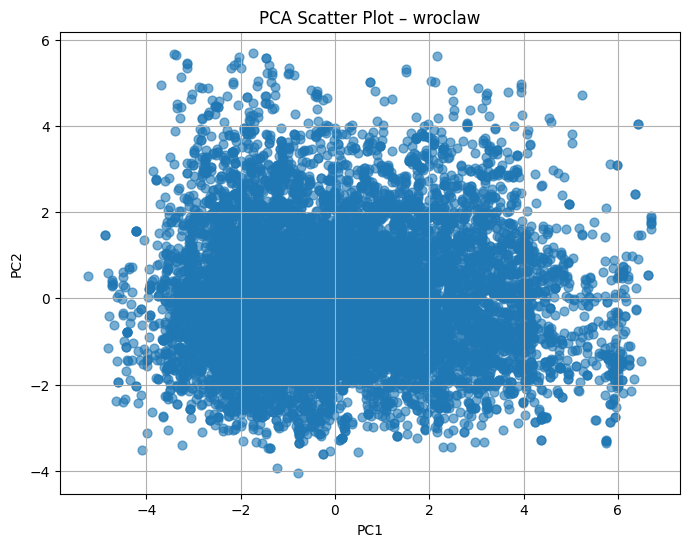

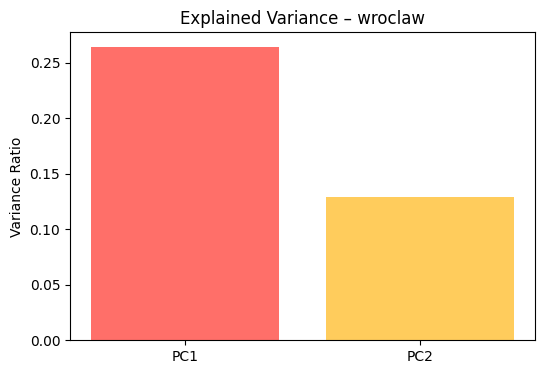

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Numeric columns
numeric_cols = data.select_dtypes(include='number').columns.tolist()

# OPTIONAL: drop the target or very skewed columns if needed
# numeric_cols.remove("price")  # ← uncomment if PCA is dominated by price
# numeric_cols.remove("buildyear")

cities = sorted(data["city"].unique())

for city in cities:
    subset = data[data["city"] == city]

    if subset.shape[0] < 5:
        print(f"Skipping PCA for {city}: not enough data ({subset.shape[0]})")
        continue

    print(f"\n========== PCA for {city} ==========")

    # Extract numeric features for PCA
    X = subset[numeric_cols].values

    # Handle potential constant columns
    if np.std(X, axis=0).min() == 0:
        print(f"Skipping PCA for {city}: constant-value columns detected")
        continue

    # Standardize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Run PCA (keep first 2 components for plotting)
    pca = PCA(n_components=2)
    pcs = pca.fit_transform(X_scaled)

    # Explained variance
    print(f"Explained variance ratio for {city}: {pca.explained_variance_ratio_}")

    # Plot PCA scatter
    plt.figure(figsize=(8, 6))
    plt.scatter(pcs[:, 0], pcs[:, 1], alpha=0.6, s=40, cmap="flare")
    plt.title(f"PCA Scatter Plot – {city}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.grid(True)
    plt.show()

    # Plot explained variance bar chart
    plt.figure(figsize=(6, 4))
    plt.bar(["PC1", "PC2"], pca.explained_variance_ratio_, color=["#ff6f69", "#ffcc5c"])
    plt.title(f"Explained Variance – {city}")
    plt.ylabel("Variance Ratio")
    plt.show()


In [ ]:
# Path to your folder
path = 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/'

# Find all CSV files in that folder
csv_files = glob.glob(path + "*.csv")
print("Found files:", csv_files)

# Load all CSVs
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files] # Changed delimiter to ';' to fix parsing

# Combine into one dataframe
data = pd.concat(dfs, ignore_index=True)

print( data['city'].unique())
data = data[ data['city'] == 'krakow']
#data = data[data['city'].isin(['krakow', 'warszawa', 'wroclaw', 'gdansk'])]
from sklearn.cluster import KMeans

# Select only geo columns
X_geo = data[["latitude", "longitude"]]

# Choose number of geo regions (you can tune this)
n_clusters = 8

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
data["geo_cluster"] = kmeans.fit_predict(X_geo)

data.head()
print("Combined shape:", data.shape)
data.head()
print(data.columns.tolist())

#Check rows with empty columns in keep columns

keep_cols = [
    "buildYear",
    "collegeDistance",
    "squareMeters",
    "restaurantDistance",
    "centreDistance",
    "kindergartenDistance",
    "schoolDistance",
    "clinicDistance",
    "pharmacyDistance",
    "postOfficeDistance",
    "city",
    "poiCount"

]

missing_rows_count = data[keep_cols].isna().any(axis=1).sum()
print("Rows with missing values in keep_cols:", missing_rows_count)
data[keep_cols].isna().sum()

import numpy as np

# ----------------------------
# 1. Współrzędne centrum Krakowa
# ----------------------------
krakow_center = (50.0614, 19.9372)   # Rynek Główny

# ----------------------------
# 2. Funkcja Haversine
# ----------------------------
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # promień Ziemi w km

    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = (
        np.sin(dlat / 2)**2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    )
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# ----------------------------
# 3. Obliczenie odległości
# ----------------------------
data["dist_to_center"] = data.apply(
    lambda row: haversine(
        row["latitude"],
        row["longitude"],
        krakow_center[0],
        krakow_center[1]
    ),
    axis=1
)

# Podgląd
print(data[["latitude", "longitude", "dist_to_center"]].head())




# Drop duplicates
data.drop_duplicates(inplace=True)

# Drop completely empty columns
data.dropna(axis=1, how='all', inplace=True)

# Reset index
data.reset_index(drop=True, inplace=True)

print("Shape after basic cleaning:", data.shape)
data.head()

numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(exclude=[np.number]).columns.tolist()

# Total number of rows
total_rows = len(data)

# Rows where buildYear is present (not NaN)
rows_with_buildyear = data['buildYear'].notna().sum()

print("Total rows:", total_rows)
print("Rows with buildYear:", rows_with_buildyear)

data = data.dropna(subset=['buildYear',"collegeDistance","restaurantDistance","clinicDistance","pharmacyDistance"])
print("Shape after dropping rows with missing buildYear:", data.shape)
print(data.columns.tolist())

# Removing outliers
for col in numeric_cols:
    lower = data[col].quantile(0.01)
    upper = data[col].quantile(0.99)
    data = data[(data[col] >= lower) & (data[col] <= upper)]

# Dropping rows with low correlation
keep_cols = [
    "buildYear",
    "collegeDistance",
    "squareMeters",
    "restaurantDistance",
    "centreDistance",
    "kindergartenDistance",
    "schoolDistance",
    "clinicDistance",
    "pharmacyDistance",
    "postOfficeDistance",
    "city",
    "poiCount",
    "geo_cluster",
    "dist_to_center"
]

data = data[keep_cols]

# Hot encoding the data
print(data.shape)
bins = np.arange(min(data), max(data) + 2)  # +2 ensures last value included

plt.hist(data['buildYear'], bins=bins, edgecolor='black')
plt.xticks([])   # removes x-axis tick labels
plt.xlabel("Build Year")
plt.ylabel("Count")
plt.show()

data = pd.get_dummies(data, columns=['city'], prefix='city',drop_first=True)
#data = pd.get_dummies(data, columns =['geo_cluster'] , drop_first=True)
print(data.filter(like="city_").columns)
print(data.shape)



#city_cols = list(data.filter(like="city_").columns)

#data = data[keep_cols[:-1] + city_cols]

# Keep only numeric columns for ML
numeric_cols = data.select_dtypes(include='number').columns.tolist()

minmax_scaler=MinMaxScaler().set_output(transform='pandas')
#data_normalized=minmax_scaler.fit_transform(data[numeric_cols])


#X = data_normalized.drop("buildYear", axis=1)
#y = data_normalized["buildYear"]
X = data[numeric_cols].drop('buildYear' , axis = 1 )
y = data['buildYear']

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1
)

X_train = minmax_scaler.fit_transform(X_train)
X_val = minmax_scaler.transform(X_val)
X_test = minmax_scaler.transform(X_test)


Found files: ['drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_10.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_09.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_08.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_12.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_05.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_01.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_04.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2023_11.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_03.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_pl_2024_02.csv', 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/apartments_rent_pl_2024_03.csv', 'drive/MyDrive/DatasetsForPythonInM

TypeError: can only concatenate str (not "int") to str

KeyError: 'city_warszawa'

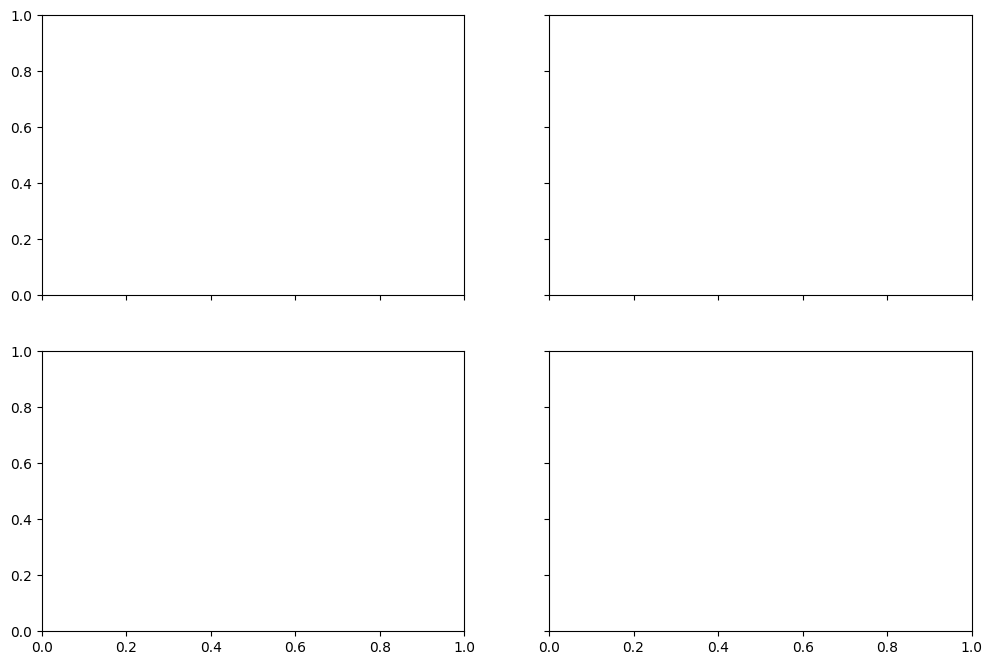

In [ ]:
cities = {
    "Warsaw": "city_warszawa",
    "Krakow": "city_krakow",
    "Gdansk": "city_gdansk",
    "Wroclaw": "city_wroclaw"
}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (city_name, city_col) in zip(axes, cities.items()):
    city_data = data.loc[data[city_col] == 1, "buildYear"]

    bins = np.arange(city_data.min(), city_data.max() + 2)

    ax.hist(city_data, bins=bins, edgecolor="black")
    ax.set_title(city_name)
    ax.set_xlabel("Build Year")
    ax.set_ylabel("Count")

plt.tight_layout()
plt.show()


#Project Work

##imports

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import glob
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor


##Data cleaning

In [ ]:
!ls -a

.  ..  .config	data  .ipynb_checkpoints  sample_data


In [ ]:
# Path to your folder
#path = 'drive/MyDrive/DatasetsForPythonInMachineLearning/project/'
path = 'data/'

# Find all CSV files in that folder
csv_files = glob.glob(path + "*.csv")
print("Found files:", csv_files)

# Load all CSVs
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files] # Changed delimiter to ';' to fix parsing

# Combine into one dataframe
data = pd.concat(dfs, ignore_index=True)

print( data['city'].unique())
data = data[ data['city'] == 'krakow']
#data = data[data['city'].isin(['krakow', 'warszawa', 'wroclaw', 'gdansk'])]
from sklearn.cluster import KMeans

# Select only geo columns
X_geo = data[["latitude", "longitude"]]

# Choose number of geo regions (you can tune this)
n_clusters = 8

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
data["geo_cluster"] = kmeans.fit_predict(X_geo)

data.head()
print("Combined shape:", data.shape)
data.head()
print(data.columns.tolist())


Found files: ['data/apartments_rent_pl_2024_01.csv', 'data/apartments_rent_pl_2024_04.csv', 'data/apartments_rent_pl_2023_11.csv', 'data/apartments_pl_2023_10.csv', 'data/apartments_rent_pl_2024_03.csv', 'data/apartments_pl_2023_09.csv', 'data/apartments_pl_2023_11.csv', 'data/apartments_pl_2023_12.csv', 'data/apartments_rent_pl_2023_12.csv', 'data/apartments_pl_2023_08.csv', 'data/apartments_pl_2024_04.csv', 'data/apartments_rent_pl_2024_02.csv', 'data/apartments_pl_2024_03.csv', 'data/apartments_rent_pl_2024_05.csv', 'data/apartments_pl_2024_01.csv', 'data/apartments_rent_pl_2024_06.csv', 'data/apartments_pl_2024_05.csv', 'data/apartments_pl_2024_02.csv', 'data/apartments_pl_2024_06.csv']
['szczecin' 'gdynia' 'krakow' 'poznan' 'bialystok' 'gdansk' 'wroclaw'
 'radom' 'rzeszow' 'lodz' 'katowice' 'lublin' 'czestochowa' 'warszawa'
 'bydgoszcz']
Combined shape: (41687, 29)
['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear', 'latitude', 'longitude', 'centreD

In [ ]:
#Check rows with empty columns in keep columns

keep_cols = [
    "buildYear",
    "collegeDistance",
    "squareMeters",
    "restaurantDistance",
    "centreDistance",
    "kindergartenDistance",
    "schoolDistance",
    "clinicDistance",
    "pharmacyDistance",
    "postOfficeDistance",
    "city",
    "poiCount"

]

missing_rows_count = data[keep_cols].isna().any(axis=1).sum()
print("Rows with missing values in keep_cols:", missing_rows_count)
data[keep_cols].isna().sum()


Rows with missing values in keep_cols: 6945


,0
buildYear,6667
collegeDistance,223
squareMeters,0
restaurantDistance,79
centreDistance,0
kindergartenDistance,1
schoolDistance,0
clinicDistance,51
pharmacyDistance,21
postOfficeDistance,7


In [ ]:
import numpy as np

# ----------------------------
# 1. Współrzędne centrum Krakowa
# ----------------------------
krakow_center = (50.0614, 19.9372)   # Rynek Główny

# ----------------------------
# 2. Funkcja Haversine
# ----------------------------
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # promień Ziemi w km

    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = (
        np.sin(dlat / 2)**2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    )
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

# ----------------------------
# 3. Obliczenie odległości
# ----------------------------
data["dist_to_center"] = data.apply(
    lambda row: haversine(
        row["latitude"],
        row["longitude"],
        krakow_center[0],
        krakow_center[1]
    ),
    axis=1
)

# Podgląd
print(data[["latitude", "longitude", "dist_to_center"]].head())

       latitude  longitude  dist_to_center
1212  50.043603  20.000221        4.915423
1213  50.069995  20.038846        7.317866
1214  50.071501  19.911874        2.128177
1215  50.057113  19.976898        2.873680
1216  50.097901  19.964861        4.513181


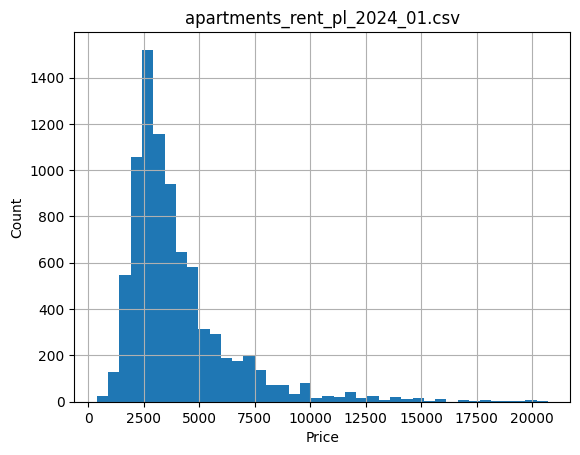

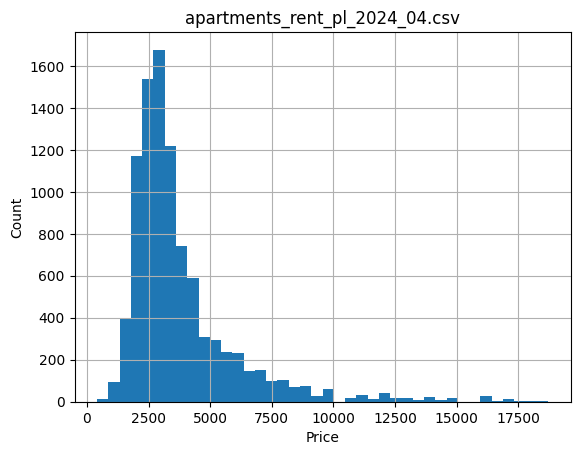

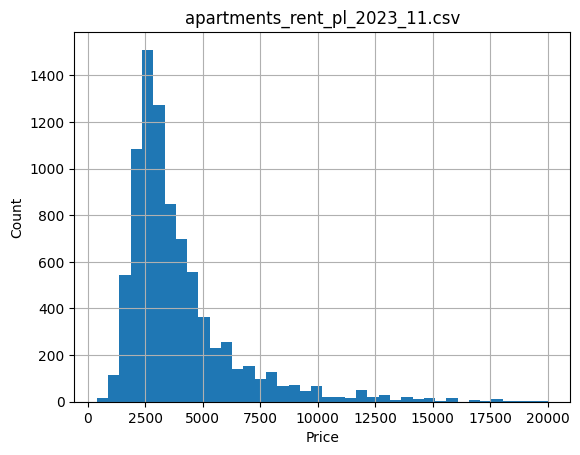

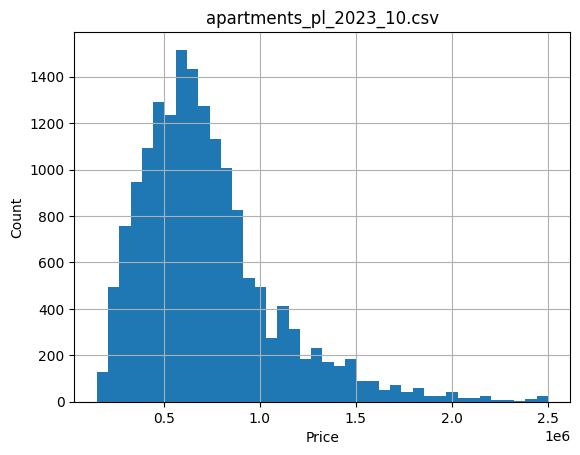

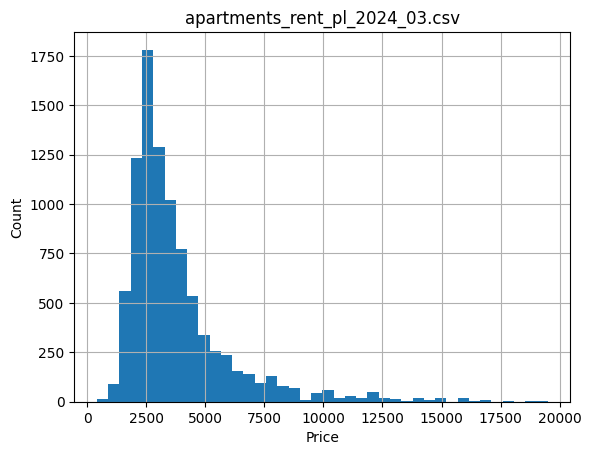

...

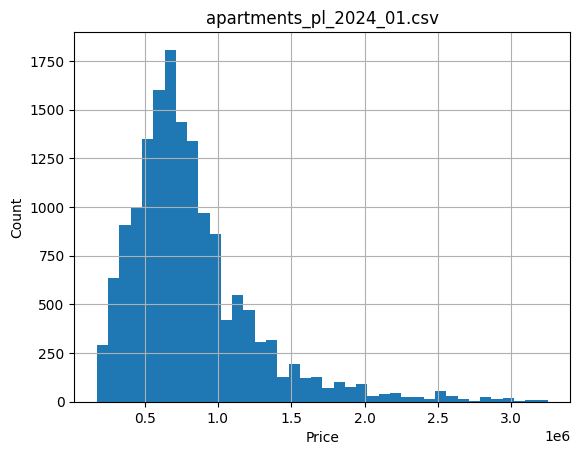

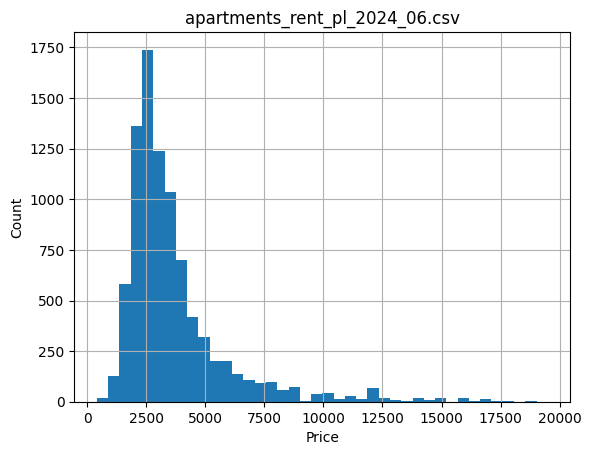

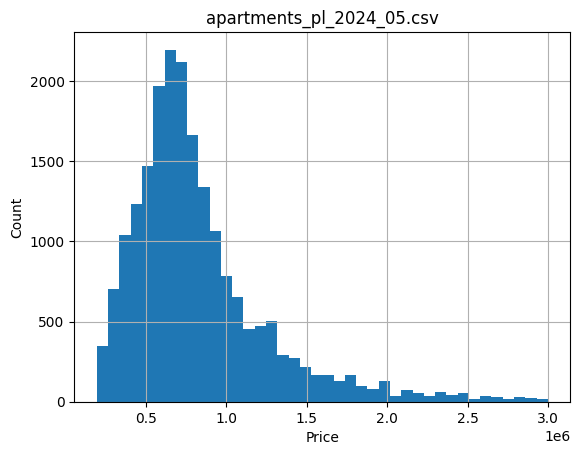

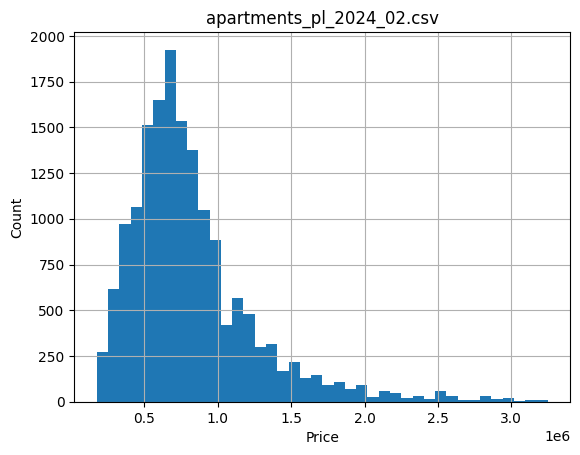

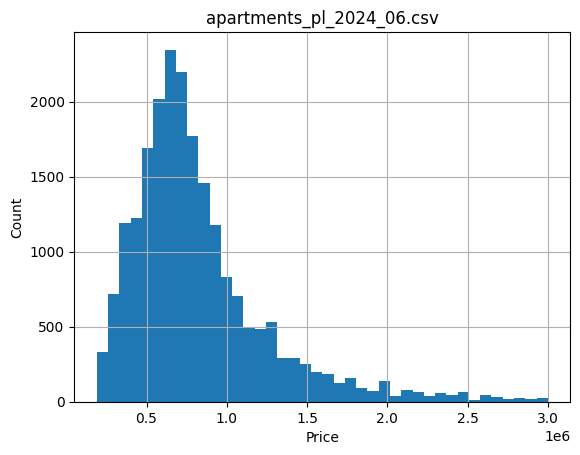

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
import os

path = "data/"
csv_files = glob.glob(path + "*.csv")

for file in csv_files:
    df = pd.read_csv(file)

    if "price" not in df.columns:
        print(f"Column 'price' not found in: {file}")
        continue

    plt.figure()
    df["price"].hist(bins=40)
    plt.title(os.path.basename(file))  # file name as title
    plt.xlabel("Price")
    plt.ylabel("Count")
    plt.show()



===== RENT FILES CORRELATION =====
                      squareMeters     rooms     floor  floorCount  buildYear  \
squareMeters              1.000000  0.862882  0.021702   -0.027719  -0.070314   
rooms                     0.862882  1.000000  0.021658   -0.014004  -0.046313   
floor                     0.021702  0.021658  1.000000    0.677859   0.081301   
floorCount               -0.027719 -0.014004  0.677859    1.000000   0.131940   
buildYear                -0.070314 -0.046313  0.081301    0.131940   1.000000   
latitude                  0.054104  0.030139  0.046933    0.046021  -0.048591   
longitude                 0.160036  0.130214  0.085764    0.125203  -0.063374   
centreDistance            0.043105  0.050909 -0.050345   -0.074298   0.224964   
poiCount                  0.074447  0.035347  0.032103    0.043575  -0.365290   
schoolDistance           -0.013708  0.014287 -0.096155   -0.128920   0.220697   
clinicDistance           -0.056249 -0.015573 -0.126317   -0.181543   0.15

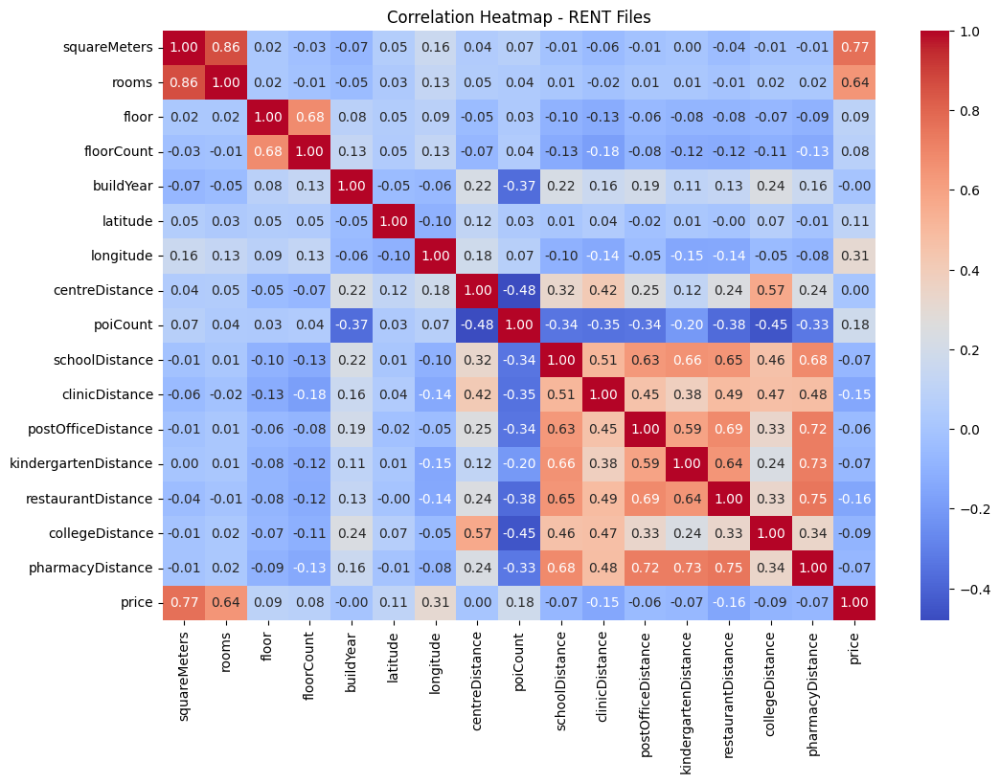


===== NON-RENT FILES CORRELATION =====
                      squareMeters     rooms     floor  floorCount  buildYear  \
squareMeters              1.000000  0.827096 -0.072575   -0.134441  -0.017800   
rooms                     0.827096  1.000000 -0.035056   -0.078811   0.003965   
floor                    -0.072575 -0.035056  1.000000    0.666062   0.065751   
floorCount               -0.134441 -0.078811  0.666062    1.000000   0.128115   
buildYear                -0.017800  0.003965  0.065751    0.128115   1.000000   
latitude                  0.044067  0.040611 -0.004750   -0.006679  -0.007009   
longitude                -0.025690 -0.009199  0.075526    0.112369   0.090909   
centreDistance            0.044199  0.050968 -0.026470   -0.040334   0.364147   
poiCount                  0.038886  0.003615  0.030909    0.037961  -0.379949   
schoolDistance            0.068984  0.068656 -0.103134   -0.140804   0.260847   
clinicDistance            0.015065  0.039753 -0.122745   -0.178286   

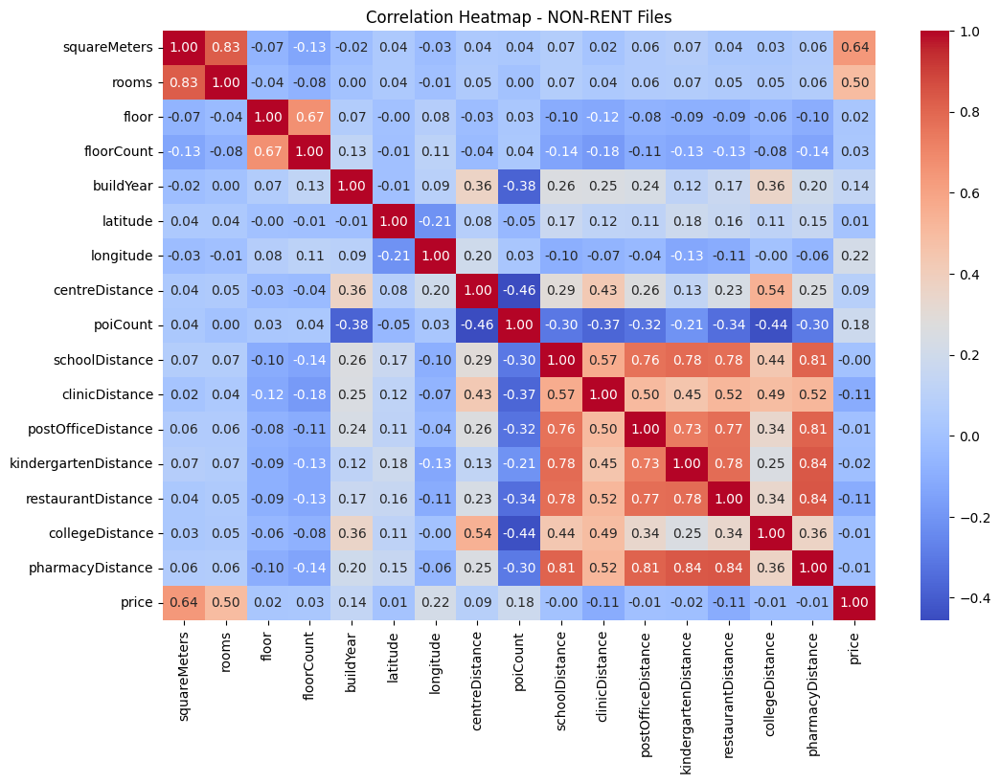

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

path = "data/"
csv_files = glob.glob(path + "*.csv")

rent_dfs = []
non_rent_dfs = []

for file in csv_files:
    try:
        df = pd.read_csv(file)
    except:
        print(f"Error reading: {file}")
        continue

    # Check for needed columns
    if not {"price", "buildYear"}.issubset(df.columns):
        print(f"Missing required columns in: {file}")
        continue

    # Split files
    if "rent" in os.path.basename(file).lower():
        rent_dfs.append(df)
    else:
        non_rent_dfs.append(df)

# -----------------------------
#  RENT GROUP
# -----------------------------
if rent_dfs:
    rent_df = pd.concat(rent_dfs, ignore_index=True)

    print("\n===== RENT FILES CORRELATION =====")
    rent_corr = rent_df.corr(numeric_only=True)
    print(rent_corr)

    plt.figure(figsize=(12,8))
    sns.heatmap(rent_corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation Heatmap - RENT Files")
    plt.show()
else:
    print("\nNo RENT files found.")

# -----------------------------
# NON-RENT GROUP
# -----------------------------
if non_rent_dfs:
    non_rent_df = pd.concat(non_rent_dfs, ignore_index=True)

    print("\n===== NON-RENT FILES CORRELATION =====")
    non_rent_corr = non_rent_df.corr(numeric_only=True)
    print(non_rent_corr)

    plt.figure(figsize=(12,8))
    sns.heatmap(non_rent_corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation Heatmap - NON-RENT Files")
    plt.show()
else:
    print("\nNo NON-RENT files found.")

Shape after basic cleaning: (25494, 30)
Total rows: 25494
Rows with buildYear: 21322
Shape after dropping rows with missing buildYear: (21165, 30)
['id', 'city', 'type', 'squareMeters', 'rooms', 'floor', 'floorCount', 'buildYear', 'latitude', 'longitude', 'centreDistance', 'poiCount', 'schoolDistance', 'clinicDistance', 'postOfficeDistance', 'kindergartenDistance', 'restaurantDistance', 'collegeDistance', 'pharmacyDistance', 'ownership', 'buildingMaterial', 'condition', 'hasParkingSpace', 'hasBalcony', 'hasElevator', 'hasSecurity', 'hasStorageRoom', 'price', 'geo_cluster', 'dist_to_center']
(12969, 14)
Index([], dtype='object')
(12969, 13)


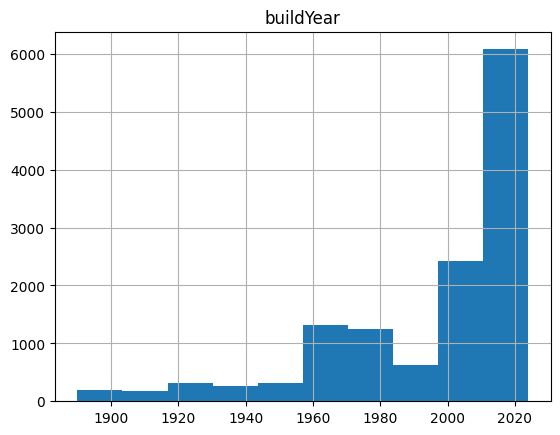

In [ ]:



# Drop duplicates
data.drop_duplicates(inplace=True)

# Drop completely empty columns
data.dropna(axis=1, how='all', inplace=True)

# Reset index
data.reset_index(drop=True, inplace=True)

print("Shape after basic cleaning:", data.shape)
data.head()

numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(exclude=[np.number]).columns.tolist()

# Total number of rows
total_rows = len(data)

# Rows where buildYear is present (not NaN)
rows_with_buildyear = data['buildYear'].notna().sum()

print("Total rows:", total_rows)
print("Rows with buildYear:", rows_with_buildyear)

data = data.dropna(subset=['buildYear',"collegeDistance","restaurantDistance","clinicDistance","pharmacyDistance"])
print("Shape after dropping rows with missing buildYear:", data.shape)
print(data.columns.tolist())

# Removing outliers
for col in numeric_cols:
    lower = data[col].quantile(0.01)
    upper = data[col].quantile(0.99)
    data = data[(data[col] >= lower) & (data[col] <= upper)]

# Dropping rows with low correlation
keep_cols = [
    "buildYear",
    "collegeDistance",
    "squareMeters",
    "restaurantDistance",
    "centreDistance",
    "kindergartenDistance",
    "schoolDistance",
    "clinicDistance",
    "pharmacyDistance",
    "postOfficeDistance",
    "city",
    "poiCount",
    "geo_cluster",
    "dist_to_center"
]

data = data[keep_cols]

# Hot encoding the data
print(data.shape)
data.hist('buildYear')
data = pd.get_dummies(data, columns=['city'], prefix='city',drop_first=True)
#data = pd.get_dummies(data, columns =['geo_cluster'] , drop_first=True)
print(data.filter(like="city_").columns)
print(data.shape)



#city_cols = list(data.filter(like="city_").columns)

#data = data[keep_cols[:-1] + city_cols]

# Keep only numeric columns for ML
numeric_cols = data.select_dtypes(include='number').columns.tolist()

minmax_scaler=MinMaxScaler().set_output(transform='pandas')
#data_normalized=minmax_scaler.fit_transform(data[numeric_cols])


#X = data_normalized.drop("buildYear", axis=1)
#y = data_normalized["buildYear"]
X = data[numeric_cols].drop('buildYear' , axis = 1 )
y = data['buildYear']

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1
)

X_train = minmax_scaler.fit_transform(X_train)
X_val = minmax_scaler.transform(X_val)
X_test = minmax_scaler.transform(X_test)


##Model performence check  and model picking

In [ ]:


from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor

def evaluate_models(X_train, y_train, X_val, y_val, X_test, y_test):
    models = {
        "Linear Regression": LinearRegression(),
        "Polynomial Regression": Pipeline([
            ("poly", PolynomialFeatures(degree=3)),
            ("reg", LinearRegression())
        ]),
        "Random Forest": RandomForestRegressor(
            n_estimators=200,
            random_state=1
        ),
        "XGBoost": XGBRegressor(
            n_estimators=500,
            learning_rate=0.05,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=1,
            objective='reg:squarederror'
        )
    }

    results = []

    for name, model in models.items():
        # Train model
        model.fit(X_train, y_train)

        # Predict on validation and test sets
        y_val_pred = model.predict(X_val)
        y_test_pred = model.predict(X_test)

        # Compute metrics
        # Compute metrics
        metrics = {}
        metrics['Model'] = name
        metrics['VAL_MAE'] = mean_absolute_error(y_val, y_val_pred)
        metrics['VAL_RMSE'] = np.sqrt(mean_squared_error(y_val, y_val_pred))
        metrics['VAL_R2'] = r2_score(y_val, y_val_pred)
        metrics['TEST_MAE'] = mean_absolute_error(y_test, y_test_pred)
        metrics['TEST_RMSE'] = np.sqrt(mean_squared_error(y_test, y_test_pred))
        metrics['TEST_R2'] = r2_score(y_test, y_test_pred)

        results.append(metrics)

    # Display results
    import pandas as pd
    df_results = pd.DataFrame(results)
    return df_results

# Example usage
df_results = evaluate_models(X_train, y_train, X_val, y_val, X_test, y_test)
print(df_results)


                   Model    VAL_MAE   VAL_RMSE    VAL_R2   TEST_MAE  \
0      Linear Regression  20.233395  26.060086  0.214441  20.605905   
1  Polynomial Regression  17.030686  23.587720  0.356425  16.628779   
2          Random Forest  10.334192  17.438399  0.648245   9.810869   
3                XGBoost  11.486042  17.930647  0.628106  10.992452   

   TEST_RMSE   TEST_R2  
0  26.878985  0.203951  
1  23.389863  0.397206  
2  16.850706  0.687140  
3  17.355997  0.668096  


The Random forest is the winner and xgboost is 2nd place so i will proceed with tunning both of them

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# Define hyperparameter space
rf_param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

rf = RandomForestRegressor(random_state=1)

# Randomized search
rf_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=rf_param_dist,
    n_iter=5,          # number of random configurations
    cv=5,               # 5-fold cross-validation
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

# Fit search
rf_search.fit(X_train, y_train)

# Best model
best_rf = rf_search.best_estimator_
print("Best RF parameters:", rf_search.best_params_)

# Evaluate on test set

y_test_pred = best_rf.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("RF TEST MAE:", mae)
print("RF TEST RMSE:", rmse)
print("RF TEST R²:", r2)


Fitting 5 folds for each of 5 candidates, totalling 25 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
5 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.12/dist-packages/sklearn/utils/_pa

Best RF parameters: {'max_depth': 12, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 9, 'n_estimators': 244}
RF TEST MAE: 16.615087004470368
RF TEST RMSE: 22.309783321363305
RF TEST R²: 0.44927355827830595


In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

# Hyperparameter space
xgb_param_dist = {
    'n_estimators': randint(100, 2000),
    'max_depth': randint(3, 25),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 5),
    'reg_alpha': uniform(0, 5),
    'reg_lambda': uniform(0, 5)
}

xgb = XGBRegressor(objective='reg:squarederror', random_state=1)

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=2+1,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

xgb_search.fit(X_train, y_train)

# Best XGBoost model
best_xgb = xgb_search.best_estimator_
print("Best XGB parameters:", xgb_search.best_params_)

y_test_pred = best_xgb.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("XGB TEST MAE:", mae)
print("XGB TEST RMSE", rmse)
print("XGB TEST R²:", r2)


Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best XGB parameters: {'colsample_bytree': np.float64(0.7668088018810296), 'gamma': np.float64(3.6016224672107904), 'learning_rate': np.float64(0.010022874963468978), 'max_depth': 14, 'n_estimators': 1769, 'reg_alpha': np.float64(0.7337794540855652), 'reg_lambda': np.float64(0.461692973843989), 'subsample': np.float64(0.6745040845510684)}
XGB TEST MAE: 8.687312787975177
XGB TEST RMSE 16.243757491415078
XGB TEST R²: 0.7092720004421937


In [ ]:
xgb_param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 5),
    'reg_alpha': uniform(0, 5),
    'reg_lambda': uniform(0, 5)
}

xgb = XGBRegressor(objective='reg:squarederror', random_state=1)

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=10,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

xgb_search.fit(X_train, y_train)

# Best XGBoost model
best_xgb = xgb_search.best_estimator_
print("Best XGB parameters:", xgb_search.best_params_)

y_test_pred = best_xgb.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("XGB TEST MAE:", mae)
print("XGB TEST RMSE", rmse)
print("XGB TEST R²:", r2)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best XGB parameters: {'colsample_bytree': np.float64(0.8357222147613137), 'gamma': np.float64(3.498791800104656), 'learning_rate': np.float64(0.030466885765565173), 'max_depth': 10, 'n_estimators': 421, 'reg_alpha': np.float64(3.4720007886387254), 'reg_lambda': np.float64(2.0708963476345135), 'subsample': np.float64(0.6199813835784348)}
XGB TEST MAE: 10.248129441332912
XGB TEST RMSE 17.63781398669915
XGB TEST R²: 0.6193877880859979


In [ ]:
rf_param_dist = {
    'n_estimators': randint(100, 10000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

rf = RandomForestRegressor(random_state=1)

# Randomized search
rf_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=rf_param_dist,
    n_iter=10,          # number of random configurations
    cv=5,               # 5-fold cross-validation
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

# Fit search
rf_search.fit(X_train, y_train)

# Best model
best_rf = rf_search.best_estimator_
print("Best RF parameters:", rf_search.best_params_)

# Evaluate on test set

y_test_pred = best_rf.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("RF TEST MAE:", mae)
print("RF TEST RMSE:", rmse)
print("RF TEST R²:", r2)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.12/dist-packages/sklearn/utils/_

Best RF parameters: {'max_depth': 16, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 4, 'n_estimators': 642}
RF TEST MAE: 14.425500861389619
RF TEST RMSE: 20.420871365953015
RF TEST R²: 0.5385828172841165


The last param search for model, only exploring the xgboost

In [ ]:
xgb_param_dist = {
    'n_estimators': randint(600, 2000),
    'max_depth': randint(6, 25),
    'learning_rate': uniform(0.005, 0.05),
    'min_child_weight': randint(1, 10),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'gamma': uniform(0, 10),
    'reg_alpha': uniform(0, 10),
    'reg_lambda': uniform(0, 10),
    'max_delta_step': randint(0, 10),
    'grow_policy': ['lossguide']
}


xgb = XGBRegressor(objective='reg:squarederror', random_state=1)

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=10,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

xgb_search.fit(X_train, y_train)

# Best XGBoost model
best_xgb = xgb_search.best_estimator_
print("Best XGB parameters:", xgb_search.best_params_)

y_test_pred = best_xgb.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

print("XGB TEST MAE:", mae)
print("XGB TEST RMSE", rmse)
print("XGB TEST R²:", r2)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best XGB parameters: {'colsample_bytree': np.float64(0.717772960390469), 'gamma': np.float64(6.705280400689455), 'grow_policy': 'lossguide', 'learning_rate': np.float64(0.034653275914902845), 'max_delta_step': 6, 'max_depth': 23, 'min_child_weight': 4, 'n_estimators': 1564, 'reg_alpha': np.float64(2.8962964054581244), 'reg_lambda': np.float64(1.4212013547495694), 'subsample': np.float64(0.9349943418084659)}
XGB TEST MAE: 8.752872757576812
XGB TEST RMSE 15.936020267109352
XGB TEST R²: 0.6775055967620831


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# --- Define MAPE ---
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Avoid division by zero
    non_zero_idx = y_true != 0
    return np.mean(np.abs((y_true[non_zero_idx] - y_pred[non_zero_idx]) / y_true[non_zero_idx])) * 100

# --- RandomizedSearchCV setup ---
xgb_param_dist = {
    'n_estimators': randint(600, 2000),
    'max_depth': randint(6, 50),
    'learning_rate': uniform(0.005, 0.05),
    'min_child_weight': randint(1, 10),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'gamma': uniform(0, 10),
    'reg_alpha': uniform(0, 10),
    'reg_lambda': uniform(0, 10),
    'max_delta_step': randint(0, 10),
    'grow_policy': ['lossguide']
}

xgb = XGBRegressor(objective='reg:squarederror', random_state=1)

xgb_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=xgb_param_dist,
    n_iter=10,
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=1
)

# Fit
xgb_search.fit(X_train, y_train)

# Best model
best_xgb = xgb_search.best_estimator_
print("Best XGB parameters:", xgb_search.best_params_)

# Predictions
y_test_pred = best_xgb.predict(X_test)

# Metrics
mae = mean_absolute_error(y_test, y_test_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)
mape = mean_absolute_percentage_error(y_test, y_test_pred)

print("XGB TEST MAE:", mae)
print("XGB TEST RMSE:", rmse)
print("XGB TEST R²:", r2)
print("XGB TEST MAPE:", mape, "%")

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best XGB parameters: {'colsample_bytree': np.float64(0.9806617212418095), 'gamma': np.float64(8.463109166860171), 'grow_policy': 'lossguide', 'learning_rate': np.float64(0.020663675846613758), 'max_delta_step': 4, 'max_depth': 17, 'min_child_weight': 3, 'n_estimators': 1180, 'reg_alpha': np.float64(4.17304802367127), 'reg_lambda': np.float64(5.586898284457517), 'subsample': np.float64(0.7421160815785701)}
XGB TEST MAE: 9.70509212369836
XGB TEST RMSE: 16.869097644465565
XGB TEST R²: 0.6662680560254812
XGB TEST MAPE: 0.4901317315565438 %


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor







# ----------------------------------------------------
# 6. Base model
# ----------------------------------------------------
xgb = XGBRegressor(
    objective='reg:squarederror',
    tree_method='hist',
    random_state=42
)

# ----------------------------------------------------
# 7. Hyperparameter search
# ----------------------------------------------------
param_dist = {
    'n_estimators': np.arange(200, 600),
    'max_depth': np.arange(3, 10),
    'learning_rate': np.linspace(0.01, 0.15, 30),
    'subsample': np.linspace(0.6, 1.0, 20),
    'colsample_bytree': np.linspace(0.6, 1.0, 20),
    'gamma': np.linspace(0, 5, 20),
    'min_child_weight': np.arange(1, 15)
}

search = RandomizedSearchCV(
    xgb,
    param_distributions=param_dist,
    n_iter=10,
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=2,
    n_jobs=-1
)

search.fit(X_train, y_train)

best_model = search.best_estimator_

# ----------------------------------------------------
# 8. Evaluation
# ----------------------------------------------------
pred = best_model.predict(X_test)

print("Best parameters:", search.best_params_)
print("MAE:", mean_absolute_error(y_test, pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, pred)))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters: {'subsample': np.float64(0.8105263157894737), 'n_estimators': np.int64(425), 'min_child_weight': np.int64(2), 'max_depth': np.int64(7), 'learning_rate': np.float64(0.12103448275862067), 'gamma': np.float64(2.894736842105263), 'colsample_bytree': np.float64(0.6421052631578947)}
MAE: 9.778891699444632
RMSE: 16.985233637209973


##Model upgrade

THE DATA FEATURE ENGINEERING START

In [ ]:
import pandas as pd
import numpy as np
import glob
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# ============================================================
# 1. Wczytanie danych
# ============================================================

path = "data/"
csv_files = glob.glob(path + "*.csv")
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files]

data = pd.concat(dfs, ignore_index=True)
print("Połączony zbiór:", data.shape)

# ============================================================
# 2. Filtrowanie po mieście
# ============================================================

data = data[data["city"] == "krakow"]
print("Po filtracji miasta:", data.shape)

# ============================================================
# 3. Klasteryzacja geograficzna
# ============================================================

X_geo = data[["latitude", "longitude"]]
kmeans = KMeans(n_clusters=8, random_state=42)
data["geo_cluster"] = kmeans.fit_predict(X_geo)

# ============================================================
# 4. Dystans do centrum Krakowa
# ============================================================

krakow_center = (50.0614, 19.9372)

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = (
        np.sin(dlat/2)**2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    )
    return 2 * R * np.arcsin(np.sqrt(a))

data["dist_to_center"] = data.apply(
    lambda r: haversine(r["latitude"], r["longitude"], krakow_center[0], krakow_center[1]),
    axis=1
)

# ============================================================
# 5. Wstępne czyszczenie
# ============================================================

data.drop_duplicates(inplace=True)
data.dropna(axis=1, how="all", inplace=True)
data.reset_index(drop=True, inplace=True)

# ============================================================
# 6. Usuwanie wierszy z brakami kluczowych cech
# ============================================================

required_cols = [
    "buildYear", "collegeDistance", "restaurantDistance",
    "clinicDistance", "pharmacyDistance"
]
data = data.dropna(subset=required_cols)
print("Po usunięciu braków:", data.shape)

# ============================================================
# 7. Usuwanie outlierów (1–99 percentyl)
# ============================================================

numeric_cols = data.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    low, high = data[col].quantile(0.01), data[col].quantile(0.99)
    data = data[(data[col] >= low) & (data[col] <= high)]

print("Po usunięciu outlierów:", data.shape)

# ============================================================
# 8. Feature selection
# ============================================================

keep_cols = [
    "buildYear", "collegeDistance", "squareMeters", "restaurantDistance",
    "centreDistance", "kindergartenDistance", "schoolDistance",
    "clinicDistance", "pharmacyDistance", "postOfficeDistance",
    "poiCount", "geo_cluster", "dist_to_center"
]

data = data[keep_cols]
print("Po wybraniu cech:", data.shape)

# ============================================================
# 9. One-hot encoding
# ============================================================

# city nie ma, bo zostało odfiltrowane → tylko krakow

data = pd.get_dummies(data, columns=["geo_cluster"], prefix="geo", drop_first=True)
print("Po OHE:", data.shape)

# ============================================================
# 10. Przygotowanie X i y
# ============================================================

numeric_cols = data.select_dtypes(include="number").columns
X = data[numeric_cols].drop("buildYear", axis=1)
y = data["buildYear"]

# ============================================================
# 11. Podział na zbiory: train → val → test
# ============================================================

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=1
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=1
)

print("Train:", X_train.shape)
print("Val:",   X_val.shape)
print("Test:",  X_test.shape)

# ============================================================
# 12. Normalizacja
# ============================================================

scaler = MinMaxScaler().set_output(transform="pandas")
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

print("Normalizacja zakończona.")


Połączony zbiór: (266415, 28)
Po filtracji miasta: (41687, 28)
Po usunięciu braków: (21165, 30)
Po usunięciu outlierów: (12969, 30)
Po wybraniu cech: (12969, 13)
Po OHE: (12969, 19)
Train: (7781, 11)
Val: (2594, 11)
Test: (2594, 11)
Normalizacja zakończona.


In [ ]:
import pandas as pd
import numpy as np
import glob
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# ============================================================
# 1. Load data
# ============================================================
path = "data/"
csv_files = glob.glob(path + "*.csv")
dfs = [pd.read_csv(f, delimiter=',') for f in csv_files]
data = pd.concat(dfs, ignore_index=True)
print("Combined dataset:", data.shape)

# ============================================================
# 2. Filter by city
# ============================================================
#data = data[data["city"] == "krakow"]
data = data[data["city"].isin(["krakow", "warszawa", "gdansk", "wroclaw"])]
print("After city filter:", data.shape)

# ============================================================
# 3. Geographical clustering
# ============================================================
X_geo = data[["latitude", "longitude"]]
kmeans = KMeans(n_clusters=8, random_state=42)
data["geo_cluster"] = kmeans.fit_predict(X_geo)

# ============================================================
# 4. Distance to city center
# ============================================================
city_centers = {
    "krakow":   (50.0614, 19.9372),
    "warszawa": (52.2297, 21.0122),
    "gdansk":   (54.3520, 18.6466),
    "wroclaw":  (51.1079, 17.0385),
}

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

# Obliczenie dystansu do centrum na podstawie kolumny 'city'
data["dist_to_center"] = data.apply(
    lambda r: haversine(
        r["latitude"],
        r["longitude"],
        city_centers[r["city"]][0],
        city_centers[r["city"]][1]
    ),
    axis=1
)
# ============================================================
# 5. Basic cleaning
# ============================================================
data.drop_duplicates(inplace=True)
data.dropna(axis=1, how="all", inplace=True)
data.reset_index(drop=True, inplace=True)

# ============================================================
# 6. Drop rows with missing key columns
# ============================================================
required_cols = [
    "buildYear", "collegeDistance", "restaurantDistance",
    "clinicDistance", "pharmacyDistance"
]
data = data.dropna(subset=required_cols)
print("After dropping missing key cols:", data.shape)

# ============================================================
# 7. Remove outliers (1-99 percentile)
# ============================================================

numeric_cols = data.select_dtypes(include=[np.number]).columns
#numeric_cols = ['buildYear']
for col in numeric_cols:
    low, high = data[col].quantile(0.01), data[col].quantile(0.99)
    data = data[(data[col] >= low) & (data[col] <= high)]
print("After removing outliers:", data.shape)

# ============================================================
# 8. Feature Engineering
# ============================================================
poi_cols = ["schoolDistance","clinicDistance","postOfficeDistance",
            "kindergartenDistance","restaurantDistance","collegeDistance","pharmacyDistance"]
data["avg_distance_to_poi"] = data[poi_cols].mean(axis=1)
data["min_distance_to_poi"] = data[poi_cols].min(axis=1)
data["poi_weighted"] = 1 / (data[poi_cols] + 0.1).mean(axis=1)
data["nearby_facilities_count"] = (data[poi_cols] < 1.0).sum(axis=1)

# Rooms / squareMeters
if "rooms" in data.columns and "squareMeters" in data.columns:
    data["room_per_sqm"] = data["rooms"] / data["squareMeters"]

# Floor / floorCount
if "floor" in data.columns and "floorCount" in data.columns:
    data["floor_ratio"] = data["floor"] / data["floorCount"]

# ============================================================
# 8a. Amenities score (Option 1)
# ============================================================
amenities_cols = ["hasBalcony","hasElevator","hasParkingSpace","hasSecurity","hasStorageRoom"]
amenities_cols = [c for c in amenities_cols if c in data.columns]

for col in amenities_cols:
    # convert string booleans to numeric
    if data[col].dtype == "object":
        data[col] = data[col].map({"yes": 1, "no": 0, "True": 1, "False": 0}).fillna(0)

if amenities_cols:
    data["amenities_score"] = data[amenities_cols].sum(axis=1)

# Price per sqm
if "price" in data.columns and "squareMeters" in data.columns:
    data["price_per_sqm"] = data["price"] / data["squareMeters"]

# ============================================================
# 9. Keep relevant features
# ============================================================
keep_cols = [
    "buildYear", "collegeDistance", "restaurantDistance", "clinicDistance",
    "pharmacyDistance", "squareMeters", "centreDistance", "kindergartenDistance",
    "schoolDistance", "postOfficeDistance", "poiCount", "geo_cluster",
    "dist_to_center", "avg_distance_to_poi", "min_distance_to_poi",
    "poi_weighted", "nearby_facilities_count", "room_per_sqm", "floor_ratio",
    "amenities_score", "price_per_sqm"
]
data = data[[c for c in keep_cols if c in data.columns]]
print("After feature engineering:", data.shape)

# ============================================================
# 10. One-hot encoding
# ============================================================
data = pd.get_dummies(data, columns=["geo_cluster"], prefix="geo", drop_first=True)
print("After OHE:", data.shape)

# ============================================================
# 11. Prepare X and y
# ============================================================
numeric_cols = data.select_dtypes(include="number").columns
X = data[numeric_cols].drop("buildYear", axis=1)
y = data["buildYear"]

# ============================================================
# 12. Train/Test split (80/20)
# ============================================================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
print("Train:", X_train.shape)
print("Test:", X_test.shape)

# ============================================================
# 13. Normalization
# ============================================================
scaler = MinMaxScaler().set_output(transform="pandas")
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print("Pipeline ready. Feature engineering + normalization done.")


Combined dataset: (266415, 28)
After city filter: (179028, 28)
After dropping missing key cols: (90324, 30)
After removing outliers: (57252, 30)
After feature engineering: (57252, 21)
After OHE: (57252, 27)
Train: (45801, 19)
Test: (11451, 19)
Pipeline ready. Feature engineering + normalization done.


THE DATA FEATURE ENGINEERING END

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
from scipy.stats import randint, uniform



# -------------------------------------------------------
# 3. XGBoost Model
# -------------------------------------------------------
xgb = XGBRegressor(
    objective="reg:squarederror",
    tree_method="hist"
)

# Final pipeline
pipeline = Pipeline(steps=[

    ("model", xgb)
])

# -------------------------------------------------------
# 4. Hyperparameter Search (Random Search)
# -------------------------------------------------------
params = {
    "model__n_estimators": randint(200, 1600),
    "model__max_depth": randint(3, 20+10),
    "model__learning_rate": uniform(0.01, 0.3),
    "model__subsample": uniform(0.5, 0.5),
    "model__colsample_bytree": uniform(0.5, 0.5),
    "model__gamma": uniform(0, 5),
    "model__min_child_weight": randint(1, 10)
}

search = RandomizedSearchCV(
    pipeline,
    param_distributions=params,
    n_iter=20,
    scoring="neg_mean_absolute_error",
    cv=3+1,
    verbose=2,
    n_jobs=-1,
    random_state=42
)
# Fit search
search.fit(X_train, y_train)

print("Best parameters:", search.best_params_)

# -------------------------------------------------------
# 5. Final Evaluation
# -------------------------------------------------------
best_model = search.best_estimator_

preds = best_model.predict(X_test)

errors = preds - y_test

# Metrics
mae = mean_absolute_error(y_test, preds)
rmse = np.sqrt(mean_squared_error(y_test, preds))
std_error = np.std(errors)

print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"STD of prediction errors: {std_error:.4f}")




Fitting 4 folds for each of 20 candidates, totalling 80 fits


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best parameters: {'model__colsample_bytree': np.float64(0.7989499894055425), 'model__gamma': np.float64(4.609371175115584), 'model__learning_rate': np.float64(0.03654775061557585), 'model__max_depth': 25, 'model__min_child_weight': 9, 'model__n_estimators': 495, 'model__subsample': np.float64(0.9222669243390758)}
MAE: 7.8611
RMSE: 13.7128
STD of prediction errors: 13.7126


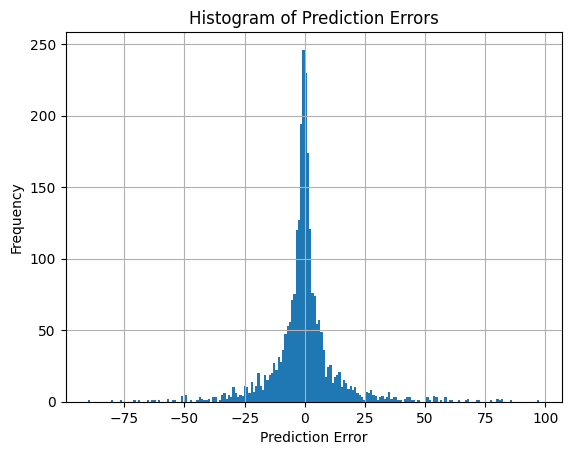

In [ ]:
import matplotlib.pyplot as plt

errors.hist(bins=200)
plt.xlabel("Prediction Error")   # x-axis label
plt.ylabel("Frequency")          # y-axis label
plt.title("Histogram of Prediction Errors")  # optional title
plt.show()

In [ ]:
!pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
from catboost import CatBoostRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import randint, uniform

# ------------------------------
# 1. CatBoost Regressor
# ------------------------------
cat_model = CatBoostRegressor(
    silent=True,
    random_state=42
)

# ------------------------------
# 2. Hyperparameter distribution for Random Search
# ------------------------------
param_distributions = {
    'n_estimators': randint(200, 800),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.5, 1.0),
    'colsample_bylevel': uniform(0.5, 0.5),
    'l2_leaf_reg': uniform(1, 10),
    'min_data_in_leaf': randint(1, 20),
    'bagging_temperature': uniform(0, 1)
}

# ------------------------------
# 3. Randomized Search
# ------------------------------
search = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=param_distributions,
    n_iter=20,
    scoring='neg_mean_absolute_error',
    cv=4,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# ------------------------------
# 4. Fit on training data
# ------------------------------
search.fit(X_train, y_train)

print("Best parameters:", search.best_params_)

# ------------------------------
# 5. Evaluate on test set
# ------------------------------
best_model = search.best_estimator_
preds = best_model.predict(X_test)

mae = mean_absolute_error(y_test, preds)
rmse = np.sqrt(mean_squared_error(y_test, preds))  # FIXED
std_error = np.std(y_test - preds)

print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"STD of prediction errors: {std_error:.4f}")


Fitting 4 folds for each of 20 candidates, totalling 80 fits


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/catboost/core.py", l

Best parameters: {'bagging_temperature': np.float64(0.10549425983027061), 'colsample_bylevel': np.float64(0.7282672852414551), 'l2_leaf_reg': np.float64(3.184404372168336), 'learning_rate': np.float64(0.13495298436110986), 'max_depth': 8, 'min_data_in_leaf': 11, 'n_estimators': 705, 'subsample': np.float64(0.6220879547006734)}
MAE: 10.6037
RMSE: 15.4617
STD of prediction errors: 15.4615
